In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from tensorflow.keras import Sequential, Model
from tensorflow.keras.layers import Flatten, Dense,  Input, Activation,Dropout,LeakyReLU, BatchNormalization, Reshape 
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import datasets

In [ ]:
def build_discriminator(input_shape=(28, 28,), verbose=True):

    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Flatten())
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(256))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(1, activation='sigmoid'))

    if verbose:
        model.summary()

    return model

In [ ]:
def build_generator(z_dim=100, output_shape=(28, 28), verbose=True):

    model = Sequential()
    model.add(Input(shape=(z_dim,)))
    model.add(Dense(256, input_dim=z_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.3))
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.3)) 
    model.add(Dense(1024))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.3))
    model.add(Dense(np.prod(output_shape), activation='tanh'))
    model.add(Reshape(output_shape))
    if verbose:
        model.summary()
    return model

In [ ]:
def train(generator=None,discriminator=None,gan_model=None,
          epochs=1000, batch_size=128, sample_interval=50,
          z_dim=100):
    (X_train, _), (_, _) = datasets.fashion_mnist.load_data()
    X_train = X_train / 127.5 - 1
    real_y = np.ones((batch_size, 1))
    fake_y = np.zeros((batch_size, 1))

    for epoch in range(epochs):
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        real_imgs = X_train[idx]
        noise = np.random.normal(0, 1, (batch_size, z_dim))
        fake_imgs = generator.predict(noise)
        disc_loss_real = discriminator.train_on_batch(real_imgs, real_y)
        disc_loss_fake = discriminator.train_on_batch(fake_imgs, fake_y)
        discriminator_loss = 0.5 * np.add(disc_loss_real, disc_loss_fake)
        noise = np.random.normal(0, 1, (batch_size, z_dim))
        gen_loss = gan_model.train_on_batch(noise, real_y)
        print ("%d [Discriminator loss: %f, acc.: %.2f%%] [Generator loss: %f]" % (epoch, discriminator_loss[0], 100*discriminator_loss[1], gen_loss))
        if epoch % sample_interval == 0:
            sample_images(epoch,generator)


In [ ]:
discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy',optimizer=Adam(0.0002, 0.5),metrics=['accuracy'])


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 512)               401920    
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 533,505
Trainable params: 533,505
Non-trai

In [ ]:
generator=build_generator()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 256)               25856     
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 256)               0         
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_4 (Dense)             (None, 512)               131584    
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 512)               0         
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 1024)             

In [ ]:
# Noise for generator
z_dim = 100
z = Input(shape=(z_dim,))
img = generator(z)

# Fix the discriminator
discriminator.trainable = False

# Get discriminator output
validity = discriminator(img)

# Stack discriminator on top of generator
gan_model = Model(z, validity)
gan_model.compile(loss='binary_crossentropy', optimizer=Adam(0.0001, 0.5))
gan_model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 100)]             0         
                                                                 
 sequential_1 (Sequential)   (None, 28, 28)            1486352   
                                                                 
 sequential (Sequential)     (None, 1)                 533505    
                                                                 
Total params: 2,019,857
Trainable params: 1,486,352
Non-trainable params: 533,505
_________________________________________________________________


In [ ]:
def sample_images(epoch, generator, z_dim=100,
                  save_output=True,
                  output_dir="/content/drive/MyDrive"):


    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, z_dim))
    gen_imgs = generator.predict(noise)

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    # get output shape
    output_shape = len(generator.output_shape)

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            if output_shape == 3:
                axs[i, j].imshow(gen_imgs[cnt, :, :], cmap='gray')
            else:
                axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            # if model_type == 'cgan':
            #     axs[i, j].set_title("Label: %d" % sampled_labels[cnt])
            axs[i, j].axis('off')
            cnt += 1
    plt.show()
    if save_output:
        fig.savefig("{}/{}.png".format(output_dir, epoch))
    plt.close()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


0 [Discriminator loss: 0.535629, acc.: 57.81%] [Generator loss: 0.683117]


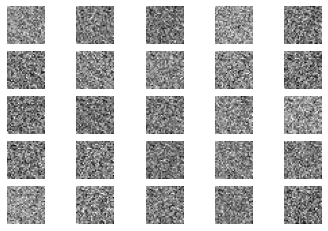

1 [Discriminator loss: 0.450081, acc.: 51.56%] [Generator loss: 0.693908]
2 [Discriminator loss: 0.462314, acc.: 51.56%] [Generator loss: 0.706093]
3 [Discriminator loss: 0.436377, acc.: 50.00%] [Generator loss: 0.727314]
4 [Discriminator loss: 0.423611, acc.: 51.56%] [Generator loss: 0.714718]
5 [Discriminator loss: 0.400281, acc.: 59.38%] [Generator loss: 0.747446]
6 [Discriminator loss: 0.384852, acc.: 65.62%] [Generator loss: 0.832722]
7 [Discriminator loss: 0.377600, acc.: 62.50%] [Generator loss: 0.868332]
8 [Discriminator loss: 0.365853, acc.: 75.00%] [Generator loss: 0.931823]
9 [Discriminator loss: 0.352231, acc.: 82.81%] [Generator loss: 0.958919]
10 [Discriminator loss: 0.344396, acc.: 85.94%] [Generator loss: 0.981486]
11 [Discriminator loss: 0.329599, acc.: 92.19%] [Generator loss: 1.058069]
12 [Discriminator loss: 0.323527, acc.: 95.31%] [Generator loss: 1.111451]
13 [Discriminator loss: 0.327868, acc.: 96.88%] [Generator loss: 1.125229]
14 [Discriminator loss: 0.315156, 

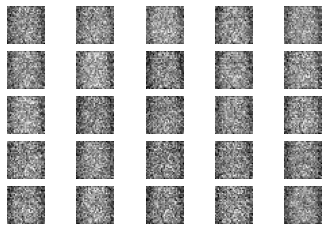

201 [Discriminator loss: 0.069713, acc.: 100.00%] [Generator loss: 3.599222]
202 [Discriminator loss: 0.076758, acc.: 98.44%] [Generator loss: 3.498562]
203 [Discriminator loss: 0.104933, acc.: 98.44%] [Generator loss: 3.243735]
204 [Discriminator loss: 0.059284, acc.: 100.00%] [Generator loss: 3.751112]
205 [Discriminator loss: 0.540335, acc.: 85.94%] [Generator loss: 2.129305]
206 [Discriminator loss: 0.111498, acc.: 100.00%] [Generator loss: 3.187993]
207 [Discriminator loss: 0.038951, acc.: 100.00%] [Generator loss: 3.897389]
208 [Discriminator loss: 0.094438, acc.: 96.88%] [Generator loss: 3.061081]
209 [Discriminator loss: 0.066570, acc.: 100.00%] [Generator loss: 3.289839]
210 [Discriminator loss: 0.085296, acc.: 100.00%] [Generator loss: 3.353028]
211 [Discriminator loss: 0.111415, acc.: 100.00%] [Generator loss: 3.170552]
212 [Discriminator loss: 0.153202, acc.: 100.00%] [Generator loss: 3.064858]
213 [Discriminator loss: 0.060684, acc.: 100.00%] [Generator loss: 3.732109]
214

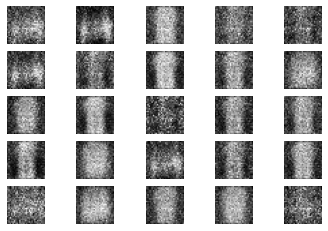

401 [Discriminator loss: 0.782008, acc.: 56.25%] [Generator loss: 2.103736]
402 [Discriminator loss: 0.187178, acc.: 100.00%] [Generator loss: 3.126286]
403 [Discriminator loss: 0.861028, acc.: 51.56%] [Generator loss: 1.524894]
404 [Discriminator loss: 0.225865, acc.: 92.19%] [Generator loss: 3.572087]
405 [Discriminator loss: 0.416856, acc.: 78.12%] [Generator loss: 1.978577]
406 [Discriminator loss: 0.201178, acc.: 95.31%] [Generator loss: 2.618269]
407 [Discriminator loss: 0.231194, acc.: 92.19%] [Generator loss: 2.951141]
408 [Discriminator loss: 0.838322, acc.: 50.00%] [Generator loss: 1.745250]
409 [Discriminator loss: 0.129384, acc.: 100.00%] [Generator loss: 3.258314]
410 [Discriminator loss: 0.298751, acc.: 90.62%] [Generator loss: 2.261495]
411 [Discriminator loss: 0.418631, acc.: 79.69%] [Generator loss: 2.903266]
412 [Discriminator loss: 0.599599, acc.: 75.00%] [Generator loss: 2.031671]
413 [Discriminator loss: 0.376135, acc.: 85.94%] [Generator loss: 3.109063]
414 [Discr

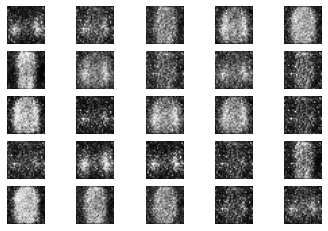

601 [Discriminator loss: 0.096745, acc.: 96.88%] [Generator loss: 3.289950]
602 [Discriminator loss: 0.158630, acc.: 96.88%] [Generator loss: 3.020189]
603 [Discriminator loss: 0.124301, acc.: 95.31%] [Generator loss: 3.487804]
604 [Discriminator loss: 0.137612, acc.: 95.31%] [Generator loss: 3.197767]
605 [Discriminator loss: 0.352420, acc.: 85.94%] [Generator loss: 3.641253]
606 [Discriminator loss: 0.132638, acc.: 93.75%] [Generator loss: 3.323067]
607 [Discriminator loss: 0.268057, acc.: 89.06%] [Generator loss: 3.013760]
608 [Discriminator loss: 0.110210, acc.: 98.44%] [Generator loss: 3.681794]
609 [Discriminator loss: 0.160656, acc.: 95.31%] [Generator loss: 3.364408]
610 [Discriminator loss: 0.171992, acc.: 95.31%] [Generator loss: 3.220294]
611 [Discriminator loss: 0.399295, acc.: 84.38%] [Generator loss: 4.594436]
612 [Discriminator loss: 0.201264, acc.: 92.19%] [Generator loss: 3.839969]
613 [Discriminator loss: 0.174366, acc.: 95.31%] [Generator loss: 3.112207]
614 [Discrim

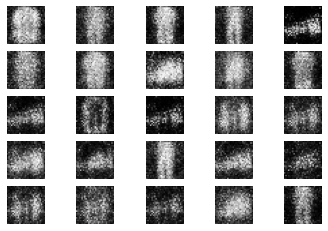

801 [Discriminator loss: 0.255678, acc.: 92.19%] [Generator loss: 2.618521]
802 [Discriminator loss: 0.355366, acc.: 85.94%] [Generator loss: 2.786821]
803 [Discriminator loss: 0.267477, acc.: 85.94%] [Generator loss: 2.706779]
804 [Discriminator loss: 0.262238, acc.: 82.81%] [Generator loss: 2.899156]
805 [Discriminator loss: 0.356974, acc.: 82.81%] [Generator loss: 2.908255]
806 [Discriminator loss: 0.508642, acc.: 76.56%] [Generator loss: 3.553458]
807 [Discriminator loss: 0.316823, acc.: 85.94%] [Generator loss: 2.679589]
808 [Discriminator loss: 0.402886, acc.: 78.12%] [Generator loss: 2.959757]
809 [Discriminator loss: 0.279888, acc.: 87.50%] [Generator loss: 2.987870]
810 [Discriminator loss: 0.274149, acc.: 87.50%] [Generator loss: 3.659274]
811 [Discriminator loss: 0.588989, acc.: 76.56%] [Generator loss: 2.196930]
812 [Discriminator loss: 0.467738, acc.: 71.88%] [Generator loss: 2.648630]
813 [Discriminator loss: 0.202779, acc.: 95.31%] [Generator loss: 2.770948]
814 [Discrim

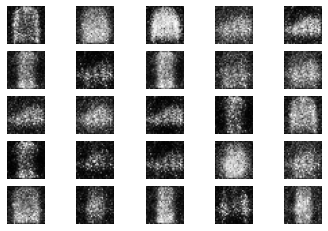

1001 [Discriminator loss: 0.486502, acc.: 84.38%] [Generator loss: 2.213164]
1002 [Discriminator loss: 0.377421, acc.: 84.38%] [Generator loss: 2.690222]
1003 [Discriminator loss: 0.287649, acc.: 90.62%] [Generator loss: 2.692868]
1004 [Discriminator loss: 0.360290, acc.: 84.38%] [Generator loss: 2.242174]
1005 [Discriminator loss: 0.490016, acc.: 78.12%] [Generator loss: 2.012658]
1006 [Discriminator loss: 0.485625, acc.: 75.00%] [Generator loss: 2.106995]
1007 [Discriminator loss: 0.549546, acc.: 70.31%] [Generator loss: 2.420419]
1008 [Discriminator loss: 0.371589, acc.: 84.38%] [Generator loss: 2.298393]
1009 [Discriminator loss: 0.360892, acc.: 85.94%] [Generator loss: 2.368218]
1010 [Discriminator loss: 0.566048, acc.: 70.31%] [Generator loss: 2.395176]
1011 [Discriminator loss: 0.155563, acc.: 95.31%] [Generator loss: 3.134222]
1012 [Discriminator loss: 0.476456, acc.: 81.25%] [Generator loss: 2.248239]
1013 [Discriminator loss: 0.474454, acc.: 76.56%] [Generator loss: 2.396767]

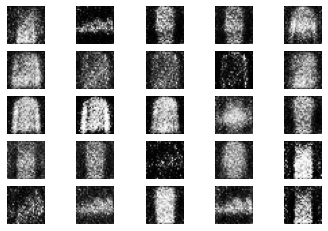

1201 [Discriminator loss: 0.189888, acc.: 96.88%] [Generator loss: 2.619270]
1202 [Discriminator loss: 0.412218, acc.: 78.12%] [Generator loss: 2.498655]
1203 [Discriminator loss: 0.345671, acc.: 81.25%] [Generator loss: 2.679810]
1204 [Discriminator loss: 0.227468, acc.: 90.62%] [Generator loss: 3.120204]
1205 [Discriminator loss: 0.415035, acc.: 82.81%] [Generator loss: 2.553421]
1206 [Discriminator loss: 0.253263, acc.: 87.50%] [Generator loss: 3.025168]
1207 [Discriminator loss: 0.440417, acc.: 84.38%] [Generator loss: 2.427456]
1208 [Discriminator loss: 0.368839, acc.: 81.25%] [Generator loss: 2.790852]
1209 [Discriminator loss: 0.304113, acc.: 87.50%] [Generator loss: 2.920580]
1210 [Discriminator loss: 0.295749, acc.: 89.06%] [Generator loss: 2.534959]
1211 [Discriminator loss: 0.332986, acc.: 84.38%] [Generator loss: 2.495917]
1212 [Discriminator loss: 0.379377, acc.: 82.81%] [Generator loss: 2.619887]
1213 [Discriminator loss: 0.254457, acc.: 92.19%] [Generator loss: 3.071668]

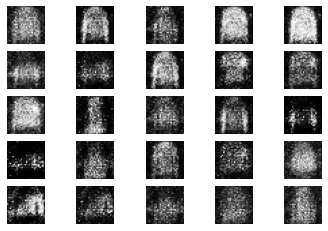

1401 [Discriminator loss: 0.328428, acc.: 87.50%] [Generator loss: 2.406487]
1402 [Discriminator loss: 0.289473, acc.: 90.62%] [Generator loss: 2.784202]
1403 [Discriminator loss: 0.481030, acc.: 76.56%] [Generator loss: 2.502939]
1404 [Discriminator loss: 0.608625, acc.: 75.00%] [Generator loss: 2.585159]
1405 [Discriminator loss: 0.318472, acc.: 87.50%] [Generator loss: 2.168510]
1406 [Discriminator loss: 0.299147, acc.: 87.50%] [Generator loss: 2.355920]
1407 [Discriminator loss: 0.199219, acc.: 95.31%] [Generator loss: 2.439835]
1408 [Discriminator loss: 0.498797, acc.: 75.00%] [Generator loss: 2.048422]
1409 [Discriminator loss: 0.230692, acc.: 95.31%] [Generator loss: 2.856904]
1410 [Discriminator loss: 0.319793, acc.: 84.38%] [Generator loss: 2.536982]
1411 [Discriminator loss: 0.510364, acc.: 75.00%] [Generator loss: 2.412849]
1412 [Discriminator loss: 0.327522, acc.: 79.69%] [Generator loss: 2.644254]
1413 [Discriminator loss: 0.306229, acc.: 89.06%] [Generator loss: 2.342469]

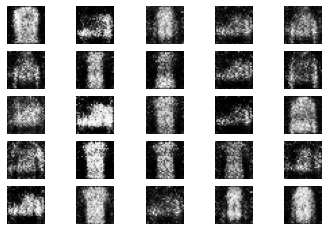

1601 [Discriminator loss: 0.410542, acc.: 81.25%] [Generator loss: 2.550362]
1602 [Discriminator loss: 0.290275, acc.: 87.50%] [Generator loss: 2.525485]
1603 [Discriminator loss: 0.432006, acc.: 82.81%] [Generator loss: 2.618193]
1604 [Discriminator loss: 0.387126, acc.: 81.25%] [Generator loss: 2.695945]
1605 [Discriminator loss: 0.400282, acc.: 82.81%] [Generator loss: 2.735750]
1606 [Discriminator loss: 0.702861, acc.: 59.38%] [Generator loss: 1.933102]
1607 [Discriminator loss: 0.439680, acc.: 79.69%] [Generator loss: 2.795141]
1608 [Discriminator loss: 0.431588, acc.: 81.25%] [Generator loss: 2.301801]
1609 [Discriminator loss: 0.266522, acc.: 92.19%] [Generator loss: 2.625603]
1610 [Discriminator loss: 0.431553, acc.: 78.12%] [Generator loss: 2.310300]
1611 [Discriminator loss: 0.366661, acc.: 82.81%] [Generator loss: 2.525551]
1612 [Discriminator loss: 0.381094, acc.: 85.94%] [Generator loss: 2.757949]
1613 [Discriminator loss: 0.477618, acc.: 78.12%] [Generator loss: 2.518676]

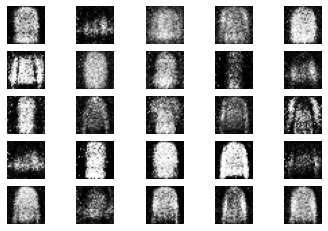

1801 [Discriminator loss: 0.310683, acc.: 85.94%] [Generator loss: 2.234746]
1802 [Discriminator loss: 0.450591, acc.: 78.12%] [Generator loss: 2.148078]
1803 [Discriminator loss: 0.349567, acc.: 85.94%] [Generator loss: 2.268686]
1804 [Discriminator loss: 0.407053, acc.: 81.25%] [Generator loss: 1.794421]
1805 [Discriminator loss: 0.473820, acc.: 78.12%] [Generator loss: 1.930066]
1806 [Discriminator loss: 0.337888, acc.: 85.94%] [Generator loss: 2.592208]
1807 [Discriminator loss: 0.454207, acc.: 75.00%] [Generator loss: 2.188776]
1808 [Discriminator loss: 0.430838, acc.: 76.56%] [Generator loss: 1.773735]
1809 [Discriminator loss: 0.390669, acc.: 78.12%] [Generator loss: 2.260837]
1810 [Discriminator loss: 0.336639, acc.: 85.94%] [Generator loss: 2.463508]
1811 [Discriminator loss: 0.417129, acc.: 81.25%] [Generator loss: 2.144457]
1812 [Discriminator loss: 0.333566, acc.: 82.81%] [Generator loss: 2.437717]
1813 [Discriminator loss: 0.254197, acc.: 95.31%] [Generator loss: 2.897712]

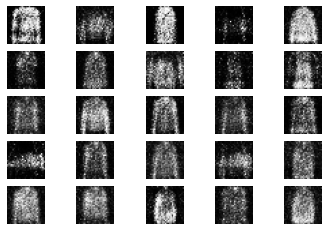

2001 [Discriminator loss: 0.284993, acc.: 87.50%] [Generator loss: 2.567200]
2002 [Discriminator loss: 0.421879, acc.: 82.81%] [Generator loss: 2.006489]
2003 [Discriminator loss: 0.392765, acc.: 84.38%] [Generator loss: 2.393356]
2004 [Discriminator loss: 0.332664, acc.: 85.94%] [Generator loss: 2.214846]
2005 [Discriminator loss: 0.364806, acc.: 85.94%] [Generator loss: 2.281173]
2006 [Discriminator loss: 0.476930, acc.: 79.69%] [Generator loss: 2.540753]
2007 [Discriminator loss: 0.257734, acc.: 92.19%] [Generator loss: 2.475374]
2008 [Discriminator loss: 0.392739, acc.: 82.81%] [Generator loss: 2.380702]
2009 [Discriminator loss: 0.429176, acc.: 81.25%] [Generator loss: 2.387385]
2010 [Discriminator loss: 0.438484, acc.: 79.69%] [Generator loss: 2.498319]
2011 [Discriminator loss: 0.446305, acc.: 84.38%] [Generator loss: 2.400465]
2012 [Discriminator loss: 0.278624, acc.: 90.62%] [Generator loss: 2.680675]
2013 [Discriminator loss: 0.562274, acc.: 73.44%] [Generator loss: 2.196055]

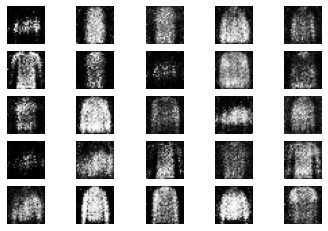

2201 [Discriminator loss: 0.329948, acc.: 85.94%] [Generator loss: 2.254296]
2202 [Discriminator loss: 0.401306, acc.: 79.69%] [Generator loss: 1.862721]
2203 [Discriminator loss: 0.487281, acc.: 73.44%] [Generator loss: 2.272998]
2204 [Discriminator loss: 0.314665, acc.: 90.62%] [Generator loss: 2.348384]
2205 [Discriminator loss: 0.539225, acc.: 76.56%] [Generator loss: 1.856976]
2206 [Discriminator loss: 0.378212, acc.: 82.81%] [Generator loss: 2.509678]
2207 [Discriminator loss: 0.342885, acc.: 87.50%] [Generator loss: 2.307174]
2208 [Discriminator loss: 0.309502, acc.: 90.62%] [Generator loss: 2.243183]
2209 [Discriminator loss: 0.280399, acc.: 93.75%] [Generator loss: 2.065798]
2210 [Discriminator loss: 0.347236, acc.: 84.38%] [Generator loss: 1.886307]
2211 [Discriminator loss: 0.305008, acc.: 87.50%] [Generator loss: 2.225353]
2212 [Discriminator loss: 0.312740, acc.: 89.06%] [Generator loss: 2.100997]
2213 [Discriminator loss: 0.403110, acc.: 81.25%] [Generator loss: 1.957488]

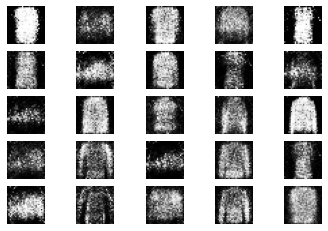

2401 [Discriminator loss: 0.526594, acc.: 75.00%] [Generator loss: 2.436302]
2402 [Discriminator loss: 0.529236, acc.: 70.31%] [Generator loss: 2.508744]
2403 [Discriminator loss: 0.415057, acc.: 87.50%] [Generator loss: 2.197855]
2404 [Discriminator loss: 0.318459, acc.: 87.50%] [Generator loss: 2.499914]
2405 [Discriminator loss: 0.475461, acc.: 79.69%] [Generator loss: 2.182918]
2406 [Discriminator loss: 0.378848, acc.: 79.69%] [Generator loss: 2.053864]
2407 [Discriminator loss: 0.493673, acc.: 78.12%] [Generator loss: 1.908057]
2408 [Discriminator loss: 0.399971, acc.: 85.94%] [Generator loss: 2.010335]
2409 [Discriminator loss: 0.487490, acc.: 78.12%] [Generator loss: 1.957709]
2410 [Discriminator loss: 0.425876, acc.: 79.69%] [Generator loss: 1.937507]
2411 [Discriminator loss: 0.669103, acc.: 62.50%] [Generator loss: 2.484412]
2412 [Discriminator loss: 0.433877, acc.: 87.50%] [Generator loss: 2.240290]
2413 [Discriminator loss: 0.447378, acc.: 79.69%] [Generator loss: 1.711457]

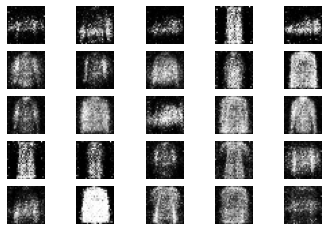

2601 [Discriminator loss: 0.403047, acc.: 76.56%] [Generator loss: 2.179842]
2602 [Discriminator loss: 0.423529, acc.: 79.69%] [Generator loss: 2.543671]
2603 [Discriminator loss: 0.503605, acc.: 71.88%] [Generator loss: 1.933911]
2604 [Discriminator loss: 0.386522, acc.: 84.38%] [Generator loss: 2.200258]
2605 [Discriminator loss: 0.506701, acc.: 76.56%] [Generator loss: 2.247277]
2606 [Discriminator loss: 0.392171, acc.: 79.69%] [Generator loss: 1.658066]
2607 [Discriminator loss: 0.383613, acc.: 87.50%] [Generator loss: 1.962691]
2608 [Discriminator loss: 0.314585, acc.: 85.94%] [Generator loss: 2.304389]
2609 [Discriminator loss: 0.436042, acc.: 78.12%] [Generator loss: 1.845148]
2610 [Discriminator loss: 0.400443, acc.: 78.12%] [Generator loss: 2.286400]
2611 [Discriminator loss: 0.461739, acc.: 78.12%] [Generator loss: 2.391097]
2612 [Discriminator loss: 0.522925, acc.: 76.56%] [Generator loss: 1.868495]
2613 [Discriminator loss: 0.405418, acc.: 79.69%] [Generator loss: 1.872511]

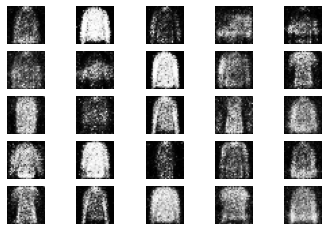

2801 [Discriminator loss: 0.384277, acc.: 89.06%] [Generator loss: 2.176934]
2802 [Discriminator loss: 0.408048, acc.: 84.38%] [Generator loss: 1.827233]
2803 [Discriminator loss: 0.453920, acc.: 78.12%] [Generator loss: 2.016593]
2804 [Discriminator loss: 0.398817, acc.: 81.25%] [Generator loss: 2.002057]
2805 [Discriminator loss: 0.477105, acc.: 75.00%] [Generator loss: 1.872288]
2806 [Discriminator loss: 0.432698, acc.: 79.69%] [Generator loss: 1.922464]
2807 [Discriminator loss: 0.418878, acc.: 78.12%] [Generator loss: 2.062134]
2808 [Discriminator loss: 0.330308, acc.: 85.94%] [Generator loss: 2.146278]
2809 [Discriminator loss: 0.420567, acc.: 82.81%] [Generator loss: 2.050351]
2810 [Discriminator loss: 0.465636, acc.: 82.81%] [Generator loss: 1.850256]
2811 [Discriminator loss: 0.377657, acc.: 84.38%] [Generator loss: 2.009468]
2812 [Discriminator loss: 0.315358, acc.: 84.38%] [Generator loss: 2.055518]
2813 [Discriminator loss: 0.431929, acc.: 79.69%] [Generator loss: 1.799797]

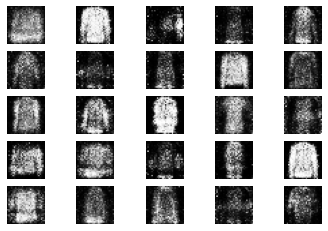

3001 [Discriminator loss: 0.459035, acc.: 82.81%] [Generator loss: 2.090772]
3002 [Discriminator loss: 0.386076, acc.: 82.81%] [Generator loss: 2.216920]
3003 [Discriminator loss: 0.563491, acc.: 71.88%] [Generator loss: 1.739354]
3004 [Discriminator loss: 0.420610, acc.: 81.25%] [Generator loss: 1.573851]
3005 [Discriminator loss: 0.449965, acc.: 79.69%] [Generator loss: 1.889693]
3006 [Discriminator loss: 0.377251, acc.: 89.06%] [Generator loss: 2.146347]
3007 [Discriminator loss: 0.365291, acc.: 87.50%] [Generator loss: 2.007849]
3008 [Discriminator loss: 0.353723, acc.: 84.38%] [Generator loss: 2.187771]
3009 [Discriminator loss: 0.295815, acc.: 89.06%] [Generator loss: 2.170949]
3010 [Discriminator loss: 0.461819, acc.: 75.00%] [Generator loss: 1.851452]
3011 [Discriminator loss: 0.459370, acc.: 79.69%] [Generator loss: 1.576100]
3012 [Discriminator loss: 0.383921, acc.: 84.38%] [Generator loss: 2.082427]
3013 [Discriminator loss: 0.347402, acc.: 85.94%] [Generator loss: 2.139143]

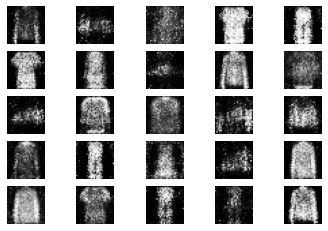

3201 [Discriminator loss: 0.602628, acc.: 65.62%] [Generator loss: 2.220191]
3202 [Discriminator loss: 0.491270, acc.: 78.12%] [Generator loss: 2.309457]
3203 [Discriminator loss: 0.549580, acc.: 68.75%] [Generator loss: 1.908876]
3204 [Discriminator loss: 0.493416, acc.: 78.12%] [Generator loss: 2.072582]
3205 [Discriminator loss: 0.516041, acc.: 71.88%] [Generator loss: 1.794922]
3206 [Discriminator loss: 0.428966, acc.: 81.25%] [Generator loss: 1.804749]
3207 [Discriminator loss: 0.401820, acc.: 82.81%] [Generator loss: 2.149178]
3208 [Discriminator loss: 0.228608, acc.: 93.75%] [Generator loss: 2.063035]
3209 [Discriminator loss: 0.394176, acc.: 82.81%] [Generator loss: 1.942819]
3210 [Discriminator loss: 0.462251, acc.: 76.56%] [Generator loss: 2.240544]
3211 [Discriminator loss: 0.561328, acc.: 75.00%] [Generator loss: 1.811595]
3212 [Discriminator loss: 0.384728, acc.: 82.81%] [Generator loss: 2.081018]
3213 [Discriminator loss: 0.389653, acc.: 82.81%] [Generator loss: 1.858177]

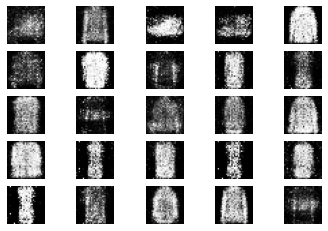

3401 [Discriminator loss: 0.314705, acc.: 89.06%] [Generator loss: 2.249634]
3402 [Discriminator loss: 0.347240, acc.: 84.38%] [Generator loss: 2.080104]
3403 [Discriminator loss: 0.374148, acc.: 82.81%] [Generator loss: 1.754601]
3404 [Discriminator loss: 0.384467, acc.: 85.94%] [Generator loss: 2.177455]
3405 [Discriminator loss: 0.261676, acc.: 93.75%] [Generator loss: 2.377141]
3406 [Discriminator loss: 0.396323, acc.: 84.38%] [Generator loss: 2.145562]
3407 [Discriminator loss: 0.318664, acc.: 90.62%] [Generator loss: 1.832268]
3408 [Discriminator loss: 0.565130, acc.: 76.56%] [Generator loss: 2.309914]
3409 [Discriminator loss: 0.356669, acc.: 84.38%] [Generator loss: 2.067374]
3410 [Discriminator loss: 0.474869, acc.: 76.56%] [Generator loss: 1.589717]
3411 [Discriminator loss: 0.302880, acc.: 90.62%] [Generator loss: 1.931893]
3412 [Discriminator loss: 0.388408, acc.: 82.81%] [Generator loss: 1.921767]
3413 [Discriminator loss: 0.374367, acc.: 82.81%] [Generator loss: 2.029117]

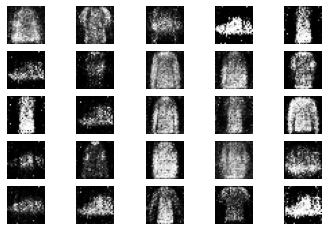

3601 [Discriminator loss: 0.452849, acc.: 78.12%] [Generator loss: 1.644078]
3602 [Discriminator loss: 0.422109, acc.: 78.12%] [Generator loss: 1.829202]
3603 [Discriminator loss: 0.362317, acc.: 84.38%] [Generator loss: 2.063437]
3604 [Discriminator loss: 0.336842, acc.: 85.94%] [Generator loss: 2.019791]
3605 [Discriminator loss: 0.345622, acc.: 89.06%] [Generator loss: 2.065209]
3606 [Discriminator loss: 0.396412, acc.: 84.38%] [Generator loss: 1.972043]
3607 [Discriminator loss: 0.419584, acc.: 79.69%] [Generator loss: 2.145626]
3608 [Discriminator loss: 0.429308, acc.: 81.25%] [Generator loss: 2.190738]
3609 [Discriminator loss: 0.364619, acc.: 84.38%] [Generator loss: 2.259624]
3610 [Discriminator loss: 0.351934, acc.: 87.50%] [Generator loss: 2.355383]
3611 [Discriminator loss: 0.483492, acc.: 78.12%] [Generator loss: 2.432368]
3612 [Discriminator loss: 0.327846, acc.: 82.81%] [Generator loss: 2.378196]
3613 [Discriminator loss: 0.584769, acc.: 75.00%] [Generator loss: 1.742274]

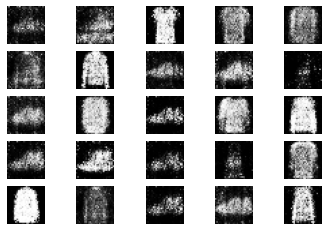

3801 [Discriminator loss: 0.474083, acc.: 78.12%] [Generator loss: 2.058392]
3802 [Discriminator loss: 0.510932, acc.: 75.00%] [Generator loss: 2.020807]
3803 [Discriminator loss: 0.261484, acc.: 90.62%] [Generator loss: 2.049854]
3804 [Discriminator loss: 0.473622, acc.: 75.00%] [Generator loss: 1.906994]
3805 [Discriminator loss: 0.427249, acc.: 79.69%] [Generator loss: 2.084882]
3806 [Discriminator loss: 0.418139, acc.: 76.56%] [Generator loss: 1.889348]
3807 [Discriminator loss: 0.400881, acc.: 82.81%] [Generator loss: 2.068652]
3808 [Discriminator loss: 0.516324, acc.: 76.56%] [Generator loss: 1.905549]
3809 [Discriminator loss: 0.266930, acc.: 92.19%] [Generator loss: 2.289156]
3810 [Discriminator loss: 0.385961, acc.: 82.81%] [Generator loss: 1.726750]
3811 [Discriminator loss: 0.477410, acc.: 76.56%] [Generator loss: 1.672115]
3812 [Discriminator loss: 0.470274, acc.: 76.56%] [Generator loss: 1.785383]
3813 [Discriminator loss: 0.447502, acc.: 78.12%] [Generator loss: 2.234779]

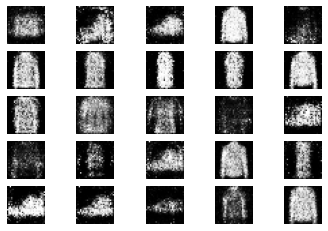

4001 [Discriminator loss: 0.499521, acc.: 79.69%] [Generator loss: 1.895552]
4002 [Discriminator loss: 0.436836, acc.: 78.12%] [Generator loss: 1.955351]
4003 [Discriminator loss: 0.399084, acc.: 79.69%] [Generator loss: 1.798671]
4004 [Discriminator loss: 0.406103, acc.: 79.69%] [Generator loss: 1.853630]
4005 [Discriminator loss: 0.397834, acc.: 82.81%] [Generator loss: 1.993779]
4006 [Discriminator loss: 0.347427, acc.: 87.50%] [Generator loss: 1.930164]
4007 [Discriminator loss: 0.533895, acc.: 76.56%] [Generator loss: 1.754903]
4008 [Discriminator loss: 0.409103, acc.: 82.81%] [Generator loss: 2.035302]
4009 [Discriminator loss: 0.483023, acc.: 73.44%] [Generator loss: 2.148286]
4010 [Discriminator loss: 0.502470, acc.: 73.44%] [Generator loss: 1.618867]
4011 [Discriminator loss: 0.425038, acc.: 81.25%] [Generator loss: 2.120274]
4012 [Discriminator loss: 0.488707, acc.: 75.00%] [Generator loss: 1.933219]
4013 [Discriminator loss: 0.551734, acc.: 70.31%] [Generator loss: 1.692526]

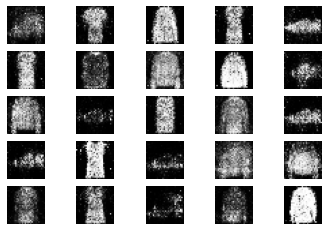

4201 [Discriminator loss: 0.420668, acc.: 82.81%] [Generator loss: 2.095569]
4202 [Discriminator loss: 0.365856, acc.: 87.50%] [Generator loss: 2.150990]
4203 [Discriminator loss: 0.556344, acc.: 73.44%] [Generator loss: 1.543501]
4204 [Discriminator loss: 0.551520, acc.: 67.19%] [Generator loss: 1.788283]
4205 [Discriminator loss: 0.499530, acc.: 71.88%] [Generator loss: 2.056228]
4206 [Discriminator loss: 0.525801, acc.: 78.12%] [Generator loss: 2.141837]
4207 [Discriminator loss: 0.375012, acc.: 79.69%] [Generator loss: 1.929018]
4208 [Discriminator loss: 0.360240, acc.: 85.94%] [Generator loss: 1.810034]
4209 [Discriminator loss: 0.525179, acc.: 71.88%] [Generator loss: 1.955825]
4210 [Discriminator loss: 0.379444, acc.: 84.38%] [Generator loss: 2.095998]
4211 [Discriminator loss: 0.353891, acc.: 87.50%] [Generator loss: 1.862468]
4212 [Discriminator loss: 0.537584, acc.: 73.44%] [Generator loss: 1.834279]
4213 [Discriminator loss: 0.442152, acc.: 81.25%] [Generator loss: 1.903212]

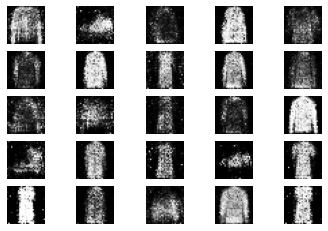

4401 [Discriminator loss: 0.376556, acc.: 82.81%] [Generator loss: 1.735349]
4402 [Discriminator loss: 0.453108, acc.: 82.81%] [Generator loss: 1.861330]
4403 [Discriminator loss: 0.467594, acc.: 82.81%] [Generator loss: 1.833145]
4404 [Discriminator loss: 0.477771, acc.: 78.12%] [Generator loss: 1.682847]
4405 [Discriminator loss: 0.454583, acc.: 76.56%] [Generator loss: 2.130065]
4406 [Discriminator loss: 0.342976, acc.: 87.50%] [Generator loss: 2.102787]
4407 [Discriminator loss: 0.314350, acc.: 85.94%] [Generator loss: 1.909214]
4408 [Discriminator loss: 0.399284, acc.: 84.38%] [Generator loss: 1.641084]
4409 [Discriminator loss: 0.424641, acc.: 79.69%] [Generator loss: 2.130034]
4410 [Discriminator loss: 0.420510, acc.: 82.81%] [Generator loss: 2.020730]
4411 [Discriminator loss: 0.444089, acc.: 84.38%] [Generator loss: 1.796928]
4412 [Discriminator loss: 0.373616, acc.: 85.94%] [Generator loss: 2.022146]
4413 [Discriminator loss: 0.620724, acc.: 67.19%] [Generator loss: 2.018084]

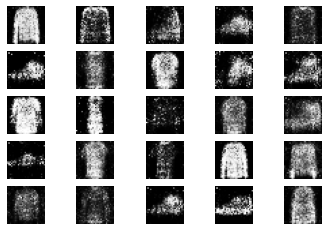

4601 [Discriminator loss: 0.357131, acc.: 85.94%] [Generator loss: 2.054442]
4602 [Discriminator loss: 0.583065, acc.: 67.19%] [Generator loss: 1.805205]
4603 [Discriminator loss: 0.400155, acc.: 79.69%] [Generator loss: 1.705765]
4604 [Discriminator loss: 0.485907, acc.: 75.00%] [Generator loss: 1.930676]
4605 [Discriminator loss: 0.390144, acc.: 82.81%] [Generator loss: 1.972597]
4606 [Discriminator loss: 0.433958, acc.: 81.25%] [Generator loss: 2.133158]
4607 [Discriminator loss: 0.488063, acc.: 78.12%] [Generator loss: 2.105730]
4608 [Discriminator loss: 0.474900, acc.: 73.44%] [Generator loss: 1.991798]
4609 [Discriminator loss: 0.436450, acc.: 76.56%] [Generator loss: 1.886196]
4610 [Discriminator loss: 0.576422, acc.: 67.19%] [Generator loss: 1.784522]
4611 [Discriminator loss: 0.448246, acc.: 81.25%] [Generator loss: 2.011503]
4612 [Discriminator loss: 0.477422, acc.: 79.69%] [Generator loss: 1.860811]
4613 [Discriminator loss: 0.485588, acc.: 79.69%] [Generator loss: 1.507904]

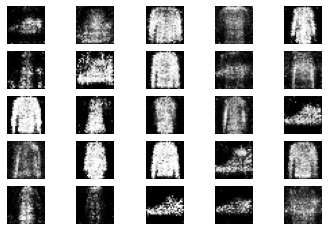

4801 [Discriminator loss: 0.396709, acc.: 81.25%] [Generator loss: 1.995156]
4802 [Discriminator loss: 0.429534, acc.: 79.69%] [Generator loss: 2.173301]
4803 [Discriminator loss: 0.445449, acc.: 75.00%] [Generator loss: 1.800783]
4804 [Discriminator loss: 0.586857, acc.: 62.50%] [Generator loss: 1.571078]
4805 [Discriminator loss: 0.515996, acc.: 70.31%] [Generator loss: 1.849142]
4806 [Discriminator loss: 0.356725, acc.: 84.38%] [Generator loss: 1.950205]
4807 [Discriminator loss: 0.334976, acc.: 89.06%] [Generator loss: 1.848676]
4808 [Discriminator loss: 0.553805, acc.: 75.00%] [Generator loss: 1.968597]
4809 [Discriminator loss: 0.404950, acc.: 81.25%] [Generator loss: 2.182699]
4810 [Discriminator loss: 0.383214, acc.: 81.25%] [Generator loss: 1.991601]
4811 [Discriminator loss: 0.416667, acc.: 76.56%] [Generator loss: 1.708855]
4812 [Discriminator loss: 0.406061, acc.: 85.94%] [Generator loss: 1.835837]
4813 [Discriminator loss: 0.515859, acc.: 73.44%] [Generator loss: 1.483068]

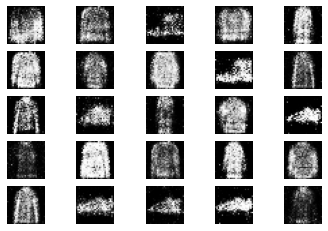

5001 [Discriminator loss: 0.336783, acc.: 89.06%] [Generator loss: 2.071111]
5002 [Discriminator loss: 0.375404, acc.: 82.81%] [Generator loss: 2.066425]
5003 [Discriminator loss: 0.592976, acc.: 70.31%] [Generator loss: 1.749049]
5004 [Discriminator loss: 0.587433, acc.: 70.31%] [Generator loss: 1.648350]
5005 [Discriminator loss: 0.565852, acc.: 68.75%] [Generator loss: 1.703859]
5006 [Discriminator loss: 0.558687, acc.: 71.88%] [Generator loss: 1.565826]
5007 [Discriminator loss: 0.539005, acc.: 70.31%] [Generator loss: 1.895370]
5008 [Discriminator loss: 0.331109, acc.: 90.62%] [Generator loss: 1.974343]
5009 [Discriminator loss: 0.472090, acc.: 71.88%] [Generator loss: 1.925765]
5010 [Discriminator loss: 0.513269, acc.: 73.44%] [Generator loss: 1.627979]
5011 [Discriminator loss: 0.479993, acc.: 75.00%] [Generator loss: 2.009174]
5012 [Discriminator loss: 0.524636, acc.: 71.88%] [Generator loss: 1.721394]
5013 [Discriminator loss: 0.510518, acc.: 78.12%] [Generator loss: 1.615809]

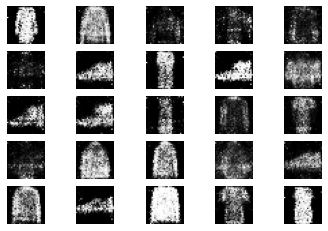

5201 [Discriminator loss: 0.446937, acc.: 79.69%] [Generator loss: 2.203961]
5202 [Discriminator loss: 0.483759, acc.: 79.69%] [Generator loss: 2.015626]
5203 [Discriminator loss: 0.517055, acc.: 70.31%] [Generator loss: 1.659993]
5204 [Discriminator loss: 0.468444, acc.: 81.25%] [Generator loss: 1.682786]
5205 [Discriminator loss: 0.450712, acc.: 73.44%] [Generator loss: 1.786956]
5206 [Discriminator loss: 0.491990, acc.: 79.69%] [Generator loss: 1.902683]
5207 [Discriminator loss: 0.335105, acc.: 87.50%] [Generator loss: 1.842129]
5208 [Discriminator loss: 0.390311, acc.: 84.38%] [Generator loss: 2.117717]
5209 [Discriminator loss: 0.554027, acc.: 70.31%] [Generator loss: 1.601728]
5210 [Discriminator loss: 0.292527, acc.: 92.19%] [Generator loss: 1.735509]
5211 [Discriminator loss: 0.455604, acc.: 82.81%] [Generator loss: 1.756110]
5212 [Discriminator loss: 0.368686, acc.: 82.81%] [Generator loss: 2.029844]
5213 [Discriminator loss: 0.421057, acc.: 85.94%] [Generator loss: 1.797435]

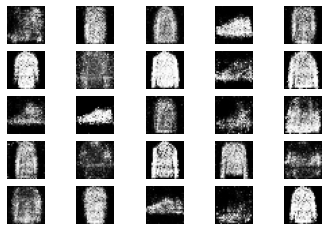

5401 [Discriminator loss: 0.431029, acc.: 81.25%] [Generator loss: 1.632477]
5402 [Discriminator loss: 0.493261, acc.: 70.31%] [Generator loss: 1.832036]
5403 [Discriminator loss: 0.418946, acc.: 82.81%] [Generator loss: 1.709017]
5404 [Discriminator loss: 0.523904, acc.: 76.56%] [Generator loss: 1.636221]
5405 [Discriminator loss: 0.594394, acc.: 67.19%] [Generator loss: 1.712373]
5406 [Discriminator loss: 0.549772, acc.: 73.44%] [Generator loss: 1.972951]
5407 [Discriminator loss: 0.543593, acc.: 79.69%] [Generator loss: 1.670617]
5408 [Discriminator loss: 0.511615, acc.: 76.56%] [Generator loss: 1.411286]
5409 [Discriminator loss: 0.493180, acc.: 73.44%] [Generator loss: 1.659296]
5410 [Discriminator loss: 0.380586, acc.: 85.94%] [Generator loss: 1.635359]
5411 [Discriminator loss: 0.419446, acc.: 84.38%] [Generator loss: 2.003292]
5412 [Discriminator loss: 0.405141, acc.: 79.69%] [Generator loss: 1.835793]
5413 [Discriminator loss: 0.513098, acc.: 64.06%] [Generator loss: 1.823430]

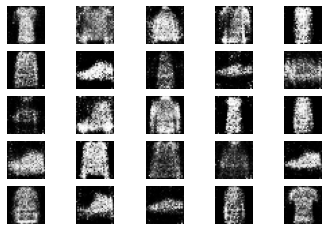

5601 [Discriminator loss: 0.629763, acc.: 65.62%] [Generator loss: 1.577015]
5602 [Discriminator loss: 0.455911, acc.: 79.69%] [Generator loss: 1.751539]
5603 [Discriminator loss: 0.416139, acc.: 82.81%] [Generator loss: 1.795469]
5604 [Discriminator loss: 0.453477, acc.: 79.69%] [Generator loss: 1.824536]
5605 [Discriminator loss: 0.387890, acc.: 82.81%] [Generator loss: 1.551846]
5606 [Discriminator loss: 0.593741, acc.: 67.19%] [Generator loss: 1.409911]
5607 [Discriminator loss: 0.518526, acc.: 71.88%] [Generator loss: 1.480229]
5608 [Discriminator loss: 0.446382, acc.: 75.00%] [Generator loss: 1.943382]
5609 [Discriminator loss: 0.388836, acc.: 84.38%] [Generator loss: 1.851237]
5610 [Discriminator loss: 0.588637, acc.: 68.75%] [Generator loss: 1.191208]
5611 [Discriminator loss: 0.499895, acc.: 78.12%] [Generator loss: 1.415338]
5612 [Discriminator loss: 0.424596, acc.: 81.25%] [Generator loss: 1.737643]
5613 [Discriminator loss: 0.387917, acc.: 84.38%] [Generator loss: 1.721277]

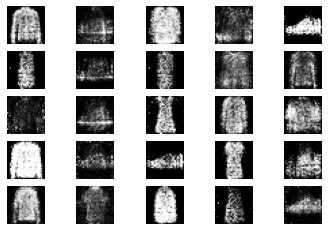

5801 [Discriminator loss: 0.588718, acc.: 62.50%] [Generator loss: 1.623349]
5802 [Discriminator loss: 0.331070, acc.: 85.94%] [Generator loss: 1.929950]
5803 [Discriminator loss: 0.347505, acc.: 85.94%] [Generator loss: 2.071841]
5804 [Discriminator loss: 0.430896, acc.: 82.81%] [Generator loss: 2.075674]
5805 [Discriminator loss: 0.603059, acc.: 70.31%] [Generator loss: 1.709996]
5806 [Discriminator loss: 0.656673, acc.: 73.44%] [Generator loss: 1.731326]
5807 [Discriminator loss: 0.400521, acc.: 85.94%] [Generator loss: 1.839543]
5808 [Discriminator loss: 0.553023, acc.: 67.19%] [Generator loss: 1.665712]
5809 [Discriminator loss: 0.515091, acc.: 76.56%] [Generator loss: 1.623688]
5810 [Discriminator loss: 0.441850, acc.: 79.69%] [Generator loss: 1.832023]
5811 [Discriminator loss: 0.435109, acc.: 82.81%] [Generator loss: 1.767008]
5812 [Discriminator loss: 0.438751, acc.: 81.25%] [Generator loss: 1.457479]
5813 [Discriminator loss: 0.460181, acc.: 78.12%] [Generator loss: 1.307577]

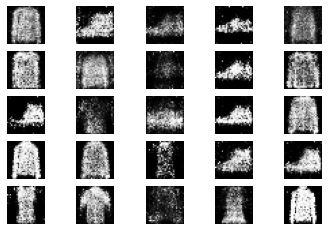

6001 [Discriminator loss: 0.640754, acc.: 64.06%] [Generator loss: 1.754197]
6002 [Discriminator loss: 0.446428, acc.: 78.12%] [Generator loss: 1.742365]
6003 [Discriminator loss: 0.544111, acc.: 70.31%] [Generator loss: 1.862445]
6004 [Discriminator loss: 0.398298, acc.: 82.81%] [Generator loss: 1.814782]
6005 [Discriminator loss: 0.478193, acc.: 76.56%] [Generator loss: 1.634255]
6006 [Discriminator loss: 0.482481, acc.: 76.56%] [Generator loss: 1.786424]
6007 [Discriminator loss: 0.457422, acc.: 75.00%] [Generator loss: 1.979769]
6008 [Discriminator loss: 0.512208, acc.: 78.12%] [Generator loss: 1.821896]
6009 [Discriminator loss: 0.430278, acc.: 79.69%] [Generator loss: 2.047331]
6010 [Discriminator loss: 0.515535, acc.: 70.31%] [Generator loss: 1.437429]
6011 [Discriminator loss: 0.465161, acc.: 76.56%] [Generator loss: 1.544769]
6012 [Discriminator loss: 0.344109, acc.: 92.19%] [Generator loss: 1.563067]
6013 [Discriminator loss: 0.433791, acc.: 75.00%] [Generator loss: 1.883389]

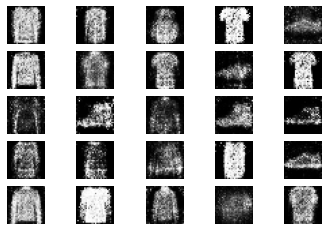

6201 [Discriminator loss: 0.729182, acc.: 64.06%] [Generator loss: 1.808212]
6202 [Discriminator loss: 0.510361, acc.: 71.88%] [Generator loss: 1.557504]
6203 [Discriminator loss: 0.477685, acc.: 71.88%] [Generator loss: 1.463338]
6204 [Discriminator loss: 0.612272, acc.: 67.19%] [Generator loss: 1.749234]
6205 [Discriminator loss: 0.449505, acc.: 76.56%] [Generator loss: 1.497797]
6206 [Discriminator loss: 0.552992, acc.: 73.44%] [Generator loss: 1.672155]
6207 [Discriminator loss: 0.537200, acc.: 73.44%] [Generator loss: 1.879318]
6208 [Discriminator loss: 0.493220, acc.: 76.56%] [Generator loss: 1.761416]
6209 [Discriminator loss: 0.506494, acc.: 73.44%] [Generator loss: 2.081212]
6210 [Discriminator loss: 0.511390, acc.: 73.44%] [Generator loss: 1.659878]
6211 [Discriminator loss: 0.593483, acc.: 71.88%] [Generator loss: 1.586562]
6212 [Discriminator loss: 0.470447, acc.: 81.25%] [Generator loss: 1.603467]
6213 [Discriminator loss: 0.563445, acc.: 68.75%] [Generator loss: 1.696177]

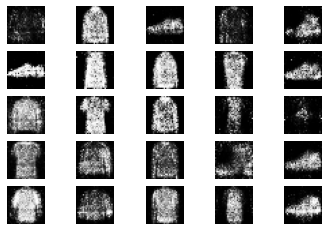

6401 [Discriminator loss: 0.426907, acc.: 82.81%] [Generator loss: 1.656408]
6402 [Discriminator loss: 0.456080, acc.: 78.12%] [Generator loss: 1.631854]
6403 [Discriminator loss: 0.395118, acc.: 81.25%] [Generator loss: 1.388211]
6404 [Discriminator loss: 0.587440, acc.: 73.44%] [Generator loss: 1.579894]
6405 [Discriminator loss: 0.406674, acc.: 85.94%] [Generator loss: 1.920824]
6406 [Discriminator loss: 0.461214, acc.: 82.81%] [Generator loss: 1.560705]
6407 [Discriminator loss: 0.432726, acc.: 81.25%] [Generator loss: 1.439569]
6408 [Discriminator loss: 0.544690, acc.: 65.62%] [Generator loss: 1.548525]
6409 [Discriminator loss: 0.527955, acc.: 81.25%] [Generator loss: 1.576899]
6410 [Discriminator loss: 0.481530, acc.: 79.69%] [Generator loss: 1.570729]
6411 [Discriminator loss: 0.465294, acc.: 79.69%] [Generator loss: 1.591853]
6412 [Discriminator loss: 0.449513, acc.: 79.69%] [Generator loss: 1.824623]
6413 [Discriminator loss: 0.404018, acc.: 79.69%] [Generator loss: 1.624962]

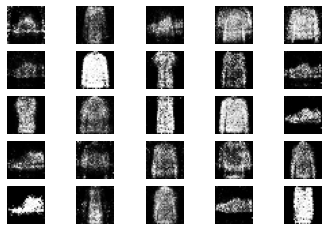

6601 [Discriminator loss: 0.660796, acc.: 60.94%] [Generator loss: 1.794468]
6602 [Discriminator loss: 0.447945, acc.: 76.56%] [Generator loss: 1.492181]
6603 [Discriminator loss: 0.440623, acc.: 79.69%] [Generator loss: 1.477744]
6604 [Discriminator loss: 0.554935, acc.: 73.44%] [Generator loss: 1.796552]
6605 [Discriminator loss: 0.556599, acc.: 68.75%] [Generator loss: 1.851729]
6606 [Discriminator loss: 0.563064, acc.: 67.19%] [Generator loss: 1.546728]
6607 [Discriminator loss: 0.455240, acc.: 78.12%] [Generator loss: 1.464974]
6608 [Discriminator loss: 0.449377, acc.: 79.69%] [Generator loss: 1.276056]
6609 [Discriminator loss: 0.449384, acc.: 79.69%] [Generator loss: 1.573050]
6610 [Discriminator loss: 0.436062, acc.: 84.38%] [Generator loss: 1.357273]
6611 [Discriminator loss: 0.438892, acc.: 81.25%] [Generator loss: 1.705459]
6612 [Discriminator loss: 0.345677, acc.: 89.06%] [Generator loss: 1.665159]
6613 [Discriminator loss: 0.336249, acc.: 85.94%] [Generator loss: 1.867530]

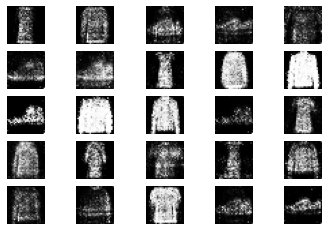

6801 [Discriminator loss: 0.383587, acc.: 85.94%] [Generator loss: 1.677937]
6802 [Discriminator loss: 0.466840, acc.: 81.25%] [Generator loss: 1.521248]
6803 [Discriminator loss: 0.504442, acc.: 73.44%] [Generator loss: 1.440928]
6804 [Discriminator loss: 0.337629, acc.: 85.94%] [Generator loss: 1.713607]
6805 [Discriminator loss: 0.513157, acc.: 70.31%] [Generator loss: 1.581007]
6806 [Discriminator loss: 0.378316, acc.: 84.38%] [Generator loss: 1.674242]
6807 [Discriminator loss: 0.414058, acc.: 81.25%] [Generator loss: 1.750434]
6808 [Discriminator loss: 0.465473, acc.: 76.56%] [Generator loss: 1.566994]
6809 [Discriminator loss: 0.383869, acc.: 82.81%] [Generator loss: 1.547280]
6810 [Discriminator loss: 0.430985, acc.: 84.38%] [Generator loss: 1.720859]
6811 [Discriminator loss: 0.524826, acc.: 71.88%] [Generator loss: 1.671528]
6812 [Discriminator loss: 0.399224, acc.: 87.50%] [Generator loss: 1.547076]
6813 [Discriminator loss: 0.375342, acc.: 93.75%] [Generator loss: 1.678129]

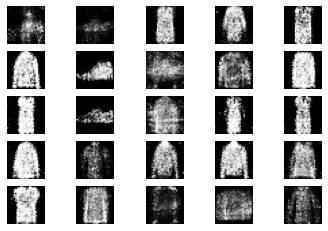

7001 [Discriminator loss: 0.504628, acc.: 71.88%] [Generator loss: 1.533392]
7002 [Discriminator loss: 0.525291, acc.: 73.44%] [Generator loss: 1.910157]
7003 [Discriminator loss: 0.591056, acc.: 70.31%] [Generator loss: 1.723211]
7004 [Discriminator loss: 0.513154, acc.: 76.56%] [Generator loss: 1.469347]
7005 [Discriminator loss: 0.558668, acc.: 68.75%] [Generator loss: 1.695062]
7006 [Discriminator loss: 0.493499, acc.: 78.12%] [Generator loss: 1.642681]
7007 [Discriminator loss: 0.423317, acc.: 78.12%] [Generator loss: 1.541324]
7008 [Discriminator loss: 0.431857, acc.: 82.81%] [Generator loss: 1.482679]
7009 [Discriminator loss: 0.471795, acc.: 82.81%] [Generator loss: 1.516022]
7010 [Discriminator loss: 0.443116, acc.: 81.25%] [Generator loss: 1.478315]
7011 [Discriminator loss: 0.401113, acc.: 81.25%] [Generator loss: 1.722514]
7012 [Discriminator loss: 0.456904, acc.: 81.25%] [Generator loss: 1.633488]
7013 [Discriminator loss: 0.543226, acc.: 68.75%] [Generator loss: 1.546940]

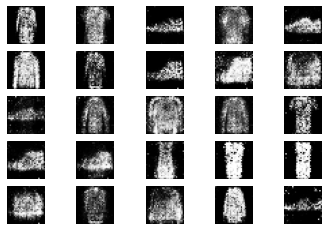

7201 [Discriminator loss: 0.399675, acc.: 84.38%] [Generator loss: 1.686971]
7202 [Discriminator loss: 0.472361, acc.: 76.56%] [Generator loss: 1.605982]
7203 [Discriminator loss: 0.548101, acc.: 73.44%] [Generator loss: 1.508550]
7204 [Discriminator loss: 0.670547, acc.: 57.81%] [Generator loss: 1.667187]
7205 [Discriminator loss: 0.454589, acc.: 82.81%] [Generator loss: 1.645629]
7206 [Discriminator loss: 0.401084, acc.: 85.94%] [Generator loss: 1.444930]
7207 [Discriminator loss: 0.524761, acc.: 73.44%] [Generator loss: 1.608496]
7208 [Discriminator loss: 0.445602, acc.: 85.94%] [Generator loss: 1.993098]
7209 [Discriminator loss: 0.514481, acc.: 71.88%] [Generator loss: 1.712675]
7210 [Discriminator loss: 0.483026, acc.: 78.12%] [Generator loss: 1.640139]
7211 [Discriminator loss: 0.389177, acc.: 81.25%] [Generator loss: 1.589123]
7212 [Discriminator loss: 0.460308, acc.: 78.12%] [Generator loss: 1.666261]
7213 [Discriminator loss: 0.420521, acc.: 81.25%] [Generator loss: 1.655268]

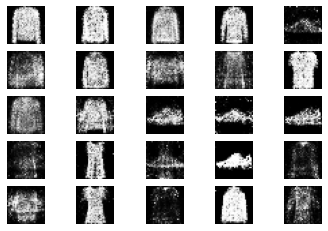

7401 [Discriminator loss: 0.533843, acc.: 75.00%] [Generator loss: 1.471895]
7402 [Discriminator loss: 0.434303, acc.: 81.25%] [Generator loss: 1.522143]
7403 [Discriminator loss: 0.500454, acc.: 78.12%] [Generator loss: 1.527231]
7404 [Discriminator loss: 0.531463, acc.: 68.75%] [Generator loss: 1.540399]
7405 [Discriminator loss: 0.454295, acc.: 73.44%] [Generator loss: 1.631044]
7406 [Discriminator loss: 0.511372, acc.: 70.31%] [Generator loss: 1.588306]
7407 [Discriminator loss: 0.488012, acc.: 79.69%] [Generator loss: 1.520523]
7408 [Discriminator loss: 0.526381, acc.: 73.44%] [Generator loss: 1.521210]
7409 [Discriminator loss: 0.299129, acc.: 89.06%] [Generator loss: 1.644032]
7410 [Discriminator loss: 0.377849, acc.: 81.25%] [Generator loss: 1.620390]
7411 [Discriminator loss: 0.460557, acc.: 78.12%] [Generator loss: 1.625625]
7412 [Discriminator loss: 0.500168, acc.: 79.69%] [Generator loss: 1.487227]
7413 [Discriminator loss: 0.379527, acc.: 87.50%] [Generator loss: 1.869123]

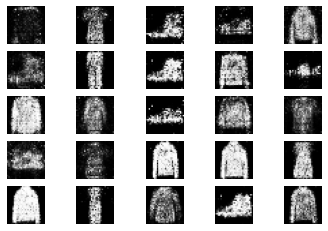

7601 [Discriminator loss: 0.515581, acc.: 73.44%] [Generator loss: 1.725866]
7602 [Discriminator loss: 0.462209, acc.: 81.25%] [Generator loss: 1.833193]
7603 [Discriminator loss: 0.463949, acc.: 78.12%] [Generator loss: 1.474412]
7604 [Discriminator loss: 0.367251, acc.: 87.50%] [Generator loss: 1.835594]
7605 [Discriminator loss: 0.495435, acc.: 75.00%] [Generator loss: 1.557390]
7606 [Discriminator loss: 0.563498, acc.: 64.06%] [Generator loss: 1.485829]
7607 [Discriminator loss: 0.529853, acc.: 68.75%] [Generator loss: 1.492932]
7608 [Discriminator loss: 0.383915, acc.: 87.50%] [Generator loss: 1.681273]
7609 [Discriminator loss: 0.580842, acc.: 64.06%] [Generator loss: 1.482547]
7610 [Discriminator loss: 0.534763, acc.: 75.00%] [Generator loss: 1.413850]
7611 [Discriminator loss: 0.397757, acc.: 90.62%] [Generator loss: 1.525344]
7612 [Discriminator loss: 0.508040, acc.: 78.12%] [Generator loss: 1.663543]
7613 [Discriminator loss: 0.550101, acc.: 73.44%] [Generator loss: 1.528711]

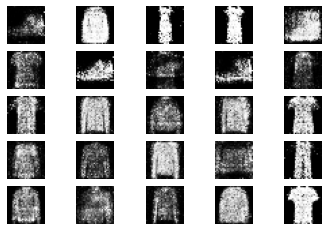

7801 [Discriminator loss: 0.442759, acc.: 75.00%] [Generator loss: 1.611114]
7802 [Discriminator loss: 0.601837, acc.: 71.88%] [Generator loss: 1.475751]
7803 [Discriminator loss: 0.520209, acc.: 70.31%] [Generator loss: 1.404540]
7804 [Discriminator loss: 0.526807, acc.: 71.88%] [Generator loss: 1.576192]
7805 [Discriminator loss: 0.476888, acc.: 79.69%] [Generator loss: 1.435997]
7806 [Discriminator loss: 0.377275, acc.: 92.19%] [Generator loss: 1.749794]
7807 [Discriminator loss: 0.638956, acc.: 62.50%] [Generator loss: 1.907389]
7808 [Discriminator loss: 0.533249, acc.: 68.75%] [Generator loss: 1.557039]
7809 [Discriminator loss: 0.508414, acc.: 68.75%] [Generator loss: 1.671016]
7810 [Discriminator loss: 0.519309, acc.: 75.00%] [Generator loss: 1.565972]
7811 [Discriminator loss: 0.586293, acc.: 67.19%] [Generator loss: 1.741064]
7812 [Discriminator loss: 0.477806, acc.: 73.44%] [Generator loss: 1.494616]
7813 [Discriminator loss: 0.447844, acc.: 76.56%] [Generator loss: 1.923654]

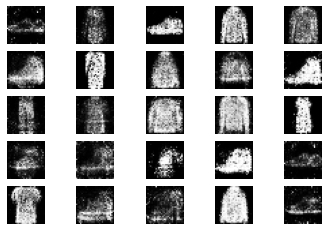

8001 [Discriminator loss: 0.663405, acc.: 67.19%] [Generator loss: 1.622236]
8002 [Discriminator loss: 0.427247, acc.: 76.56%] [Generator loss: 1.668869]
8003 [Discriminator loss: 0.556589, acc.: 73.44%] [Generator loss: 1.492901]
8004 [Discriminator loss: 0.357625, acc.: 82.81%] [Generator loss: 1.744921]
8005 [Discriminator loss: 0.433571, acc.: 81.25%] [Generator loss: 1.671395]
8006 [Discriminator loss: 0.421578, acc.: 82.81%] [Generator loss: 1.681889]
8007 [Discriminator loss: 0.303017, acc.: 92.19%] [Generator loss: 1.690746]
8008 [Discriminator loss: 0.486549, acc.: 73.44%] [Generator loss: 1.505258]
8009 [Discriminator loss: 0.470529, acc.: 76.56%] [Generator loss: 1.512399]
8010 [Discriminator loss: 0.471804, acc.: 76.56%] [Generator loss: 1.690051]
8011 [Discriminator loss: 0.431098, acc.: 75.00%] [Generator loss: 1.880815]
8012 [Discriminator loss: 0.447712, acc.: 70.31%] [Generator loss: 1.574257]
8013 [Discriminator loss: 0.498543, acc.: 70.31%] [Generator loss: 1.334519]

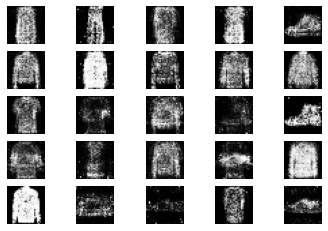

8201 [Discriminator loss: 0.529794, acc.: 70.31%] [Generator loss: 1.695678]
8202 [Discriminator loss: 0.683246, acc.: 65.62%] [Generator loss: 1.574801]
8203 [Discriminator loss: 0.472041, acc.: 73.44%] [Generator loss: 1.596609]
8204 [Discriminator loss: 0.609625, acc.: 71.88%] [Generator loss: 1.384668]
8205 [Discriminator loss: 0.452946, acc.: 78.12%] [Generator loss: 1.663064]
8206 [Discriminator loss: 0.419407, acc.: 84.38%] [Generator loss: 1.821650]
8207 [Discriminator loss: 0.518250, acc.: 71.88%] [Generator loss: 1.408825]
8208 [Discriminator loss: 0.478534, acc.: 75.00%] [Generator loss: 1.475439]
8209 [Discriminator loss: 0.416189, acc.: 85.94%] [Generator loss: 1.766930]
8210 [Discriminator loss: 0.382094, acc.: 79.69%] [Generator loss: 1.740109]
8211 [Discriminator loss: 0.354195, acc.: 84.38%] [Generator loss: 1.891290]
8212 [Discriminator loss: 0.412931, acc.: 78.12%] [Generator loss: 1.841054]
8213 [Discriminator loss: 0.491724, acc.: 73.44%] [Generator loss: 1.941040]

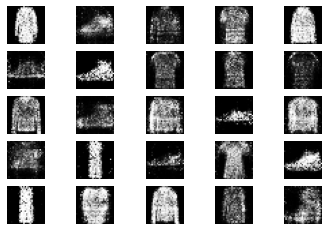

8401 [Discriminator loss: 0.396310, acc.: 84.38%] [Generator loss: 1.582706]
8402 [Discriminator loss: 0.516218, acc.: 71.88%] [Generator loss: 1.484287]
8403 [Discriminator loss: 0.565205, acc.: 70.31%] [Generator loss: 1.499752]
8404 [Discriminator loss: 0.454945, acc.: 81.25%] [Generator loss: 1.658234]
8405 [Discriminator loss: 0.391528, acc.: 81.25%] [Generator loss: 1.468218]
8406 [Discriminator loss: 0.448023, acc.: 78.12%] [Generator loss: 1.587286]
8407 [Discriminator loss: 0.545966, acc.: 79.69%] [Generator loss: 1.850121]
8408 [Discriminator loss: 0.486077, acc.: 76.56%] [Generator loss: 1.574227]
8409 [Discriminator loss: 0.429765, acc.: 76.56%] [Generator loss: 1.777949]
8410 [Discriminator loss: 0.560703, acc.: 71.88%] [Generator loss: 1.428712]
8411 [Discriminator loss: 0.523852, acc.: 68.75%] [Generator loss: 1.748417]
8412 [Discriminator loss: 0.514980, acc.: 76.56%] [Generator loss: 1.982638]
8413 [Discriminator loss: 0.656714, acc.: 64.06%] [Generator loss: 1.506282]

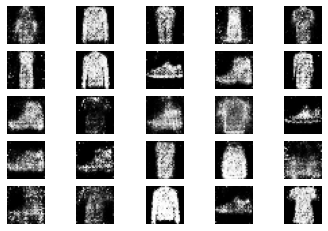

8601 [Discriminator loss: 0.558415, acc.: 73.44%] [Generator loss: 1.490090]
8602 [Discriminator loss: 0.437262, acc.: 85.94%] [Generator loss: 1.602206]
8603 [Discriminator loss: 0.528128, acc.: 70.31%] [Generator loss: 1.636029]
8604 [Discriminator loss: 0.518618, acc.: 79.69%] [Generator loss: 1.436241]
8605 [Discriminator loss: 0.359399, acc.: 87.50%] [Generator loss: 1.489009]
8606 [Discriminator loss: 0.516506, acc.: 76.56%] [Generator loss: 1.491479]
8607 [Discriminator loss: 0.452870, acc.: 78.12%] [Generator loss: 1.682233]
8608 [Discriminator loss: 0.447746, acc.: 79.69%] [Generator loss: 1.660123]
8609 [Discriminator loss: 0.578387, acc.: 67.19%] [Generator loss: 1.546299]
8610 [Discriminator loss: 0.544229, acc.: 71.88%] [Generator loss: 1.488039]
8611 [Discriminator loss: 0.515732, acc.: 75.00%] [Generator loss: 1.592625]
8612 [Discriminator loss: 0.417267, acc.: 78.12%] [Generator loss: 1.512064]
8613 [Discriminator loss: 0.520775, acc.: 76.56%] [Generator loss: 1.737432]

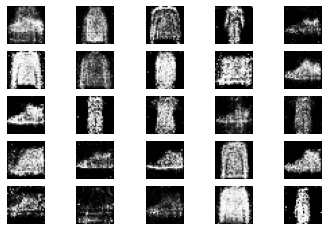

8801 [Discriminator loss: 0.478514, acc.: 76.56%] [Generator loss: 1.586392]
8802 [Discriminator loss: 0.511632, acc.: 73.44%] [Generator loss: 1.771872]
8803 [Discriminator loss: 0.472125, acc.: 78.12%] [Generator loss: 1.493921]
8804 [Discriminator loss: 0.422976, acc.: 76.56%] [Generator loss: 1.377034]
8805 [Discriminator loss: 0.501866, acc.: 68.75%] [Generator loss: 1.456272]
8806 [Discriminator loss: 0.491946, acc.: 75.00%] [Generator loss: 1.395675]
8807 [Discriminator loss: 0.428881, acc.: 75.00%] [Generator loss: 1.628994]
8808 [Discriminator loss: 0.475653, acc.: 79.69%] [Generator loss: 1.431827]
8809 [Discriminator loss: 0.459088, acc.: 76.56%] [Generator loss: 1.521287]
8810 [Discriminator loss: 0.552634, acc.: 70.31%] [Generator loss: 1.417114]
8811 [Discriminator loss: 0.537224, acc.: 68.75%] [Generator loss: 1.695906]
8812 [Discriminator loss: 0.452867, acc.: 73.44%] [Generator loss: 1.572272]
8813 [Discriminator loss: 0.365480, acc.: 87.50%] [Generator loss: 2.068950]

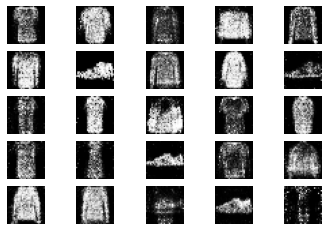

9001 [Discriminator loss: 0.510765, acc.: 70.31%] [Generator loss: 1.566028]
9002 [Discriminator loss: 0.668364, acc.: 67.19%] [Generator loss: 1.332850]
9003 [Discriminator loss: 0.627923, acc.: 71.88%] [Generator loss: 1.609436]
9004 [Discriminator loss: 0.417152, acc.: 79.69%] [Generator loss: 1.736929]
9005 [Discriminator loss: 0.450722, acc.: 73.44%] [Generator loss: 1.658178]
9006 [Discriminator loss: 0.465666, acc.: 81.25%] [Generator loss: 1.657045]
9007 [Discriminator loss: 0.634157, acc.: 67.19%] [Generator loss: 1.225515]
9008 [Discriminator loss: 0.402301, acc.: 84.38%] [Generator loss: 1.483028]
9009 [Discriminator loss: 0.540288, acc.: 73.44%] [Generator loss: 1.566379]
9010 [Discriminator loss: 0.543325, acc.: 67.19%] [Generator loss: 1.616841]
9011 [Discriminator loss: 0.437851, acc.: 81.25%] [Generator loss: 1.613696]
9012 [Discriminator loss: 0.440007, acc.: 78.12%] [Generator loss: 1.432186]
9013 [Discriminator loss: 0.412069, acc.: 81.25%] [Generator loss: 1.538456]

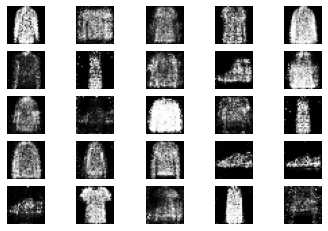

9201 [Discriminator loss: 0.488942, acc.: 73.44%] [Generator loss: 1.742783]
9202 [Discriminator loss: 0.437044, acc.: 79.69%] [Generator loss: 1.608880]
9203 [Discriminator loss: 0.380740, acc.: 93.75%] [Generator loss: 1.544489]
9204 [Discriminator loss: 0.455078, acc.: 76.56%] [Generator loss: 1.509078]
9205 [Discriminator loss: 0.457414, acc.: 79.69%] [Generator loss: 1.616983]
9206 [Discriminator loss: 0.359678, acc.: 85.94%] [Generator loss: 1.618365]
9207 [Discriminator loss: 0.442041, acc.: 81.25%] [Generator loss: 1.409339]
9208 [Discriminator loss: 0.534639, acc.: 71.88%] [Generator loss: 1.455700]
9209 [Discriminator loss: 0.420829, acc.: 82.81%] [Generator loss: 1.322685]
9210 [Discriminator loss: 0.467938, acc.: 75.00%] [Generator loss: 1.794349]
9211 [Discriminator loss: 0.560287, acc.: 70.31%] [Generator loss: 1.302840]
9212 [Discriminator loss: 0.468862, acc.: 75.00%] [Generator loss: 1.511460]
9213 [Discriminator loss: 0.465468, acc.: 78.12%] [Generator loss: 1.694910]

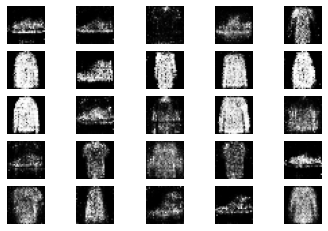

9401 [Discriminator loss: 0.578890, acc.: 68.75%] [Generator loss: 1.628403]
9402 [Discriminator loss: 0.412661, acc.: 82.81%] [Generator loss: 1.776818]
9403 [Discriminator loss: 0.459431, acc.: 81.25%] [Generator loss: 1.786077]
9404 [Discriminator loss: 0.508624, acc.: 75.00%] [Generator loss: 1.383055]
9405 [Discriminator loss: 0.549542, acc.: 70.31%] [Generator loss: 1.673675]
9406 [Discriminator loss: 0.423976, acc.: 76.56%] [Generator loss: 1.738005]
9407 [Discriminator loss: 0.492225, acc.: 73.44%] [Generator loss: 1.574102]
9408 [Discriminator loss: 0.413715, acc.: 79.69%] [Generator loss: 1.478757]
9409 [Discriminator loss: 0.477029, acc.: 78.12%] [Generator loss: 1.632786]
9410 [Discriminator loss: 0.385063, acc.: 89.06%] [Generator loss: 1.402077]
9411 [Discriminator loss: 0.491997, acc.: 79.69%] [Generator loss: 1.574011]
9412 [Discriminator loss: 0.465150, acc.: 75.00%] [Generator loss: 1.459615]
9413 [Discriminator loss: 0.528717, acc.: 71.88%] [Generator loss: 1.681945]

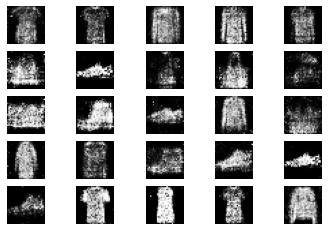

9601 [Discriminator loss: 0.463462, acc.: 81.25%] [Generator loss: 1.652409]
9602 [Discriminator loss: 0.370911, acc.: 85.94%] [Generator loss: 1.671359]
9603 [Discriminator loss: 0.498677, acc.: 70.31%] [Generator loss: 1.579631]
9604 [Discriminator loss: 0.594551, acc.: 65.62%] [Generator loss: 1.284718]
9605 [Discriminator loss: 0.500107, acc.: 78.12%] [Generator loss: 1.665123]
9606 [Discriminator loss: 0.571254, acc.: 73.44%] [Generator loss: 1.569574]
9607 [Discriminator loss: 0.607016, acc.: 68.75%] [Generator loss: 1.506344]
9608 [Discriminator loss: 0.515100, acc.: 78.12%] [Generator loss: 1.460211]
9609 [Discriminator loss: 0.552319, acc.: 73.44%] [Generator loss: 1.370795]
9610 [Discriminator loss: 0.588220, acc.: 70.31%] [Generator loss: 1.615143]
9611 [Discriminator loss: 0.515331, acc.: 81.25%] [Generator loss: 1.719150]
9612 [Discriminator loss: 0.561522, acc.: 71.88%] [Generator loss: 1.928971]
9613 [Discriminator loss: 0.492817, acc.: 73.44%] [Generator loss: 1.617111]

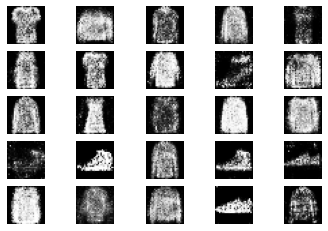

9801 [Discriminator loss: 0.533706, acc.: 78.12%] [Generator loss: 1.667630]
9802 [Discriminator loss: 0.432266, acc.: 79.69%] [Generator loss: 1.741522]
9803 [Discriminator loss: 0.423584, acc.: 79.69%] [Generator loss: 1.714396]
9804 [Discriminator loss: 0.468314, acc.: 82.81%] [Generator loss: 1.639666]
9805 [Discriminator loss: 0.478325, acc.: 78.12%] [Generator loss: 1.573563]
9806 [Discriminator loss: 0.520482, acc.: 75.00%] [Generator loss: 1.569167]
9807 [Discriminator loss: 0.419552, acc.: 81.25%] [Generator loss: 1.619463]
9808 [Discriminator loss: 0.426611, acc.: 81.25%] [Generator loss: 1.552507]
9809 [Discriminator loss: 0.454504, acc.: 82.81%] [Generator loss: 1.617644]
9810 [Discriminator loss: 0.550903, acc.: 64.06%] [Generator loss: 1.684012]
9811 [Discriminator loss: 0.404255, acc.: 81.25%] [Generator loss: 2.118988]
9812 [Discriminator loss: 0.490183, acc.: 76.56%] [Generator loss: 2.064507]
9813 [Discriminator loss: 0.437151, acc.: 81.25%] [Generator loss: 1.854095]

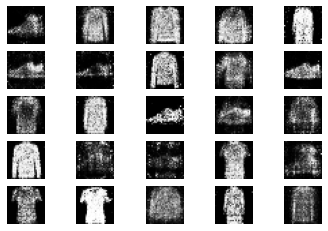

10001 [Discriminator loss: 0.444030, acc.: 78.12%] [Generator loss: 1.965046]
10002 [Discriminator loss: 0.473397, acc.: 78.12%] [Generator loss: 1.563599]
10003 [Discriminator loss: 0.467604, acc.: 76.56%] [Generator loss: 1.496640]
10004 [Discriminator loss: 0.484347, acc.: 78.12%] [Generator loss: 1.554517]
10005 [Discriminator loss: 0.437016, acc.: 82.81%] [Generator loss: 1.712124]
10006 [Discriminator loss: 0.424418, acc.: 82.81%] [Generator loss: 1.745654]
10007 [Discriminator loss: 0.612199, acc.: 73.44%] [Generator loss: 1.748353]
10008 [Discriminator loss: 0.435819, acc.: 79.69%] [Generator loss: 1.786125]
10009 [Discriminator loss: 0.602246, acc.: 71.88%] [Generator loss: 1.416161]
10010 [Discriminator loss: 0.573944, acc.: 68.75%] [Generator loss: 1.626220]
10011 [Discriminator loss: 0.428257, acc.: 79.69%] [Generator loss: 1.572782]
10012 [Discriminator loss: 0.427371, acc.: 81.25%] [Generator loss: 1.490046]
10013 [Discriminator loss: 0.482845, acc.: 79.69%] [Generator lo

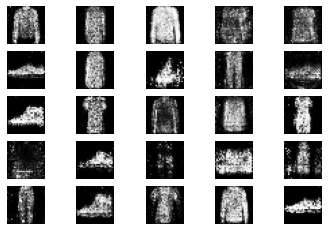

10201 [Discriminator loss: 0.539991, acc.: 65.62%] [Generator loss: 1.420105]
10202 [Discriminator loss: 0.452295, acc.: 82.81%] [Generator loss: 1.829186]
10203 [Discriminator loss: 0.445628, acc.: 81.25%] [Generator loss: 1.747947]
10204 [Discriminator loss: 0.562988, acc.: 67.19%] [Generator loss: 1.997833]
10205 [Discriminator loss: 0.469478, acc.: 81.25%] [Generator loss: 2.104969]
10206 [Discriminator loss: 0.472122, acc.: 76.56%] [Generator loss: 1.727293]
10207 [Discriminator loss: 0.456720, acc.: 81.25%] [Generator loss: 1.710087]
10208 [Discriminator loss: 0.476555, acc.: 81.25%] [Generator loss: 1.641169]
10209 [Discriminator loss: 0.433894, acc.: 82.81%] [Generator loss: 1.666255]
10210 [Discriminator loss: 0.521323, acc.: 76.56%] [Generator loss: 1.499318]
10211 [Discriminator loss: 0.465282, acc.: 76.56%] [Generator loss: 1.440389]
10212 [Discriminator loss: 0.634575, acc.: 70.31%] [Generator loss: 1.337239]
10213 [Discriminator loss: 0.562852, acc.: 75.00%] [Generator lo

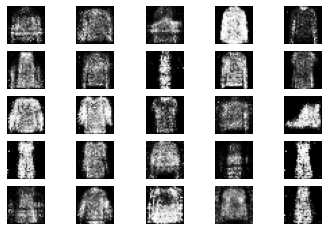

10401 [Discriminator loss: 0.499823, acc.: 71.88%] [Generator loss: 1.606380]
10402 [Discriminator loss: 0.591191, acc.: 68.75%] [Generator loss: 1.438711]
10403 [Discriminator loss: 0.452111, acc.: 76.56%] [Generator loss: 1.591609]
10404 [Discriminator loss: 0.475968, acc.: 73.44%] [Generator loss: 1.672126]
10405 [Discriminator loss: 0.498739, acc.: 76.56%] [Generator loss: 1.767309]
10406 [Discriminator loss: 0.468265, acc.: 76.56%] [Generator loss: 1.442310]
10407 [Discriminator loss: 0.477533, acc.: 81.25%] [Generator loss: 1.470878]
10408 [Discriminator loss: 0.566410, acc.: 73.44%] [Generator loss: 1.254547]
10409 [Discriminator loss: 0.486086, acc.: 76.56%] [Generator loss: 1.478877]
10410 [Discriminator loss: 0.454084, acc.: 73.44%] [Generator loss: 1.336480]
10411 [Discriminator loss: 0.440812, acc.: 79.69%] [Generator loss: 1.709127]
10412 [Discriminator loss: 0.421782, acc.: 84.38%] [Generator loss: 1.459142]
10413 [Discriminator loss: 0.423132, acc.: 75.00%] [Generator lo

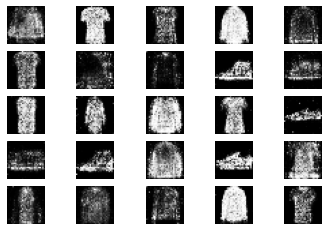

10601 [Discriminator loss: 0.569461, acc.: 73.44%] [Generator loss: 1.578748]
10602 [Discriminator loss: 0.533207, acc.: 71.88%] [Generator loss: 1.613929]
10603 [Discriminator loss: 0.484262, acc.: 73.44%] [Generator loss: 1.844763]
10604 [Discriminator loss: 0.507659, acc.: 71.88%] [Generator loss: 1.640676]
10605 [Discriminator loss: 0.563981, acc.: 75.00%] [Generator loss: 1.366866]
10606 [Discriminator loss: 0.419211, acc.: 82.81%] [Generator loss: 1.682161]
10607 [Discriminator loss: 0.511981, acc.: 75.00%] [Generator loss: 1.657834]
10608 [Discriminator loss: 0.374063, acc.: 81.25%] [Generator loss: 1.650637]
10609 [Discriminator loss: 0.411443, acc.: 84.38%] [Generator loss: 1.417490]
10610 [Discriminator loss: 0.425233, acc.: 85.94%] [Generator loss: 1.509294]
10611 [Discriminator loss: 0.526321, acc.: 75.00%] [Generator loss: 1.614550]
10612 [Discriminator loss: 0.500541, acc.: 75.00%] [Generator loss: 1.775238]
10613 [Discriminator loss: 0.485862, acc.: 76.56%] [Generator lo

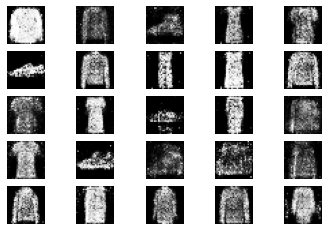

10801 [Discriminator loss: 0.410195, acc.: 76.56%] [Generator loss: 1.612731]
10802 [Discriminator loss: 0.443686, acc.: 76.56%] [Generator loss: 1.566341]
10803 [Discriminator loss: 0.474151, acc.: 75.00%] [Generator loss: 1.688385]
10804 [Discriminator loss: 0.478251, acc.: 76.56%] [Generator loss: 1.413540]
10805 [Discriminator loss: 0.453297, acc.: 81.25%] [Generator loss: 1.629042]
10806 [Discriminator loss: 0.441107, acc.: 78.12%] [Generator loss: 1.689234]
10807 [Discriminator loss: 0.522646, acc.: 75.00%] [Generator loss: 1.451570]
10808 [Discriminator loss: 0.460099, acc.: 79.69%] [Generator loss: 1.575265]
10809 [Discriminator loss: 0.398750, acc.: 79.69%] [Generator loss: 1.471695]
10810 [Discriminator loss: 0.605440, acc.: 70.31%] [Generator loss: 1.605307]
10811 [Discriminator loss: 0.561375, acc.: 73.44%] [Generator loss: 1.535241]
10812 [Discriminator loss: 0.399416, acc.: 82.81%] [Generator loss: 1.611605]
10813 [Discriminator loss: 0.501005, acc.: 75.00%] [Generator lo

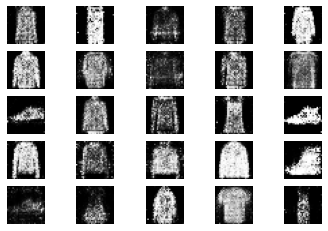

11001 [Discriminator loss: 0.382028, acc.: 87.50%] [Generator loss: 1.790606]
11002 [Discriminator loss: 0.376299, acc.: 79.69%] [Generator loss: 1.818265]
11003 [Discriminator loss: 0.487420, acc.: 78.12%] [Generator loss: 1.386734]
11004 [Discriminator loss: 0.562628, acc.: 75.00%] [Generator loss: 1.433463]
11005 [Discriminator loss: 0.415246, acc.: 78.12%] [Generator loss: 1.573303]
11006 [Discriminator loss: 0.546418, acc.: 73.44%] [Generator loss: 1.506614]
11007 [Discriminator loss: 0.486047, acc.: 76.56%] [Generator loss: 1.608913]
11008 [Discriminator loss: 0.458619, acc.: 71.88%] [Generator loss: 1.836101]
11009 [Discriminator loss: 0.474181, acc.: 79.69%] [Generator loss: 1.815637]
11010 [Discriminator loss: 0.515309, acc.: 75.00%] [Generator loss: 1.806899]
11011 [Discriminator loss: 0.496192, acc.: 73.44%] [Generator loss: 1.550588]
11012 [Discriminator loss: 0.551023, acc.: 71.88%] [Generator loss: 1.751520]
11013 [Discriminator loss: 0.546410, acc.: 75.00%] [Generator lo

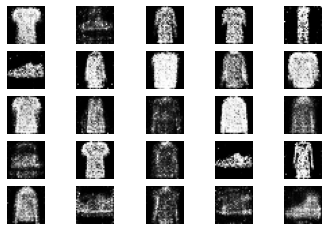

11201 [Discriminator loss: 0.465174, acc.: 75.00%] [Generator loss: 1.858203]
11202 [Discriminator loss: 0.494446, acc.: 75.00%] [Generator loss: 1.688128]
11203 [Discriminator loss: 0.593997, acc.: 75.00%] [Generator loss: 1.632811]
11204 [Discriminator loss: 0.609288, acc.: 70.31%] [Generator loss: 1.487738]
11205 [Discriminator loss: 0.416478, acc.: 78.12%] [Generator loss: 1.475238]
11206 [Discriminator loss: 0.599379, acc.: 67.19%] [Generator loss: 1.505626]
11207 [Discriminator loss: 0.497962, acc.: 73.44%] [Generator loss: 1.402347]
11208 [Discriminator loss: 0.454229, acc.: 79.69%] [Generator loss: 1.458871]
11209 [Discriminator loss: 0.449368, acc.: 79.69%] [Generator loss: 1.859129]
11210 [Discriminator loss: 0.468962, acc.: 78.12%] [Generator loss: 1.609497]
11211 [Discriminator loss: 0.650897, acc.: 68.75%] [Generator loss: 1.450149]
11212 [Discriminator loss: 0.381304, acc.: 87.50%] [Generator loss: 1.629912]
11213 [Discriminator loss: 0.372975, acc.: 84.38%] [Generator lo

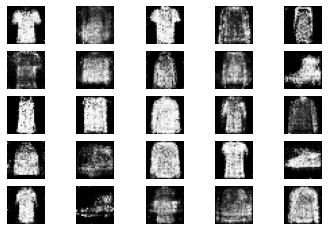

11401 [Discriminator loss: 0.348035, acc.: 90.62%] [Generator loss: 1.751600]
11402 [Discriminator loss: 0.478792, acc.: 71.88%] [Generator loss: 1.693816]
11403 [Discriminator loss: 0.515956, acc.: 75.00%] [Generator loss: 1.355890]
11404 [Discriminator loss: 0.545776, acc.: 75.00%] [Generator loss: 1.605365]
11405 [Discriminator loss: 0.485876, acc.: 70.31%] [Generator loss: 1.493798]
11406 [Discriminator loss: 0.574268, acc.: 65.62%] [Generator loss: 2.163364]
11407 [Discriminator loss: 0.607154, acc.: 64.06%] [Generator loss: 1.855649]
11408 [Discriminator loss: 0.581490, acc.: 70.31%] [Generator loss: 1.655647]
11409 [Discriminator loss: 0.428118, acc.: 79.69%] [Generator loss: 1.614235]
11410 [Discriminator loss: 0.426951, acc.: 76.56%] [Generator loss: 1.835352]
11411 [Discriminator loss: 0.539662, acc.: 73.44%] [Generator loss: 1.716878]
11412 [Discriminator loss: 0.465706, acc.: 76.56%] [Generator loss: 1.583995]
11413 [Discriminator loss: 0.564011, acc.: 65.62%] [Generator lo

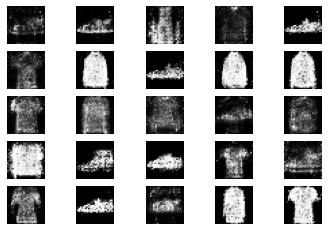

11601 [Discriminator loss: 0.467763, acc.: 75.00%] [Generator loss: 1.631499]
11602 [Discriminator loss: 0.474592, acc.: 75.00%] [Generator loss: 1.746748]
11603 [Discriminator loss: 0.467307, acc.: 76.56%] [Generator loss: 1.488644]
11604 [Discriminator loss: 0.464778, acc.: 82.81%] [Generator loss: 1.982567]
11605 [Discriminator loss: 0.549800, acc.: 65.62%] [Generator loss: 1.776696]
11606 [Discriminator loss: 0.539916, acc.: 75.00%] [Generator loss: 1.832955]
11607 [Discriminator loss: 0.514785, acc.: 70.31%] [Generator loss: 1.572791]
11608 [Discriminator loss: 0.589989, acc.: 64.06%] [Generator loss: 1.373266]
11609 [Discriminator loss: 0.581036, acc.: 68.75%] [Generator loss: 1.716404]
11610 [Discriminator loss: 0.514512, acc.: 73.44%] [Generator loss: 1.663618]
11611 [Discriminator loss: 0.415495, acc.: 85.94%] [Generator loss: 1.477406]
11612 [Discriminator loss: 0.534128, acc.: 71.88%] [Generator loss: 1.341682]
11613 [Discriminator loss: 0.479894, acc.: 76.56%] [Generator lo

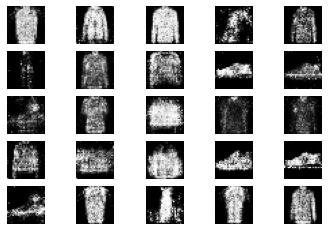

11801 [Discriminator loss: 0.490580, acc.: 78.12%] [Generator loss: 1.523689]
11802 [Discriminator loss: 0.450776, acc.: 78.12%] [Generator loss: 1.536298]
11803 [Discriminator loss: 0.410125, acc.: 84.38%] [Generator loss: 1.548905]
11804 [Discriminator loss: 0.517153, acc.: 70.31%] [Generator loss: 1.534022]
11805 [Discriminator loss: 0.450836, acc.: 76.56%] [Generator loss: 1.590186]
11806 [Discriminator loss: 0.541390, acc.: 75.00%] [Generator loss: 1.721939]
11807 [Discriminator loss: 0.459170, acc.: 79.69%] [Generator loss: 1.712119]
11808 [Discriminator loss: 0.553742, acc.: 73.44%] [Generator loss: 1.639146]
11809 [Discriminator loss: 0.414304, acc.: 84.38%] [Generator loss: 1.476296]
11810 [Discriminator loss: 0.424284, acc.: 82.81%] [Generator loss: 1.724980]
11811 [Discriminator loss: 0.531594, acc.: 73.44%] [Generator loss: 1.357454]
11812 [Discriminator loss: 0.458370, acc.: 76.56%] [Generator loss: 1.308283]
11813 [Discriminator loss: 0.499153, acc.: 73.44%] [Generator lo

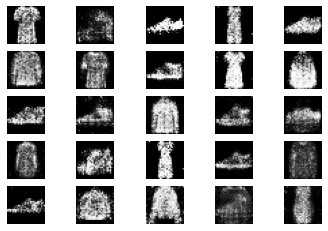

12001 [Discriminator loss: 0.413005, acc.: 85.94%] [Generator loss: 1.653206]
12002 [Discriminator loss: 0.464427, acc.: 81.25%] [Generator loss: 1.642762]
12003 [Discriminator loss: 0.440876, acc.: 78.12%] [Generator loss: 1.942575]
12004 [Discriminator loss: 0.584745, acc.: 70.31%] [Generator loss: 1.792036]
12005 [Discriminator loss: 0.488599, acc.: 71.88%] [Generator loss: 1.443861]
12006 [Discriminator loss: 0.404069, acc.: 84.38%] [Generator loss: 1.745203]
12007 [Discriminator loss: 0.347220, acc.: 84.38%] [Generator loss: 1.870465]
12008 [Discriminator loss: 0.394318, acc.: 87.50%] [Generator loss: 1.579731]
12009 [Discriminator loss: 0.468242, acc.: 78.12%] [Generator loss: 1.789366]
12010 [Discriminator loss: 0.518934, acc.: 75.00%] [Generator loss: 1.607029]
12011 [Discriminator loss: 0.467927, acc.: 79.69%] [Generator loss: 1.672375]
12012 [Discriminator loss: 0.508118, acc.: 71.88%] [Generator loss: 1.502466]
12013 [Discriminator loss: 0.398971, acc.: 81.25%] [Generator lo

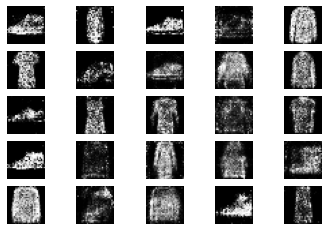

12201 [Discriminator loss: 0.460779, acc.: 81.25%] [Generator loss: 1.522844]
12202 [Discriminator loss: 0.507447, acc.: 75.00%] [Generator loss: 1.448027]
12203 [Discriminator loss: 0.427115, acc.: 81.25%] [Generator loss: 2.107848]
12204 [Discriminator loss: 0.530425, acc.: 76.56%] [Generator loss: 1.435639]
12205 [Discriminator loss: 0.346749, acc.: 84.38%] [Generator loss: 1.629598]
12206 [Discriminator loss: 0.427415, acc.: 79.69%] [Generator loss: 1.383106]
12207 [Discriminator loss: 0.538510, acc.: 78.12%] [Generator loss: 1.554748]
12208 [Discriminator loss: 0.501003, acc.: 71.88%] [Generator loss: 1.661143]
12209 [Discriminator loss: 0.359294, acc.: 85.94%] [Generator loss: 1.855364]
12210 [Discriminator loss: 0.358005, acc.: 90.62%] [Generator loss: 1.649798]
12211 [Discriminator loss: 0.520743, acc.: 75.00%] [Generator loss: 1.564543]
12212 [Discriminator loss: 0.546226, acc.: 70.31%] [Generator loss: 1.446671]
12213 [Discriminator loss: 0.432627, acc.: 79.69%] [Generator lo

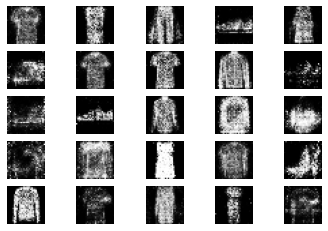

12401 [Discriminator loss: 0.437980, acc.: 82.81%] [Generator loss: 1.777411]
12402 [Discriminator loss: 0.424039, acc.: 84.38%] [Generator loss: 1.503620]
12403 [Discriminator loss: 0.452170, acc.: 82.81%] [Generator loss: 1.756818]
12404 [Discriminator loss: 0.352249, acc.: 87.50%] [Generator loss: 1.776953]
12405 [Discriminator loss: 0.419782, acc.: 81.25%] [Generator loss: 1.960906]
12406 [Discriminator loss: 0.382860, acc.: 79.69%] [Generator loss: 1.448779]
12407 [Discriminator loss: 0.401316, acc.: 79.69%] [Generator loss: 1.591416]
12408 [Discriminator loss: 0.484902, acc.: 71.88%] [Generator loss: 1.660372]
12409 [Discriminator loss: 0.526775, acc.: 76.56%] [Generator loss: 1.619714]
12410 [Discriminator loss: 0.509082, acc.: 67.19%] [Generator loss: 1.516231]
12411 [Discriminator loss: 0.473337, acc.: 78.12%] [Generator loss: 1.645910]
12412 [Discriminator loss: 0.600585, acc.: 68.75%] [Generator loss: 1.649434]
12413 [Discriminator loss: 0.410384, acc.: 84.38%] [Generator lo

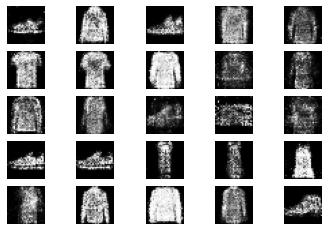

12601 [Discriminator loss: 0.472379, acc.: 79.69%] [Generator loss: 1.688538]
12602 [Discriminator loss: 0.339846, acc.: 89.06%] [Generator loss: 1.502818]
12603 [Discriminator loss: 0.463057, acc.: 76.56%] [Generator loss: 1.454571]
12604 [Discriminator loss: 0.558397, acc.: 71.88%] [Generator loss: 1.544996]
12605 [Discriminator loss: 0.507296, acc.: 73.44%] [Generator loss: 1.510491]
12606 [Discriminator loss: 0.500425, acc.: 75.00%] [Generator loss: 1.241902]
12607 [Discriminator loss: 0.454000, acc.: 81.25%] [Generator loss: 1.558241]
12608 [Discriminator loss: 0.366717, acc.: 82.81%] [Generator loss: 1.644617]
12609 [Discriminator loss: 0.413937, acc.: 76.56%] [Generator loss: 1.376329]
12610 [Discriminator loss: 0.428396, acc.: 81.25%] [Generator loss: 1.873070]
12611 [Discriminator loss: 0.494192, acc.: 79.69%] [Generator loss: 1.610602]
12612 [Discriminator loss: 0.425925, acc.: 84.38%] [Generator loss: 1.657278]
12613 [Discriminator loss: 0.552737, acc.: 73.44%] [Generator lo

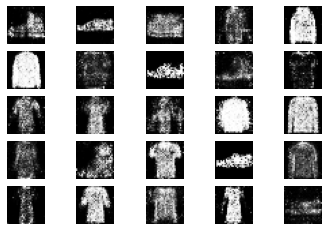

12801 [Discriminator loss: 0.396470, acc.: 78.12%] [Generator loss: 1.750176]
12802 [Discriminator loss: 0.575387, acc.: 76.56%] [Generator loss: 1.855353]
12803 [Discriminator loss: 0.596640, acc.: 67.19%] [Generator loss: 1.441661]
12804 [Discriminator loss: 0.411768, acc.: 81.25%] [Generator loss: 1.493440]
12805 [Discriminator loss: 0.515337, acc.: 79.69%] [Generator loss: 1.383897]
12806 [Discriminator loss: 0.541385, acc.: 67.19%] [Generator loss: 1.439313]
12807 [Discriminator loss: 0.501988, acc.: 79.69%] [Generator loss: 1.558292]
12808 [Discriminator loss: 0.401228, acc.: 82.81%] [Generator loss: 1.438274]
12809 [Discriminator loss: 0.449109, acc.: 82.81%] [Generator loss: 1.711881]
12810 [Discriminator loss: 0.440224, acc.: 78.12%] [Generator loss: 1.919600]
12811 [Discriminator loss: 0.362083, acc.: 90.62%] [Generator loss: 1.823103]
12812 [Discriminator loss: 0.429948, acc.: 89.06%] [Generator loss: 1.757184]
12813 [Discriminator loss: 0.550243, acc.: 71.88%] [Generator lo

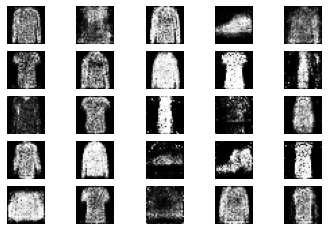

13001 [Discriminator loss: 0.438155, acc.: 79.69%] [Generator loss: 1.633686]
13002 [Discriminator loss: 0.464028, acc.: 75.00%] [Generator loss: 1.281723]
13003 [Discriminator loss: 0.466233, acc.: 84.38%] [Generator loss: 1.867173]
13004 [Discriminator loss: 0.423680, acc.: 79.69%] [Generator loss: 1.919374]
13005 [Discriminator loss: 0.487304, acc.: 76.56%] [Generator loss: 1.650107]
13006 [Discriminator loss: 0.633049, acc.: 64.06%] [Generator loss: 1.478518]
13007 [Discriminator loss: 0.481820, acc.: 70.31%] [Generator loss: 1.652087]
13008 [Discriminator loss: 0.401757, acc.: 85.94%] [Generator loss: 1.271283]
13009 [Discriminator loss: 0.387666, acc.: 81.25%] [Generator loss: 1.667349]
13010 [Discriminator loss: 0.572951, acc.: 73.44%] [Generator loss: 1.577326]
13011 [Discriminator loss: 0.470814, acc.: 78.12%] [Generator loss: 1.593691]
13012 [Discriminator loss: 0.514548, acc.: 73.44%] [Generator loss: 1.626133]
13013 [Discriminator loss: 0.465098, acc.: 75.00%] [Generator lo

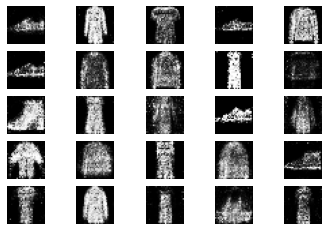

13201 [Discriminator loss: 0.604391, acc.: 68.75%] [Generator loss: 1.479924]
13202 [Discriminator loss: 0.397542, acc.: 81.25%] [Generator loss: 1.343350]
13203 [Discriminator loss: 0.491493, acc.: 79.69%] [Generator loss: 1.695926]
13204 [Discriminator loss: 0.582595, acc.: 75.00%] [Generator loss: 1.550664]
13205 [Discriminator loss: 0.425051, acc.: 82.81%] [Generator loss: 1.626233]
13206 [Discriminator loss: 0.446772, acc.: 81.25%] [Generator loss: 1.884696]
13207 [Discriminator loss: 0.471968, acc.: 76.56%] [Generator loss: 1.636923]
13208 [Discriminator loss: 0.515820, acc.: 75.00%] [Generator loss: 1.722008]
13209 [Discriminator loss: 0.472990, acc.: 75.00%] [Generator loss: 1.602132]
13210 [Discriminator loss: 0.499426, acc.: 79.69%] [Generator loss: 1.695748]
13211 [Discriminator loss: 0.553641, acc.: 73.44%] [Generator loss: 1.978028]
13212 [Discriminator loss: 0.505147, acc.: 76.56%] [Generator loss: 1.695156]
13213 [Discriminator loss: 0.450657, acc.: 82.81%] [Generator lo

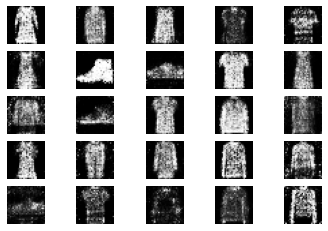

13401 [Discriminator loss: 0.531427, acc.: 73.44%] [Generator loss: 1.756302]
13402 [Discriminator loss: 0.382728, acc.: 85.94%] [Generator loss: 1.925442]
13403 [Discriminator loss: 0.407281, acc.: 82.81%] [Generator loss: 2.025505]
13404 [Discriminator loss: 0.511414, acc.: 84.38%] [Generator loss: 1.720115]
13405 [Discriminator loss: 0.423979, acc.: 81.25%] [Generator loss: 1.681730]
13406 [Discriminator loss: 0.464109, acc.: 78.12%] [Generator loss: 1.744828]
13407 [Discriminator loss: 0.498941, acc.: 67.19%] [Generator loss: 1.798338]
13408 [Discriminator loss: 0.456255, acc.: 82.81%] [Generator loss: 1.502521]
13409 [Discriminator loss: 0.498950, acc.: 81.25%] [Generator loss: 1.562155]
13410 [Discriminator loss: 0.485915, acc.: 75.00%] [Generator loss: 1.468170]
13411 [Discriminator loss: 0.543884, acc.: 70.31%] [Generator loss: 1.692840]
13412 [Discriminator loss: 0.531521, acc.: 78.12%] [Generator loss: 1.684396]
13413 [Discriminator loss: 0.499245, acc.: 78.12%] [Generator lo

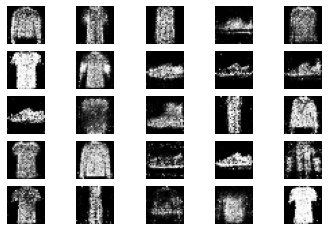

13601 [Discriminator loss: 0.541137, acc.: 67.19%] [Generator loss: 1.422936]
13602 [Discriminator loss: 0.439611, acc.: 73.44%] [Generator loss: 1.568883]
13603 [Discriminator loss: 0.444870, acc.: 78.12%] [Generator loss: 1.598119]
13604 [Discriminator loss: 0.500617, acc.: 75.00%] [Generator loss: 1.636189]
13605 [Discriminator loss: 0.416516, acc.: 78.12%] [Generator loss: 1.329188]
13606 [Discriminator loss: 0.567714, acc.: 64.06%] [Generator loss: 1.633923]
13607 [Discriminator loss: 0.535191, acc.: 71.88%] [Generator loss: 1.569865]
13608 [Discriminator loss: 0.356059, acc.: 87.50%] [Generator loss: 1.589547]
13609 [Discriminator loss: 0.500004, acc.: 78.12%] [Generator loss: 1.796281]
13610 [Discriminator loss: 0.492186, acc.: 78.12%] [Generator loss: 2.222476]
13611 [Discriminator loss: 0.349629, acc.: 85.94%] [Generator loss: 1.901376]
13612 [Discriminator loss: 0.480807, acc.: 75.00%] [Generator loss: 1.659745]
13613 [Discriminator loss: 0.470340, acc.: 79.69%] [Generator lo

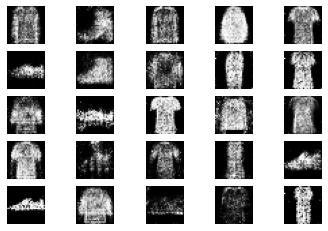

13801 [Discriminator loss: 0.534415, acc.: 71.88%] [Generator loss: 1.409542]
13802 [Discriminator loss: 0.397373, acc.: 82.81%] [Generator loss: 1.584247]
13803 [Discriminator loss: 0.537493, acc.: 65.62%] [Generator loss: 1.472536]
13804 [Discriminator loss: 0.425353, acc.: 82.81%] [Generator loss: 1.605338]
13805 [Discriminator loss: 0.478996, acc.: 76.56%] [Generator loss: 1.739801]
13806 [Discriminator loss: 0.422909, acc.: 76.56%] [Generator loss: 1.854231]
13807 [Discriminator loss: 0.404134, acc.: 79.69%] [Generator loss: 1.552979]
13808 [Discriminator loss: 0.442665, acc.: 79.69%] [Generator loss: 1.525273]
13809 [Discriminator loss: 0.470200, acc.: 71.88%] [Generator loss: 1.456024]
13810 [Discriminator loss: 0.534025, acc.: 75.00%] [Generator loss: 1.546077]
13811 [Discriminator loss: 0.395564, acc.: 84.38%] [Generator loss: 1.822202]
13812 [Discriminator loss: 0.464691, acc.: 76.56%] [Generator loss: 1.509268]
13813 [Discriminator loss: 0.525734, acc.: 70.31%] [Generator lo

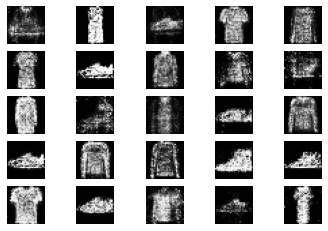

14001 [Discriminator loss: 0.487768, acc.: 85.94%] [Generator loss: 1.395617]
14002 [Discriminator loss: 0.475296, acc.: 71.88%] [Generator loss: 1.828417]
14003 [Discriminator loss: 0.414029, acc.: 84.38%] [Generator loss: 1.776162]
14004 [Discriminator loss: 0.415629, acc.: 79.69%] [Generator loss: 1.789144]
14005 [Discriminator loss: 0.528736, acc.: 73.44%] [Generator loss: 1.660077]
14006 [Discriminator loss: 0.382582, acc.: 79.69%] [Generator loss: 1.939852]
14007 [Discriminator loss: 0.428261, acc.: 71.88%] [Generator loss: 1.674890]
14008 [Discriminator loss: 0.518159, acc.: 73.44%] [Generator loss: 1.777820]
14009 [Discriminator loss: 0.444434, acc.: 81.25%] [Generator loss: 1.836163]
14010 [Discriminator loss: 0.470551, acc.: 75.00%] [Generator loss: 1.770015]
14011 [Discriminator loss: 0.555438, acc.: 70.31%] [Generator loss: 1.768064]
14012 [Discriminator loss: 0.327808, acc.: 89.06%] [Generator loss: 1.608037]
14013 [Discriminator loss: 0.411748, acc.: 82.81%] [Generator lo

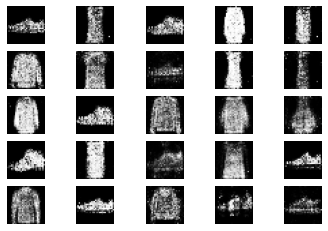

14201 [Discriminator loss: 0.473233, acc.: 78.12%] [Generator loss: 1.765630]
14202 [Discriminator loss: 0.488952, acc.: 71.88%] [Generator loss: 1.958139]
14203 [Discriminator loss: 0.394604, acc.: 81.25%] [Generator loss: 1.658471]
14204 [Discriminator loss: 0.643058, acc.: 71.88%] [Generator loss: 1.963454]
14205 [Discriminator loss: 0.466316, acc.: 73.44%] [Generator loss: 1.549057]
14206 [Discriminator loss: 0.367650, acc.: 89.06%] [Generator loss: 1.448825]
14207 [Discriminator loss: 0.452154, acc.: 76.56%] [Generator loss: 1.599989]
14208 [Discriminator loss: 0.367479, acc.: 81.25%] [Generator loss: 1.604170]
14209 [Discriminator loss: 0.372820, acc.: 89.06%] [Generator loss: 1.636410]
14210 [Discriminator loss: 0.413432, acc.: 84.38%] [Generator loss: 1.771271]
14211 [Discriminator loss: 0.380666, acc.: 84.38%] [Generator loss: 1.736051]
14212 [Discriminator loss: 0.457205, acc.: 81.25%] [Generator loss: 1.583909]
14213 [Discriminator loss: 0.438276, acc.: 79.69%] [Generator lo

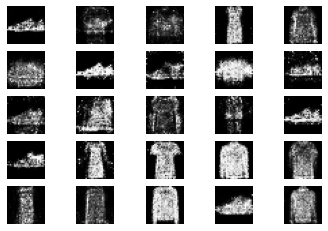

14401 [Discriminator loss: 0.436005, acc.: 73.44%] [Generator loss: 1.703436]
14402 [Discriminator loss: 0.469661, acc.: 76.56%] [Generator loss: 1.563491]
14403 [Discriminator loss: 0.473456, acc.: 79.69%] [Generator loss: 1.602952]
14404 [Discriminator loss: 0.547826, acc.: 68.75%] [Generator loss: 1.569397]
14405 [Discriminator loss: 0.521766, acc.: 73.44%] [Generator loss: 1.385079]
14406 [Discriminator loss: 0.443785, acc.: 75.00%] [Generator loss: 1.532800]
14407 [Discriminator loss: 0.466717, acc.: 70.31%] [Generator loss: 1.523928]
14408 [Discriminator loss: 0.464898, acc.: 76.56%] [Generator loss: 1.770734]
14409 [Discriminator loss: 0.438235, acc.: 79.69%] [Generator loss: 1.677134]
14410 [Discriminator loss: 0.582852, acc.: 70.31%] [Generator loss: 1.768022]
14411 [Discriminator loss: 0.555073, acc.: 71.88%] [Generator loss: 1.630403]
14412 [Discriminator loss: 0.526581, acc.: 76.56%] [Generator loss: 1.514848]
14413 [Discriminator loss: 0.384782, acc.: 82.81%] [Generator lo

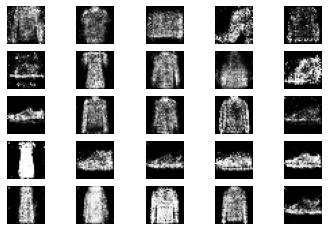

14601 [Discriminator loss: 0.468457, acc.: 79.69%] [Generator loss: 1.482675]
14602 [Discriminator loss: 0.475121, acc.: 71.88%] [Generator loss: 1.649201]
14603 [Discriminator loss: 0.507322, acc.: 75.00%] [Generator loss: 1.818613]
14604 [Discriminator loss: 0.391663, acc.: 82.81%] [Generator loss: 1.770154]
14605 [Discriminator loss: 0.491077, acc.: 73.44%] [Generator loss: 1.910629]
14606 [Discriminator loss: 0.325905, acc.: 92.19%] [Generator loss: 1.708547]
14607 [Discriminator loss: 0.527134, acc.: 75.00%] [Generator loss: 1.494987]
14608 [Discriminator loss: 0.412236, acc.: 81.25%] [Generator loss: 1.625004]
14609 [Discriminator loss: 0.431631, acc.: 79.69%] [Generator loss: 1.844547]
14610 [Discriminator loss: 0.502400, acc.: 73.44%] [Generator loss: 1.718405]
14611 [Discriminator loss: 0.529717, acc.: 73.44%] [Generator loss: 1.727504]
14612 [Discriminator loss: 0.448518, acc.: 75.00%] [Generator loss: 1.460305]
14613 [Discriminator loss: 0.594585, acc.: 67.19%] [Generator lo

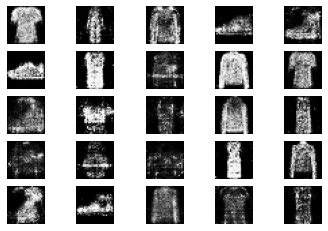

14801 [Discriminator loss: 0.373184, acc.: 81.25%] [Generator loss: 1.532674]
14802 [Discriminator loss: 0.367817, acc.: 82.81%] [Generator loss: 1.723915]
14803 [Discriminator loss: 0.440978, acc.: 79.69%] [Generator loss: 1.674152]
14804 [Discriminator loss: 0.488184, acc.: 76.56%] [Generator loss: 1.713534]
14805 [Discriminator loss: 0.391618, acc.: 84.38%] [Generator loss: 1.659151]
14806 [Discriminator loss: 0.504246, acc.: 75.00%] [Generator loss: 1.666917]
14807 [Discriminator loss: 0.477526, acc.: 78.12%] [Generator loss: 1.751283]
14808 [Discriminator loss: 0.448822, acc.: 81.25%] [Generator loss: 1.934673]
14809 [Discriminator loss: 0.524453, acc.: 76.56%] [Generator loss: 1.671670]
14810 [Discriminator loss: 0.580736, acc.: 68.75%] [Generator loss: 1.692301]
14811 [Discriminator loss: 0.557703, acc.: 76.56%] [Generator loss: 1.524667]
14812 [Discriminator loss: 0.472323, acc.: 76.56%] [Generator loss: 1.491935]
14813 [Discriminator loss: 0.462633, acc.: 73.44%] [Generator lo

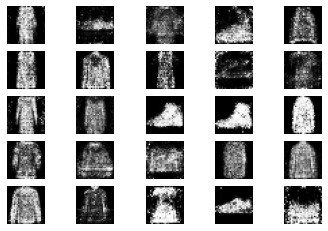

15001 [Discriminator loss: 0.507827, acc.: 84.38%] [Generator loss: 1.629242]
15002 [Discriminator loss: 0.339638, acc.: 85.94%] [Generator loss: 1.883892]
15003 [Discriminator loss: 0.463711, acc.: 81.25%] [Generator loss: 1.900519]
15004 [Discriminator loss: 0.492134, acc.: 78.12%] [Generator loss: 1.750694]
15005 [Discriminator loss: 0.345382, acc.: 87.50%] [Generator loss: 1.958900]
15006 [Discriminator loss: 0.493549, acc.: 65.62%] [Generator loss: 1.470445]
15007 [Discriminator loss: 0.363221, acc.: 89.06%] [Generator loss: 1.851565]
15008 [Discriminator loss: 0.436428, acc.: 81.25%] [Generator loss: 1.628564]
15009 [Discriminator loss: 0.501140, acc.: 75.00%] [Generator loss: 1.633663]
15010 [Discriminator loss: 0.458070, acc.: 78.12%] [Generator loss: 1.415649]
15011 [Discriminator loss: 0.537980, acc.: 71.88%] [Generator loss: 1.587966]
15012 [Discriminator loss: 0.508689, acc.: 75.00%] [Generator loss: 1.638170]
15013 [Discriminator loss: 0.520105, acc.: 73.44%] [Generator lo

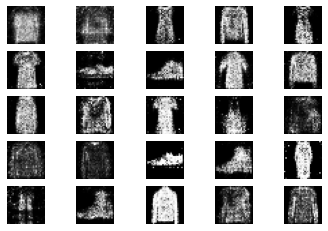

15201 [Discriminator loss: 0.536605, acc.: 68.75%] [Generator loss: 1.535173]
15202 [Discriminator loss: 0.426141, acc.: 84.38%] [Generator loss: 1.526777]
15203 [Discriminator loss: 0.504508, acc.: 75.00%] [Generator loss: 1.814520]
15204 [Discriminator loss: 0.438593, acc.: 79.69%] [Generator loss: 1.877564]
15205 [Discriminator loss: 0.405790, acc.: 82.81%] [Generator loss: 1.449387]
15206 [Discriminator loss: 0.397391, acc.: 85.94%] [Generator loss: 1.226041]
15207 [Discriminator loss: 0.459045, acc.: 76.56%] [Generator loss: 1.401416]
15208 [Discriminator loss: 0.503841, acc.: 78.12%] [Generator loss: 1.448639]
15209 [Discriminator loss: 0.471737, acc.: 71.88%] [Generator loss: 1.638921]
15210 [Discriminator loss: 0.378590, acc.: 79.69%] [Generator loss: 1.582526]
15211 [Discriminator loss: 0.398515, acc.: 81.25%] [Generator loss: 1.886701]
15212 [Discriminator loss: 0.540392, acc.: 68.75%] [Generator loss: 1.651590]
15213 [Discriminator loss: 0.424178, acc.: 81.25%] [Generator lo

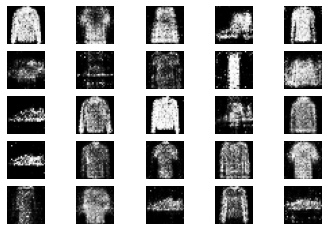

15401 [Discriminator loss: 0.477546, acc.: 79.69%] [Generator loss: 1.860921]
15402 [Discriminator loss: 0.640181, acc.: 67.19%] [Generator loss: 1.715341]
15403 [Discriminator loss: 0.495574, acc.: 73.44%] [Generator loss: 1.451730]
15404 [Discriminator loss: 0.467448, acc.: 76.56%] [Generator loss: 1.772815]
15405 [Discriminator loss: 0.517163, acc.: 71.88%] [Generator loss: 1.632452]
15406 [Discriminator loss: 0.492525, acc.: 76.56%] [Generator loss: 1.690965]
15407 [Discriminator loss: 0.409663, acc.: 78.12%] [Generator loss: 1.379020]
15408 [Discriminator loss: 0.424571, acc.: 79.69%] [Generator loss: 1.432470]
15409 [Discriminator loss: 0.446443, acc.: 75.00%] [Generator loss: 1.480734]
15410 [Discriminator loss: 0.474225, acc.: 73.44%] [Generator loss: 1.587994]
15411 [Discriminator loss: 0.364754, acc.: 87.50%] [Generator loss: 1.937675]
15412 [Discriminator loss: 0.474246, acc.: 78.12%] [Generator loss: 1.641761]
15413 [Discriminator loss: 0.481957, acc.: 70.31%] [Generator lo

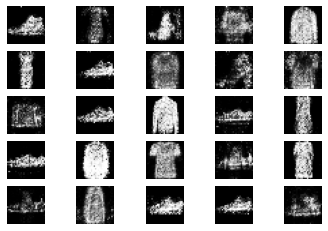

15601 [Discriminator loss: 0.425421, acc.: 82.81%] [Generator loss: 1.579380]
15602 [Discriminator loss: 0.572948, acc.: 68.75%] [Generator loss: 1.630722]
15603 [Discriminator loss: 0.531269, acc.: 75.00%] [Generator loss: 1.596154]
15604 [Discriminator loss: 0.409106, acc.: 79.69%] [Generator loss: 1.925568]
15605 [Discriminator loss: 0.328384, acc.: 90.62%] [Generator loss: 1.857549]
15606 [Discriminator loss: 0.491200, acc.: 81.25%] [Generator loss: 1.738175]
15607 [Discriminator loss: 0.391135, acc.: 76.56%] [Generator loss: 1.700181]
15608 [Discriminator loss: 0.517274, acc.: 70.31%] [Generator loss: 1.591708]
15609 [Discriminator loss: 0.398448, acc.: 76.56%] [Generator loss: 1.620615]
15610 [Discriminator loss: 0.506355, acc.: 75.00%] [Generator loss: 1.425383]
15611 [Discriminator loss: 0.442671, acc.: 79.69%] [Generator loss: 1.716794]
15612 [Discriminator loss: 0.395940, acc.: 84.38%] [Generator loss: 1.715228]
15613 [Discriminator loss: 0.493686, acc.: 73.44%] [Generator lo

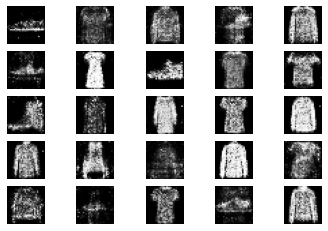

15801 [Discriminator loss: 0.417195, acc.: 81.25%] [Generator loss: 1.466145]
15802 [Discriminator loss: 0.397994, acc.: 81.25%] [Generator loss: 1.708195]
15803 [Discriminator loss: 0.404517, acc.: 82.81%] [Generator loss: 1.373091]
15804 [Discriminator loss: 0.591605, acc.: 65.62%] [Generator loss: 1.585926]
15805 [Discriminator loss: 0.441661, acc.: 84.38%] [Generator loss: 1.790795]
15806 [Discriminator loss: 0.336194, acc.: 87.50%] [Generator loss: 1.764909]
15807 [Discriminator loss: 0.395444, acc.: 79.69%] [Generator loss: 1.542373]
15808 [Discriminator loss: 0.391309, acc.: 79.69%] [Generator loss: 1.558925]
15809 [Discriminator loss: 0.500824, acc.: 75.00%] [Generator loss: 1.769780]
15810 [Discriminator loss: 0.424494, acc.: 81.25%] [Generator loss: 1.887011]
15811 [Discriminator loss: 0.333793, acc.: 85.94%] [Generator loss: 1.854295]
15812 [Discriminator loss: 0.497405, acc.: 75.00%] [Generator loss: 1.828654]
15813 [Discriminator loss: 0.453399, acc.: 75.00%] [Generator lo

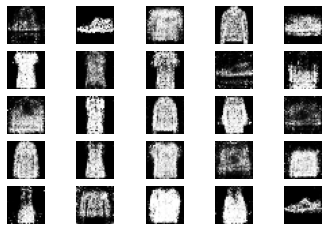

16001 [Discriminator loss: 0.321011, acc.: 89.06%] [Generator loss: 1.396698]
16002 [Discriminator loss: 0.538863, acc.: 67.19%] [Generator loss: 1.352659]
16003 [Discriminator loss: 0.410145, acc.: 82.81%] [Generator loss: 1.544163]
16004 [Discriminator loss: 0.425417, acc.: 84.38%] [Generator loss: 1.462406]
16005 [Discriminator loss: 0.435140, acc.: 81.25%] [Generator loss: 1.635440]
16006 [Discriminator loss: 0.495730, acc.: 76.56%] [Generator loss: 1.527186]
16007 [Discriminator loss: 0.415046, acc.: 81.25%] [Generator loss: 1.639547]
16008 [Discriminator loss: 0.488268, acc.: 73.44%] [Generator loss: 1.669245]
16009 [Discriminator loss: 0.476503, acc.: 75.00%] [Generator loss: 1.598613]
16010 [Discriminator loss: 0.450883, acc.: 82.81%] [Generator loss: 1.709478]
16011 [Discriminator loss: 0.493886, acc.: 76.56%] [Generator loss: 1.534866]
16012 [Discriminator loss: 0.439653, acc.: 79.69%] [Generator loss: 1.719833]
16013 [Discriminator loss: 0.509450, acc.: 71.88%] [Generator lo

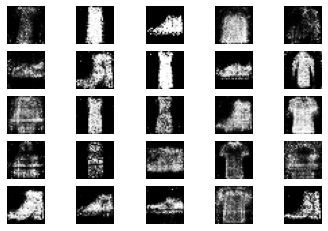

16201 [Discriminator loss: 0.518465, acc.: 75.00%] [Generator loss: 1.938756]
16202 [Discriminator loss: 0.518432, acc.: 75.00%] [Generator loss: 2.000234]
16203 [Discriminator loss: 0.461189, acc.: 76.56%] [Generator loss: 1.636702]
16204 [Discriminator loss: 0.432657, acc.: 76.56%] [Generator loss: 1.596175]
16205 [Discriminator loss: 0.522757, acc.: 68.75%] [Generator loss: 1.540559]
16206 [Discriminator loss: 0.462709, acc.: 76.56%] [Generator loss: 1.742588]
16207 [Discriminator loss: 0.526542, acc.: 68.75%] [Generator loss: 1.703746]
16208 [Discriminator loss: 0.571123, acc.: 73.44%] [Generator loss: 1.668725]
16209 [Discriminator loss: 0.422818, acc.: 82.81%] [Generator loss: 1.626962]
16210 [Discriminator loss: 0.586516, acc.: 65.62%] [Generator loss: 1.280458]
16211 [Discriminator loss: 0.388970, acc.: 78.12%] [Generator loss: 1.886469]
16212 [Discriminator loss: 0.385382, acc.: 85.94%] [Generator loss: 1.856915]
16213 [Discriminator loss: 0.450574, acc.: 78.12%] [Generator lo

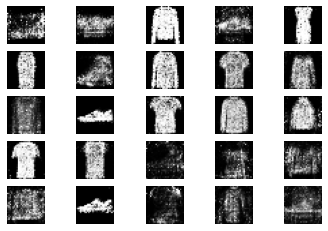

16401 [Discriminator loss: 0.374664, acc.: 81.25%] [Generator loss: 1.910269]
16402 [Discriminator loss: 0.472995, acc.: 75.00%] [Generator loss: 1.811691]
16403 [Discriminator loss: 0.440083, acc.: 84.38%] [Generator loss: 1.680078]
16404 [Discriminator loss: 0.396863, acc.: 82.81%] [Generator loss: 1.869567]
16405 [Discriminator loss: 0.638705, acc.: 60.94%] [Generator loss: 1.839724]
16406 [Discriminator loss: 0.407298, acc.: 84.38%] [Generator loss: 1.582669]
16407 [Discriminator loss: 0.551154, acc.: 73.44%] [Generator loss: 1.336510]
16408 [Discriminator loss: 0.522906, acc.: 71.88%] [Generator loss: 1.328289]
16409 [Discriminator loss: 0.405037, acc.: 79.69%] [Generator loss: 1.517118]
16410 [Discriminator loss: 0.388072, acc.: 79.69%] [Generator loss: 1.618045]
16411 [Discriminator loss: 0.484126, acc.: 75.00%] [Generator loss: 1.988784]
16412 [Discriminator loss: 0.455735, acc.: 76.56%] [Generator loss: 1.733318]
16413 [Discriminator loss: 0.460117, acc.: 75.00%] [Generator lo

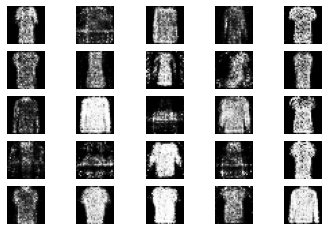

16601 [Discriminator loss: 0.497790, acc.: 78.12%] [Generator loss: 1.926874]
16602 [Discriminator loss: 0.484923, acc.: 78.12%] [Generator loss: 1.634122]
16603 [Discriminator loss: 0.507620, acc.: 76.56%] [Generator loss: 1.912130]
16604 [Discriminator loss: 0.422105, acc.: 79.69%] [Generator loss: 1.611169]
16605 [Discriminator loss: 0.445481, acc.: 78.12%] [Generator loss: 1.750909]
16606 [Discriminator loss: 0.555446, acc.: 71.88%] [Generator loss: 2.027671]
16607 [Discriminator loss: 0.405307, acc.: 85.94%] [Generator loss: 1.684548]
16608 [Discriminator loss: 0.415124, acc.: 76.56%] [Generator loss: 2.067392]
16609 [Discriminator loss: 0.437511, acc.: 78.12%] [Generator loss: 1.891049]
16610 [Discriminator loss: 0.448806, acc.: 79.69%] [Generator loss: 1.852776]
16611 [Discriminator loss: 0.414655, acc.: 79.69%] [Generator loss: 1.520836]
16612 [Discriminator loss: 0.569176, acc.: 70.31%] [Generator loss: 1.654460]
16613 [Discriminator loss: 0.506083, acc.: 76.56%] [Generator lo

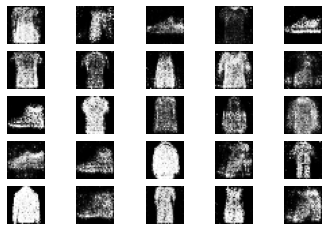

16801 [Discriminator loss: 0.478595, acc.: 73.44%] [Generator loss: 1.808749]
16802 [Discriminator loss: 0.365538, acc.: 85.94%] [Generator loss: 1.750348]
16803 [Discriminator loss: 0.599177, acc.: 71.88%] [Generator loss: 1.767555]
16804 [Discriminator loss: 0.553886, acc.: 71.88%] [Generator loss: 1.597373]
16805 [Discriminator loss: 0.406998, acc.: 84.38%] [Generator loss: 1.455344]
16806 [Discriminator loss: 0.493329, acc.: 78.12%] [Generator loss: 1.710927]
16807 [Discriminator loss: 0.557052, acc.: 64.06%] [Generator loss: 2.045520]
16808 [Discriminator loss: 0.515978, acc.: 71.88%] [Generator loss: 1.780855]
16809 [Discriminator loss: 0.403211, acc.: 81.25%] [Generator loss: 2.029105]
16810 [Discriminator loss: 0.576144, acc.: 71.88%] [Generator loss: 1.420804]
16811 [Discriminator loss: 0.528993, acc.: 75.00%] [Generator loss: 1.597935]
16812 [Discriminator loss: 0.459835, acc.: 76.56%] [Generator loss: 1.634959]
16813 [Discriminator loss: 0.562347, acc.: 68.75%] [Generator lo

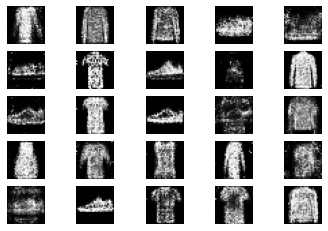

17001 [Discriminator loss: 0.502612, acc.: 76.56%] [Generator loss: 1.782738]
17002 [Discriminator loss: 0.508650, acc.: 75.00%] [Generator loss: 1.562231]
17003 [Discriminator loss: 0.374171, acc.: 89.06%] [Generator loss: 1.931839]
17004 [Discriminator loss: 0.473686, acc.: 79.69%] [Generator loss: 1.627255]
17005 [Discriminator loss: 0.485574, acc.: 76.56%] [Generator loss: 1.732408]
17006 [Discriminator loss: 0.392647, acc.: 82.81%] [Generator loss: 1.712509]
17007 [Discriminator loss: 0.507200, acc.: 75.00%] [Generator loss: 1.885972]
17008 [Discriminator loss: 0.546574, acc.: 71.88%] [Generator loss: 1.658033]
17009 [Discriminator loss: 0.556325, acc.: 76.56%] [Generator loss: 1.691915]
17010 [Discriminator loss: 0.510868, acc.: 71.88%] [Generator loss: 1.693625]
17011 [Discriminator loss: 0.545598, acc.: 67.19%] [Generator loss: 1.672599]
17012 [Discriminator loss: 0.538466, acc.: 73.44%] [Generator loss: 1.634185]
17013 [Discriminator loss: 0.407252, acc.: 78.12%] [Generator lo

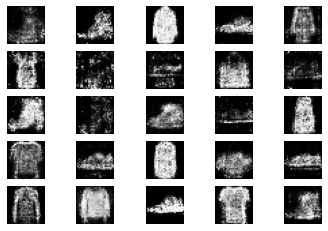

17201 [Discriminator loss: 0.517165, acc.: 71.88%] [Generator loss: 1.680886]
17202 [Discriminator loss: 0.444965, acc.: 76.56%] [Generator loss: 1.724681]
17203 [Discriminator loss: 0.511527, acc.: 75.00%] [Generator loss: 1.882963]
17204 [Discriminator loss: 0.463215, acc.: 75.00%] [Generator loss: 1.939272]
17205 [Discriminator loss: 0.416403, acc.: 75.00%] [Generator loss: 2.140018]
17206 [Discriminator loss: 0.513304, acc.: 79.69%] [Generator loss: 1.637856]
17207 [Discriminator loss: 0.591268, acc.: 65.62%] [Generator loss: 1.494699]
17208 [Discriminator loss: 0.462089, acc.: 76.56%] [Generator loss: 1.607334]
17209 [Discriminator loss: 0.450048, acc.: 78.12%] [Generator loss: 1.747585]
17210 [Discriminator loss: 0.536997, acc.: 71.88%] [Generator loss: 1.324835]
17211 [Discriminator loss: 0.423715, acc.: 79.69%] [Generator loss: 1.376465]
17212 [Discriminator loss: 0.446949, acc.: 79.69%] [Generator loss: 1.570902]
17213 [Discriminator loss: 0.434804, acc.: 79.69%] [Generator lo

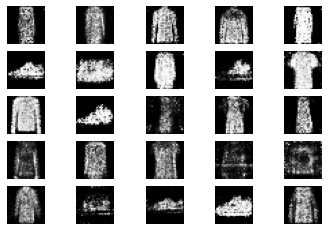

17401 [Discriminator loss: 0.553597, acc.: 73.44%] [Generator loss: 1.601475]
17402 [Discriminator loss: 0.463456, acc.: 76.56%] [Generator loss: 1.552998]
17403 [Discriminator loss: 0.525542, acc.: 76.56%] [Generator loss: 1.597988]
17404 [Discriminator loss: 0.379970, acc.: 85.94%] [Generator loss: 1.727541]
17405 [Discriminator loss: 0.395318, acc.: 82.81%] [Generator loss: 1.783167]
17406 [Discriminator loss: 0.469111, acc.: 75.00%] [Generator loss: 1.710406]
17407 [Discriminator loss: 0.493418, acc.: 70.31%] [Generator loss: 1.540644]
17408 [Discriminator loss: 0.483812, acc.: 78.12%] [Generator loss: 1.839212]
17409 [Discriminator loss: 0.543054, acc.: 73.44%] [Generator loss: 1.563706]
17410 [Discriminator loss: 0.438683, acc.: 78.12%] [Generator loss: 1.733741]
17411 [Discriminator loss: 0.390547, acc.: 81.25%] [Generator loss: 1.545267]
17412 [Discriminator loss: 0.495679, acc.: 75.00%] [Generator loss: 1.682174]
17413 [Discriminator loss: 0.352161, acc.: 84.38%] [Generator lo

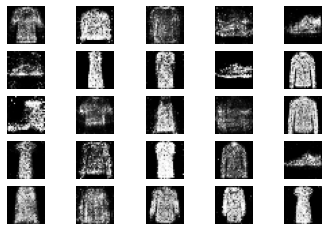

17601 [Discriminator loss: 0.440979, acc.: 78.12%] [Generator loss: 1.557804]
17602 [Discriminator loss: 0.583648, acc.: 64.06%] [Generator loss: 1.285827]
17603 [Discriminator loss: 0.572764, acc.: 78.12%] [Generator loss: 1.380227]
17604 [Discriminator loss: 0.566051, acc.: 73.44%] [Generator loss: 1.857488]
17605 [Discriminator loss: 0.483553, acc.: 78.12%] [Generator loss: 1.486097]
17606 [Discriminator loss: 0.419208, acc.: 79.69%] [Generator loss: 1.398536]
17607 [Discriminator loss: 0.411029, acc.: 85.94%] [Generator loss: 1.497345]
17608 [Discriminator loss: 0.482501, acc.: 76.56%] [Generator loss: 1.672565]
17609 [Discriminator loss: 0.535860, acc.: 73.44%] [Generator loss: 1.643333]
17610 [Discriminator loss: 0.462809, acc.: 78.12%] [Generator loss: 1.708766]
17611 [Discriminator loss: 0.449514, acc.: 79.69%] [Generator loss: 1.543775]
17612 [Discriminator loss: 0.485924, acc.: 68.75%] [Generator loss: 1.532182]
17613 [Discriminator loss: 0.350946, acc.: 89.06%] [Generator lo

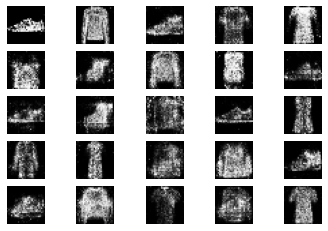

17801 [Discriminator loss: 0.346850, acc.: 87.50%] [Generator loss: 2.106586]
17802 [Discriminator loss: 0.451873, acc.: 76.56%] [Generator loss: 1.656707]
17803 [Discriminator loss: 0.486504, acc.: 76.56%] [Generator loss: 1.630248]
17804 [Discriminator loss: 0.566836, acc.: 70.31%] [Generator loss: 1.757716]
17805 [Discriminator loss: 0.496685, acc.: 73.44%] [Generator loss: 1.552341]
17806 [Discriminator loss: 0.377113, acc.: 82.81%] [Generator loss: 1.592321]
17807 [Discriminator loss: 0.673123, acc.: 67.19%] [Generator loss: 1.314897]
17808 [Discriminator loss: 0.526959, acc.: 73.44%] [Generator loss: 1.314868]
17809 [Discriminator loss: 0.477017, acc.: 78.12%] [Generator loss: 1.355864]
17810 [Discriminator loss: 0.441976, acc.: 81.25%] [Generator loss: 1.787024]
17811 [Discriminator loss: 0.500671, acc.: 70.31%] [Generator loss: 1.586772]
17812 [Discriminator loss: 0.504944, acc.: 76.56%] [Generator loss: 1.458783]
17813 [Discriminator loss: 0.469673, acc.: 75.00%] [Generator lo

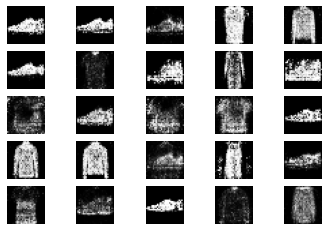

18001 [Discriminator loss: 0.415345, acc.: 76.56%] [Generator loss: 1.677692]
18002 [Discriminator loss: 0.444459, acc.: 76.56%] [Generator loss: 1.600758]
18003 [Discriminator loss: 0.443588, acc.: 79.69%] [Generator loss: 1.743235]
18004 [Discriminator loss: 0.492492, acc.: 75.00%] [Generator loss: 1.486881]
18005 [Discriminator loss: 0.492512, acc.: 76.56%] [Generator loss: 1.669649]
18006 [Discriminator loss: 0.469090, acc.: 78.12%] [Generator loss: 2.053014]
18007 [Discriminator loss: 0.364285, acc.: 78.12%] [Generator loss: 1.620490]
18008 [Discriminator loss: 0.501685, acc.: 70.31%] [Generator loss: 1.846742]
18009 [Discriminator loss: 0.512031, acc.: 73.44%] [Generator loss: 1.580188]
18010 [Discriminator loss: 0.437461, acc.: 79.69%] [Generator loss: 1.575898]
18011 [Discriminator loss: 0.421920, acc.: 79.69%] [Generator loss: 1.528730]
18012 [Discriminator loss: 0.543087, acc.: 71.88%] [Generator loss: 1.439815]
18013 [Discriminator loss: 0.380971, acc.: 82.81%] [Generator lo

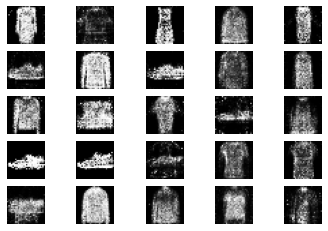

18201 [Discriminator loss: 0.362478, acc.: 87.50%] [Generator loss: 1.419347]
18202 [Discriminator loss: 0.383505, acc.: 82.81%] [Generator loss: 1.624757]
18203 [Discriminator loss: 0.400953, acc.: 76.56%] [Generator loss: 1.734249]
18204 [Discriminator loss: 0.354794, acc.: 85.94%] [Generator loss: 1.701512]
18205 [Discriminator loss: 0.354789, acc.: 87.50%] [Generator loss: 1.743117]
18206 [Discriminator loss: 0.313884, acc.: 89.06%] [Generator loss: 1.723693]
18207 [Discriminator loss: 0.354888, acc.: 82.81%] [Generator loss: 1.544736]
18208 [Discriminator loss: 0.414590, acc.: 82.81%] [Generator loss: 1.675225]
18209 [Discriminator loss: 0.316212, acc.: 84.38%] [Generator loss: 1.671507]
18210 [Discriminator loss: 0.371869, acc.: 84.38%] [Generator loss: 1.730321]
18211 [Discriminator loss: 0.504455, acc.: 79.69%] [Generator loss: 1.508465]
18212 [Discriminator loss: 0.384775, acc.: 82.81%] [Generator loss: 1.389085]
18213 [Discriminator loss: 0.432231, acc.: 81.25%] [Generator lo

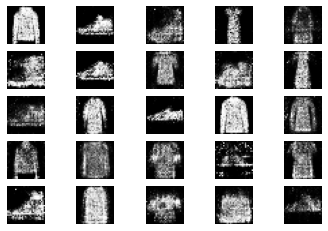

18401 [Discriminator loss: 0.372429, acc.: 82.81%] [Generator loss: 1.546983]
18402 [Discriminator loss: 0.320592, acc.: 85.94%] [Generator loss: 1.693050]
18403 [Discriminator loss: 0.498574, acc.: 73.44%] [Generator loss: 1.613270]
18404 [Discriminator loss: 0.446285, acc.: 82.81%] [Generator loss: 1.535604]
18405 [Discriminator loss: 0.388683, acc.: 79.69%] [Generator loss: 1.499992]
18406 [Discriminator loss: 0.405869, acc.: 78.12%] [Generator loss: 1.585315]
18407 [Discriminator loss: 0.432832, acc.: 75.00%] [Generator loss: 1.444932]
18408 [Discriminator loss: 0.509216, acc.: 68.75%] [Generator loss: 1.597913]
18409 [Discriminator loss: 0.478754, acc.: 75.00%] [Generator loss: 1.397361]
18410 [Discriminator loss: 0.448258, acc.: 79.69%] [Generator loss: 1.324363]
18411 [Discriminator loss: 0.423205, acc.: 82.81%] [Generator loss: 1.259823]
18412 [Discriminator loss: 0.414709, acc.: 78.12%] [Generator loss: 1.614624]
18413 [Discriminator loss: 0.512034, acc.: 71.88%] [Generator lo

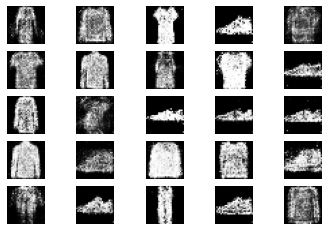

18601 [Discriminator loss: 0.452809, acc.: 79.69%] [Generator loss: 1.439241]
18602 [Discriminator loss: 0.545616, acc.: 68.75%] [Generator loss: 1.349863]
18603 [Discriminator loss: 0.338767, acc.: 85.94%] [Generator loss: 1.398373]
18604 [Discriminator loss: 0.470846, acc.: 76.56%] [Generator loss: 1.637621]
18605 [Discriminator loss: 0.402328, acc.: 79.69%] [Generator loss: 1.520759]
18606 [Discriminator loss: 0.523489, acc.: 73.44%] [Generator loss: 1.604776]
18607 [Discriminator loss: 0.429252, acc.: 76.56%] [Generator loss: 1.337461]
18608 [Discriminator loss: 0.338014, acc.: 82.81%] [Generator loss: 1.488461]
18609 [Discriminator loss: 0.461000, acc.: 76.56%] [Generator loss: 1.337816]
18610 [Discriminator loss: 0.502054, acc.: 79.69%] [Generator loss: 1.342920]
18611 [Discriminator loss: 0.507778, acc.: 76.56%] [Generator loss: 1.287511]
18612 [Discriminator loss: 0.440122, acc.: 75.00%] [Generator loss: 1.312037]
18613 [Discriminator loss: 0.413555, acc.: 81.25%] [Generator lo

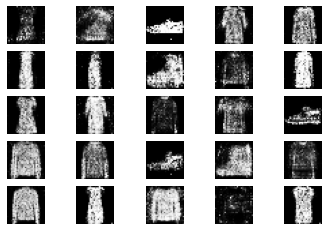

18801 [Discriminator loss: 0.398357, acc.: 87.50%] [Generator loss: 1.338339]
18802 [Discriminator loss: 0.314183, acc.: 89.06%] [Generator loss: 1.373317]
18803 [Discriminator loss: 0.453550, acc.: 78.12%] [Generator loss: 1.254564]
18804 [Discriminator loss: 0.395627, acc.: 82.81%] [Generator loss: 1.801858]
18805 [Discriminator loss: 0.393759, acc.: 76.56%] [Generator loss: 1.382945]
18806 [Discriminator loss: 0.442650, acc.: 75.00%] [Generator loss: 1.586140]
18807 [Discriminator loss: 0.500361, acc.: 75.00%] [Generator loss: 1.784309]
18808 [Discriminator loss: 0.562489, acc.: 68.75%] [Generator loss: 1.033373]
18809 [Discriminator loss: 0.419207, acc.: 79.69%] [Generator loss: 1.529430]
18810 [Discriminator loss: 0.461907, acc.: 84.38%] [Generator loss: 1.171706]
18811 [Discriminator loss: 0.383821, acc.: 79.69%] [Generator loss: 1.405480]
18812 [Discriminator loss: 0.411353, acc.: 81.25%] [Generator loss: 1.585454]
18813 [Discriminator loss: 0.463601, acc.: 78.12%] [Generator lo

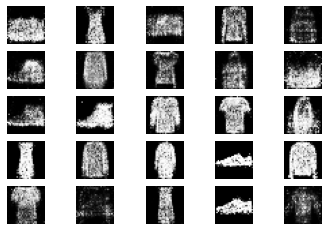

19001 [Discriminator loss: 0.383223, acc.: 79.69%] [Generator loss: 1.530368]
19002 [Discriminator loss: 0.470029, acc.: 76.56%] [Generator loss: 1.722605]
19003 [Discriminator loss: 0.366748, acc.: 85.94%] [Generator loss: 2.068215]
19004 [Discriminator loss: 0.580447, acc.: 68.75%] [Generator loss: 1.563975]
19005 [Discriminator loss: 0.440172, acc.: 81.25%] [Generator loss: 1.474289]
19006 [Discriminator loss: 0.365087, acc.: 82.81%] [Generator loss: 1.495515]
19007 [Discriminator loss: 0.536093, acc.: 73.44%] [Generator loss: 1.520126]
19008 [Discriminator loss: 0.499222, acc.: 73.44%] [Generator loss: 1.380594]
19009 [Discriminator loss: 0.409881, acc.: 79.69%] [Generator loss: 1.577679]
19010 [Discriminator loss: 0.293507, acc.: 93.75%] [Generator loss: 2.213944]
19011 [Discriminator loss: 0.422446, acc.: 81.25%] [Generator loss: 1.448854]
19012 [Discriminator loss: 0.469029, acc.: 79.69%] [Generator loss: 1.630248]
19013 [Discriminator loss: 0.528311, acc.: 68.75%] [Generator lo

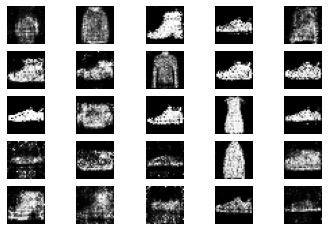

19201 [Discriminator loss: 0.476825, acc.: 73.44%] [Generator loss: 1.650836]
19202 [Discriminator loss: 0.525920, acc.: 70.31%] [Generator loss: 1.692239]
19203 [Discriminator loss: 0.348966, acc.: 84.38%] [Generator loss: 1.485810]
19204 [Discriminator loss: 0.432159, acc.: 78.12%] [Generator loss: 1.538558]
19205 [Discriminator loss: 0.394233, acc.: 81.25%] [Generator loss: 1.557500]
19206 [Discriminator loss: 0.336990, acc.: 85.94%] [Generator loss: 1.210473]
19207 [Discriminator loss: 0.437126, acc.: 81.25%] [Generator loss: 1.140395]
19208 [Discriminator loss: 0.348570, acc.: 84.38%] [Generator loss: 1.406742]
19209 [Discriminator loss: 0.360701, acc.: 82.81%] [Generator loss: 1.412620]
19210 [Discriminator loss: 0.390134, acc.: 81.25%] [Generator loss: 1.267446]
19211 [Discriminator loss: 0.487927, acc.: 76.56%] [Generator loss: 1.362447]
19212 [Discriminator loss: 0.393888, acc.: 84.38%] [Generator loss: 1.597602]
19213 [Discriminator loss: 0.354597, acc.: 76.56%] [Generator lo

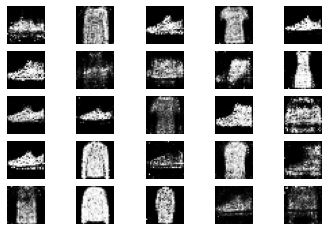

19401 [Discriminator loss: 0.444685, acc.: 78.12%] [Generator loss: 1.670355]
19402 [Discriminator loss: 0.410351, acc.: 76.56%] [Generator loss: 1.513401]
19403 [Discriminator loss: 0.508441, acc.: 75.00%] [Generator loss: 1.260666]
19404 [Discriminator loss: 0.529385, acc.: 70.31%] [Generator loss: 1.122031]
19405 [Discriminator loss: 0.571084, acc.: 71.88%] [Generator loss: 1.199207]
19406 [Discriminator loss: 0.559124, acc.: 70.31%] [Generator loss: 1.403514]
19407 [Discriminator loss: 0.369000, acc.: 81.25%] [Generator loss: 1.556672]
19408 [Discriminator loss: 0.438341, acc.: 79.69%] [Generator loss: 1.375002]
19409 [Discriminator loss: 0.515152, acc.: 70.31%] [Generator loss: 1.378145]
19410 [Discriminator loss: 0.347933, acc.: 85.94%] [Generator loss: 1.216391]
19411 [Discriminator loss: 0.449419, acc.: 75.00%] [Generator loss: 1.422499]
19412 [Discriminator loss: 0.404495, acc.: 75.00%] [Generator loss: 1.299760]
19413 [Discriminator loss: 0.375787, acc.: 84.38%] [Generator lo

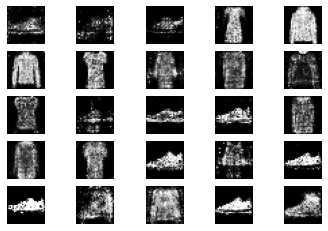

19601 [Discriminator loss: 0.435688, acc.: 78.12%] [Generator loss: 1.617055]
19602 [Discriminator loss: 0.409417, acc.: 76.56%] [Generator loss: 1.316097]
19603 [Discriminator loss: 0.408344, acc.: 76.56%] [Generator loss: 1.222335]
19604 [Discriminator loss: 0.462738, acc.: 76.56%] [Generator loss: 1.236783]
19605 [Discriminator loss: 0.457851, acc.: 75.00%] [Generator loss: 1.290642]
19606 [Discriminator loss: 0.442151, acc.: 81.25%] [Generator loss: 1.458205]
19607 [Discriminator loss: 0.363787, acc.: 84.38%] [Generator loss: 1.260122]
19608 [Discriminator loss: 0.413104, acc.: 84.38%] [Generator loss: 1.818334]
19609 [Discriminator loss: 0.465718, acc.: 81.25%] [Generator loss: 1.441944]
19610 [Discriminator loss: 0.346988, acc.: 82.81%] [Generator loss: 1.261973]
19611 [Discriminator loss: 0.449583, acc.: 79.69%] [Generator loss: 1.447988]
19612 [Discriminator loss: 0.401268, acc.: 82.81%] [Generator loss: 1.696452]
19613 [Discriminator loss: 0.373555, acc.: 85.94%] [Generator lo

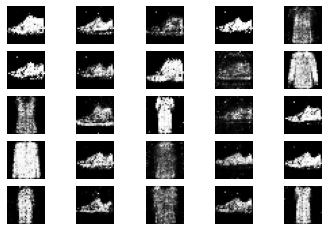

19801 [Discriminator loss: 0.420258, acc.: 81.25%] [Generator loss: 1.010531]
19802 [Discriminator loss: 0.402094, acc.: 84.38%] [Generator loss: 1.394534]
19803 [Discriminator loss: 0.326475, acc.: 87.50%] [Generator loss: 1.392323]
19804 [Discriminator loss: 0.338593, acc.: 81.25%] [Generator loss: 1.218028]
19805 [Discriminator loss: 0.454376, acc.: 73.44%] [Generator loss: 1.441032]
19806 [Discriminator loss: 0.410769, acc.: 76.56%] [Generator loss: 1.376096]
19807 [Discriminator loss: 0.371259, acc.: 78.12%] [Generator loss: 1.378074]
19808 [Discriminator loss: 0.331189, acc.: 87.50%] [Generator loss: 1.344817]
19809 [Discriminator loss: 0.364245, acc.: 85.94%] [Generator loss: 1.101511]
19810 [Discriminator loss: 0.524908, acc.: 76.56%] [Generator loss: 1.570599]
19811 [Discriminator loss: 0.359369, acc.: 82.81%] [Generator loss: 1.419627]
19812 [Discriminator loss: 0.447005, acc.: 79.69%] [Generator loss: 1.624554]
19813 [Discriminator loss: 0.356106, acc.: 87.50%] [Generator lo

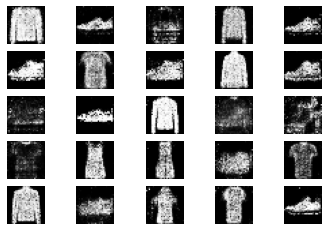

20001 [Discriminator loss: 0.442200, acc.: 73.44%] [Generator loss: 1.057361]
20002 [Discriminator loss: 0.502402, acc.: 78.12%] [Generator loss: 1.057276]
20003 [Discriminator loss: 0.354698, acc.: 84.38%] [Generator loss: 1.149687]
20004 [Discriminator loss: 0.455506, acc.: 79.69%] [Generator loss: 1.231516]
20005 [Discriminator loss: 0.290625, acc.: 85.94%] [Generator loss: 1.603457]
20006 [Discriminator loss: 0.427483, acc.: 78.12%] [Generator loss: 1.485157]
20007 [Discriminator loss: 0.337789, acc.: 82.81%] [Generator loss: 1.766580]
20008 [Discriminator loss: 0.513071, acc.: 75.00%] [Generator loss: 1.112101]
20009 [Discriminator loss: 0.489841, acc.: 79.69%] [Generator loss: 1.284492]
20010 [Discriminator loss: 0.350831, acc.: 85.94%] [Generator loss: 1.393955]
20011 [Discriminator loss: 0.373550, acc.: 84.38%] [Generator loss: 1.597516]
20012 [Discriminator loss: 0.341124, acc.: 82.81%] [Generator loss: 1.682883]
20013 [Discriminator loss: 0.514110, acc.: 71.88%] [Generator lo

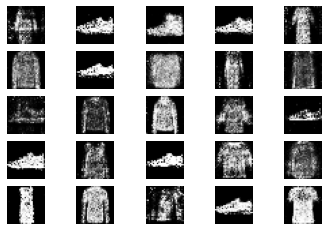

20201 [Discriminator loss: 0.483171, acc.: 75.00%] [Generator loss: 1.469833]
20202 [Discriminator loss: 0.401037, acc.: 81.25%] [Generator loss: 1.377243]
20203 [Discriminator loss: 0.428132, acc.: 81.25%] [Generator loss: 1.335719]
20204 [Discriminator loss: 0.389762, acc.: 81.25%] [Generator loss: 1.238270]
20205 [Discriminator loss: 0.415167, acc.: 78.12%] [Generator loss: 1.052446]
20206 [Discriminator loss: 0.391950, acc.: 81.25%] [Generator loss: 0.970721]
20207 [Discriminator loss: 0.449072, acc.: 71.88%] [Generator loss: 1.258775]
20208 [Discriminator loss: 0.322810, acc.: 81.25%] [Generator loss: 1.453537]
20209 [Discriminator loss: 0.350397, acc.: 85.94%] [Generator loss: 1.379792]
20210 [Discriminator loss: 0.444802, acc.: 78.12%] [Generator loss: 1.509474]
20211 [Discriminator loss: 0.535105, acc.: 68.75%] [Generator loss: 0.899981]
20212 [Discriminator loss: 0.460971, acc.: 78.12%] [Generator loss: 1.062083]
20213 [Discriminator loss: 0.346951, acc.: 81.25%] [Generator lo

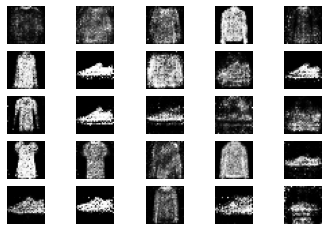

20401 [Discriminator loss: 0.336207, acc.: 84.38%] [Generator loss: 1.795896]
20402 [Discriminator loss: 0.362493, acc.: 85.94%] [Generator loss: 1.883644]
20403 [Discriminator loss: 0.357398, acc.: 89.06%] [Generator loss: 1.780619]
20404 [Discriminator loss: 0.358261, acc.: 84.38%] [Generator loss: 1.444916]
20405 [Discriminator loss: 0.284734, acc.: 87.50%] [Generator loss: 1.743427]
20406 [Discriminator loss: 0.459569, acc.: 75.00%] [Generator loss: 1.932912]
20407 [Discriminator loss: 0.294403, acc.: 87.50%] [Generator loss: 1.846331]
20408 [Discriminator loss: 0.591771, acc.: 71.88%] [Generator loss: 1.375647]
20409 [Discriminator loss: 0.357960, acc.: 85.94%] [Generator loss: 1.498203]
20410 [Discriminator loss: 0.487212, acc.: 76.56%] [Generator loss: 1.062646]
20411 [Discriminator loss: 0.260295, acc.: 90.62%] [Generator loss: 1.043513]
20412 [Discriminator loss: 0.466080, acc.: 73.44%] [Generator loss: 1.058537]
20413 [Discriminator loss: 0.284303, acc.: 87.50%] [Generator lo

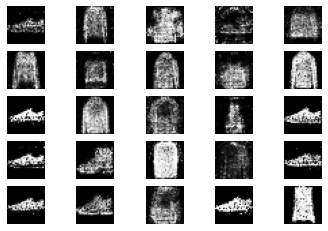

20601 [Discriminator loss: 0.421399, acc.: 79.69%] [Generator loss: 1.703207]
20602 [Discriminator loss: 0.373542, acc.: 78.12%] [Generator loss: 1.423139]
20603 [Discriminator loss: 0.420611, acc.: 84.38%] [Generator loss: 1.563786]
20604 [Discriminator loss: 0.365591, acc.: 81.25%] [Generator loss: 1.105246]
20605 [Discriminator loss: 0.460268, acc.: 73.44%] [Generator loss: 1.132615]
20606 [Discriminator loss: 0.307579, acc.: 90.62%] [Generator loss: 1.406968]
20607 [Discriminator loss: 0.258214, acc.: 93.75%] [Generator loss: 1.445159]
20608 [Discriminator loss: 0.410320, acc.: 82.81%] [Generator loss: 1.274237]
20609 [Discriminator loss: 0.388022, acc.: 85.94%] [Generator loss: 1.132428]
20610 [Discriminator loss: 0.430291, acc.: 84.38%] [Generator loss: 1.251180]
20611 [Discriminator loss: 0.421941, acc.: 82.81%] [Generator loss: 1.607211]
20612 [Discriminator loss: 0.351445, acc.: 84.38%] [Generator loss: 1.813420]
20613 [Discriminator loss: 0.421537, acc.: 76.56%] [Generator lo

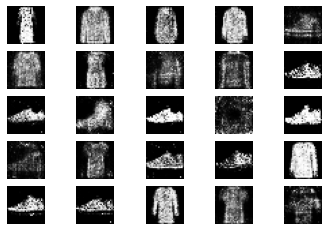

20801 [Discriminator loss: 0.395076, acc.: 81.25%] [Generator loss: 1.110314]
20802 [Discriminator loss: 0.430020, acc.: 84.38%] [Generator loss: 1.150862]
20803 [Discriminator loss: 0.535980, acc.: 71.88%] [Generator loss: 1.149385]
20804 [Discriminator loss: 0.364134, acc.: 84.38%] [Generator loss: 1.246148]
20805 [Discriminator loss: 0.363983, acc.: 89.06%] [Generator loss: 1.307559]
20806 [Discriminator loss: 0.450550, acc.: 81.25%] [Generator loss: 1.339371]
20807 [Discriminator loss: 0.447311, acc.: 79.69%] [Generator loss: 1.153651]
20808 [Discriminator loss: 0.280202, acc.: 92.19%] [Generator loss: 1.710582]
20809 [Discriminator loss: 0.411192, acc.: 78.12%] [Generator loss: 1.513093]
20810 [Discriminator loss: 0.500440, acc.: 75.00%] [Generator loss: 1.453249]
20811 [Discriminator loss: 0.372022, acc.: 84.38%] [Generator loss: 1.453446]
20812 [Discriminator loss: 0.502936, acc.: 73.44%] [Generator loss: 1.829355]
20813 [Discriminator loss: 0.336021, acc.: 89.06%] [Generator lo

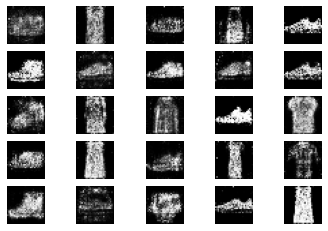

21001 [Discriminator loss: 0.437593, acc.: 79.69%] [Generator loss: 1.703890]
21002 [Discriminator loss: 0.390658, acc.: 82.81%] [Generator loss: 1.266549]
21003 [Discriminator loss: 0.317316, acc.: 85.94%] [Generator loss: 1.178848]
21004 [Discriminator loss: 0.465957, acc.: 82.81%] [Generator loss: 1.185026]
21005 [Discriminator loss: 0.390799, acc.: 84.38%] [Generator loss: 1.257704]
21006 [Discriminator loss: 0.490603, acc.: 78.12%] [Generator loss: 1.243756]
21007 [Discriminator loss: 0.369715, acc.: 82.81%] [Generator loss: 1.441049]
21008 [Discriminator loss: 0.360651, acc.: 82.81%] [Generator loss: 1.426514]
21009 [Discriminator loss: 0.369682, acc.: 90.62%] [Generator loss: 1.375299]
21010 [Discriminator loss: 0.324000, acc.: 82.81%] [Generator loss: 0.992624]
21011 [Discriminator loss: 0.251429, acc.: 89.06%] [Generator loss: 1.391252]
21012 [Discriminator loss: 0.206578, acc.: 98.44%] [Generator loss: 1.046516]
21013 [Discriminator loss: 0.376524, acc.: 81.25%] [Generator lo

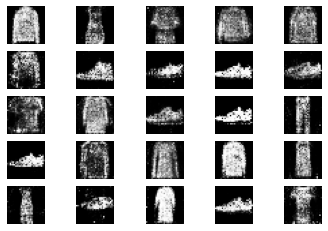

21201 [Discriminator loss: 0.305929, acc.: 89.06%] [Generator loss: 1.278434]
21202 [Discriminator loss: 0.410318, acc.: 78.12%] [Generator loss: 1.877353]
21203 [Discriminator loss: 0.435509, acc.: 76.56%] [Generator loss: 1.534703]
21204 [Discriminator loss: 0.562475, acc.: 71.88%] [Generator loss: 1.823759]
21205 [Discriminator loss: 0.427653, acc.: 79.69%] [Generator loss: 2.040840]
21206 [Discriminator loss: 0.446966, acc.: 76.56%] [Generator loss: 1.511153]
21207 [Discriminator loss: 0.328768, acc.: 90.62%] [Generator loss: 1.470651]
21208 [Discriminator loss: 0.534595, acc.: 75.00%] [Generator loss: 1.444872]
21209 [Discriminator loss: 0.375039, acc.: 85.94%] [Generator loss: 1.505973]
21210 [Discriminator loss: 0.406136, acc.: 81.25%] [Generator loss: 1.482864]
21211 [Discriminator loss: 0.319237, acc.: 85.94%] [Generator loss: 1.494854]
21212 [Discriminator loss: 0.300035, acc.: 82.81%] [Generator loss: 1.676807]
21213 [Discriminator loss: 0.314809, acc.: 85.94%] [Generator lo

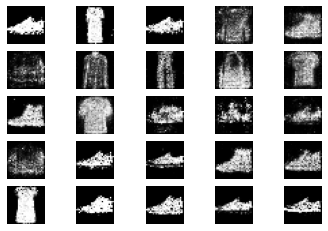

21401 [Discriminator loss: 0.480113, acc.: 75.00%] [Generator loss: 1.234843]
21402 [Discriminator loss: 0.301674, acc.: 84.38%] [Generator loss: 1.105673]
21403 [Discriminator loss: 0.293033, acc.: 87.50%] [Generator loss: 1.497701]
21404 [Discriminator loss: 0.287144, acc.: 87.50%] [Generator loss: 1.194611]
21405 [Discriminator loss: 0.448822, acc.: 81.25%] [Generator loss: 1.433384]
21406 [Discriminator loss: 0.391175, acc.: 81.25%] [Generator loss: 1.308084]
21407 [Discriminator loss: 0.473688, acc.: 73.44%] [Generator loss: 1.380346]
21408 [Discriminator loss: 0.384009, acc.: 79.69%] [Generator loss: 1.674014]
21409 [Discriminator loss: 0.328032, acc.: 85.94%] [Generator loss: 1.798779]
21410 [Discriminator loss: 0.390022, acc.: 79.69%] [Generator loss: 1.149020]
21411 [Discriminator loss: 0.329276, acc.: 82.81%] [Generator loss: 1.385644]
21412 [Discriminator loss: 0.358727, acc.: 79.69%] [Generator loss: 1.598787]
21413 [Discriminator loss: 0.396149, acc.: 82.81%] [Generator lo

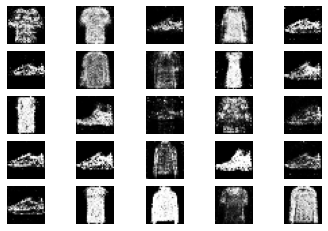

21601 [Discriminator loss: 0.367161, acc.: 81.25%] [Generator loss: 1.206327]
21602 [Discriminator loss: 0.255895, acc.: 92.19%] [Generator loss: 1.096105]
21603 [Discriminator loss: 0.441605, acc.: 76.56%] [Generator loss: 1.245882]
21604 [Discriminator loss: 0.305116, acc.: 85.94%] [Generator loss: 0.841277]
21605 [Discriminator loss: 0.403146, acc.: 79.69%] [Generator loss: 1.142309]
21606 [Discriminator loss: 0.328786, acc.: 84.38%] [Generator loss: 0.885379]
21607 [Discriminator loss: 0.490125, acc.: 76.56%] [Generator loss: 1.069773]
21608 [Discriminator loss: 0.372662, acc.: 84.38%] [Generator loss: 1.338236]
21609 [Discriminator loss: 0.443635, acc.: 84.38%] [Generator loss: 1.280590]
21610 [Discriminator loss: 0.313283, acc.: 87.50%] [Generator loss: 1.381178]
21611 [Discriminator loss: 0.361944, acc.: 79.69%] [Generator loss: 1.134127]
21612 [Discriminator loss: 0.438520, acc.: 84.38%] [Generator loss: 1.042988]
21613 [Discriminator loss: 0.402322, acc.: 84.38%] [Generator lo

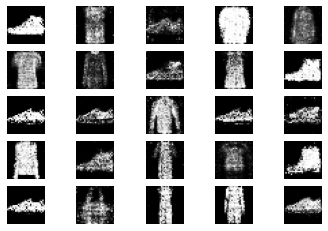

21801 [Discriminator loss: 0.521036, acc.: 75.00%] [Generator loss: 1.047893]
21802 [Discriminator loss: 0.480678, acc.: 73.44%] [Generator loss: 1.151365]
21803 [Discriminator loss: 0.365622, acc.: 82.81%] [Generator loss: 0.912386]
21804 [Discriminator loss: 0.444055, acc.: 78.12%] [Generator loss: 1.057184]
21805 [Discriminator loss: 0.424024, acc.: 73.44%] [Generator loss: 0.840289]
21806 [Discriminator loss: 0.310735, acc.: 87.50%] [Generator loss: 1.011764]
21807 [Discriminator loss: 0.425615, acc.: 76.56%] [Generator loss: 1.064733]
21808 [Discriminator loss: 0.337471, acc.: 81.25%] [Generator loss: 1.124482]
21809 [Discriminator loss: 0.347788, acc.: 85.94%] [Generator loss: 0.644067]
21810 [Discriminator loss: 0.355822, acc.: 75.00%] [Generator loss: 0.985427]
21811 [Discriminator loss: 0.529427, acc.: 79.69%] [Generator loss: 0.847784]
21812 [Discriminator loss: 0.443965, acc.: 78.12%] [Generator loss: 0.750882]
21813 [Discriminator loss: 0.354982, acc.: 81.25%] [Generator lo

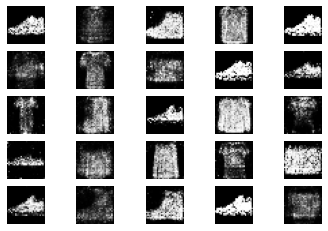

22001 [Discriminator loss: 0.495099, acc.: 75.00%] [Generator loss: 1.411777]
22002 [Discriminator loss: 0.326410, acc.: 82.81%] [Generator loss: 1.678407]
22003 [Discriminator loss: 0.450371, acc.: 81.25%] [Generator loss: 1.159847]
22004 [Discriminator loss: 0.285978, acc.: 90.62%] [Generator loss: 1.537099]
22005 [Discriminator loss: 0.328091, acc.: 87.50%] [Generator loss: 1.442209]
22006 [Discriminator loss: 0.475262, acc.: 75.00%] [Generator loss: 1.867687]
22007 [Discriminator loss: 0.526643, acc.: 76.56%] [Generator loss: 1.455817]
22008 [Discriminator loss: 0.328152, acc.: 87.50%] [Generator loss: 1.574052]
22009 [Discriminator loss: 0.357493, acc.: 89.06%] [Generator loss: 1.633800]
22010 [Discriminator loss: 0.401136, acc.: 78.12%] [Generator loss: 1.721496]
22011 [Discriminator loss: 0.264725, acc.: 87.50%] [Generator loss: 1.240610]
22012 [Discriminator loss: 0.404204, acc.: 79.69%] [Generator loss: 1.399483]
22013 [Discriminator loss: 0.446609, acc.: 75.00%] [Generator lo

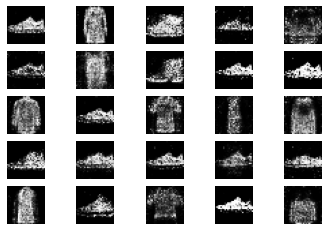

22201 [Discriminator loss: 0.394236, acc.: 71.88%] [Generator loss: 1.507920]
22202 [Discriminator loss: 0.348225, acc.: 79.69%] [Generator loss: 1.764386]
22203 [Discriminator loss: 0.288229, acc.: 90.62%] [Generator loss: 1.517381]
22204 [Discriminator loss: 0.348342, acc.: 76.56%] [Generator loss: 1.463021]
22205 [Discriminator loss: 0.272606, acc.: 89.06%] [Generator loss: 1.223688]
22206 [Discriminator loss: 0.287629, acc.: 84.38%] [Generator loss: 1.281188]
22207 [Discriminator loss: 0.456414, acc.: 82.81%] [Generator loss: 1.038088]
22208 [Discriminator loss: 0.366042, acc.: 85.94%] [Generator loss: 1.387166]
22209 [Discriminator loss: 0.337847, acc.: 84.38%] [Generator loss: 0.874916]
22210 [Discriminator loss: 0.345254, acc.: 85.94%] [Generator loss: 1.217619]
22211 [Discriminator loss: 0.272891, acc.: 90.62%] [Generator loss: 1.062140]
22212 [Discriminator loss: 0.349346, acc.: 87.50%] [Generator loss: 1.171905]
22213 [Discriminator loss: 0.268636, acc.: 90.62%] [Generator lo

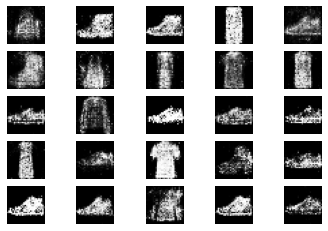

22401 [Discriminator loss: 0.252764, acc.: 85.94%] [Generator loss: 1.844917]
22402 [Discriminator loss: 0.403923, acc.: 81.25%] [Generator loss: 1.312780]
22403 [Discriminator loss: 0.289362, acc.: 92.19%] [Generator loss: 1.386332]
22404 [Discriminator loss: 0.279528, acc.: 85.94%] [Generator loss: 1.381989]
22405 [Discriminator loss: 0.522902, acc.: 71.88%] [Generator loss: 1.812890]
22406 [Discriminator loss: 0.341098, acc.: 87.50%] [Generator loss: 1.525259]
22407 [Discriminator loss: 0.443576, acc.: 73.44%] [Generator loss: 0.993969]
22408 [Discriminator loss: 0.352579, acc.: 85.94%] [Generator loss: 1.313683]
22409 [Discriminator loss: 0.353362, acc.: 85.94%] [Generator loss: 1.630009]
22410 [Discriminator loss: 0.580466, acc.: 65.62%] [Generator loss: 1.507842]
22411 [Discriminator loss: 0.370148, acc.: 81.25%] [Generator loss: 1.269940]
22412 [Discriminator loss: 0.392749, acc.: 82.81%] [Generator loss: 1.524727]
22413 [Discriminator loss: 0.241318, acc.: 90.62%] [Generator lo

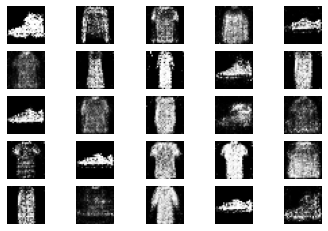

22601 [Discriminator loss: 0.437468, acc.: 85.94%] [Generator loss: 1.346522]
22602 [Discriminator loss: 0.287106, acc.: 92.19%] [Generator loss: 1.101363]
22603 [Discriminator loss: 0.259168, acc.: 89.06%] [Generator loss: 1.262826]
22604 [Discriminator loss: 0.244808, acc.: 92.19%] [Generator loss: 0.964638]
22605 [Discriminator loss: 0.253087, acc.: 89.06%] [Generator loss: 0.891053]
22606 [Discriminator loss: 0.262045, acc.: 90.62%] [Generator loss: 0.926418]
22607 [Discriminator loss: 0.363745, acc.: 87.50%] [Generator loss: 0.999268]
22608 [Discriminator loss: 0.376321, acc.: 81.25%] [Generator loss: 0.992816]
22609 [Discriminator loss: 0.445026, acc.: 75.00%] [Generator loss: 0.671062]
22610 [Discriminator loss: 0.294197, acc.: 89.06%] [Generator loss: 1.158664]
22611 [Discriminator loss: 0.406426, acc.: 81.25%] [Generator loss: 0.764518]
22612 [Discriminator loss: 0.401872, acc.: 81.25%] [Generator loss: 1.199586]
22613 [Discriminator loss: 0.378965, acc.: 85.94%] [Generator lo

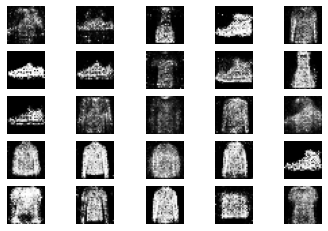

22801 [Discriminator loss: 0.321104, acc.: 89.06%] [Generator loss: 1.220420]
22802 [Discriminator loss: 0.500379, acc.: 73.44%] [Generator loss: 1.250144]
22803 [Discriminator loss: 0.285118, acc.: 90.62%] [Generator loss: 1.353042]
22804 [Discriminator loss: 0.453231, acc.: 82.81%] [Generator loss: 1.087229]
22805 [Discriminator loss: 0.443887, acc.: 78.12%] [Generator loss: 1.130728]
22806 [Discriminator loss: 0.373716, acc.: 82.81%] [Generator loss: 1.653920]
22807 [Discriminator loss: 0.282496, acc.: 93.75%] [Generator loss: 1.225938]
22808 [Discriminator loss: 0.376604, acc.: 79.69%] [Generator loss: 1.148561]
22809 [Discriminator loss: 0.326431, acc.: 87.50%] [Generator loss: 1.391009]
22810 [Discriminator loss: 0.331734, acc.: 89.06%] [Generator loss: 0.867254]
22811 [Discriminator loss: 0.332833, acc.: 84.38%] [Generator loss: 1.256472]
22812 [Discriminator loss: 0.221585, acc.: 90.62%] [Generator loss: 1.331632]
22813 [Discriminator loss: 0.351481, acc.: 81.25%] [Generator lo

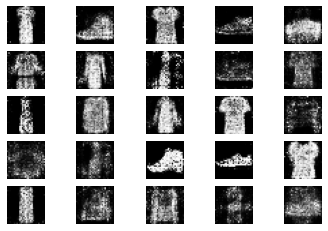

23001 [Discriminator loss: 0.459233, acc.: 79.69%] [Generator loss: 0.778506]
23002 [Discriminator loss: 0.301701, acc.: 87.50%] [Generator loss: 0.903351]
23003 [Discriminator loss: 0.237394, acc.: 89.06%] [Generator loss: 1.057253]
23004 [Discriminator loss: 0.466759, acc.: 76.56%] [Generator loss: 0.608498]
23005 [Discriminator loss: 0.321820, acc.: 85.94%] [Generator loss: 0.801706]
23006 [Discriminator loss: 0.281326, acc.: 93.75%] [Generator loss: 1.095923]
23007 [Discriminator loss: 0.365024, acc.: 84.38%] [Generator loss: 0.927685]
23008 [Discriminator loss: 0.435824, acc.: 79.69%] [Generator loss: 0.979571]
23009 [Discriminator loss: 0.313114, acc.: 87.50%] [Generator loss: 1.145657]
23010 [Discriminator loss: 0.303027, acc.: 90.62%] [Generator loss: 1.159378]
23011 [Discriminator loss: 0.279092, acc.: 90.62%] [Generator loss: 1.103611]
23012 [Discriminator loss: 0.391757, acc.: 79.69%] [Generator loss: 1.049958]
23013 [Discriminator loss: 0.350166, acc.: 82.81%] [Generator lo

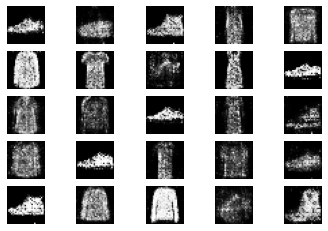

23201 [Discriminator loss: 0.253275, acc.: 90.62%] [Generator loss: 1.291122]
23202 [Discriminator loss: 0.405521, acc.: 82.81%] [Generator loss: 1.085621]
23203 [Discriminator loss: 0.356221, acc.: 85.94%] [Generator loss: 1.435510]
23204 [Discriminator loss: 0.257263, acc.: 92.19%] [Generator loss: 1.363644]
23205 [Discriminator loss: 0.246710, acc.: 89.06%] [Generator loss: 1.036231]
23206 [Discriminator loss: 0.277908, acc.: 89.06%] [Generator loss: 0.790800]
23207 [Discriminator loss: 0.349528, acc.: 85.94%] [Generator loss: 0.808462]
23208 [Discriminator loss: 0.326247, acc.: 89.06%] [Generator loss: 0.828148]
23209 [Discriminator loss: 0.310455, acc.: 89.06%] [Generator loss: 0.936096]
23210 [Discriminator loss: 0.343229, acc.: 84.38%] [Generator loss: 0.990754]
23211 [Discriminator loss: 0.364965, acc.: 78.12%] [Generator loss: 0.776636]
23212 [Discriminator loss: 0.342643, acc.: 87.50%] [Generator loss: 0.930516]
23213 [Discriminator loss: 0.350290, acc.: 79.69%] [Generator lo

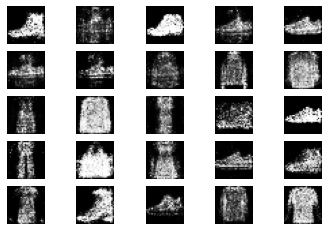

23401 [Discriminator loss: 0.221062, acc.: 90.62%] [Generator loss: 1.378223]
23402 [Discriminator loss: 0.536024, acc.: 71.88%] [Generator loss: 1.278915]
23403 [Discriminator loss: 0.411992, acc.: 79.69%] [Generator loss: 1.329947]
23404 [Discriminator loss: 0.370772, acc.: 81.25%] [Generator loss: 1.296312]
23405 [Discriminator loss: 0.512349, acc.: 81.25%] [Generator loss: 1.673237]
23406 [Discriminator loss: 0.379670, acc.: 84.38%] [Generator loss: 1.264831]
23407 [Discriminator loss: 0.342636, acc.: 84.38%] [Generator loss: 0.927889]
23408 [Discriminator loss: 0.288639, acc.: 85.94%] [Generator loss: 1.204908]
23409 [Discriminator loss: 0.271131, acc.: 90.62%] [Generator loss: 1.028427]
23410 [Discriminator loss: 0.399782, acc.: 85.94%] [Generator loss: 0.938329]
23411 [Discriminator loss: 0.275153, acc.: 89.06%] [Generator loss: 1.054640]
23412 [Discriminator loss: 0.333876, acc.: 82.81%] [Generator loss: 1.655823]
23413 [Discriminator loss: 0.319745, acc.: 84.38%] [Generator lo

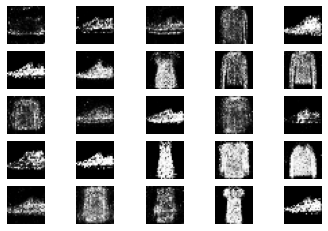

23601 [Discriminator loss: 0.281830, acc.: 84.38%] [Generator loss: 1.058843]
23602 [Discriminator loss: 0.408685, acc.: 85.94%] [Generator loss: 1.196319]
23603 [Discriminator loss: 0.273441, acc.: 90.62%] [Generator loss: 1.214352]
23604 [Discriminator loss: 0.256908, acc.: 87.50%] [Generator loss: 1.620877]
23605 [Discriminator loss: 0.413766, acc.: 78.12%] [Generator loss: 1.443240]
23606 [Discriminator loss: 0.356552, acc.: 81.25%] [Generator loss: 1.534371]
23607 [Discriminator loss: 0.226595, acc.: 92.19%] [Generator loss: 1.814332]
23608 [Discriminator loss: 0.457061, acc.: 76.56%] [Generator loss: 1.125611]
23609 [Discriminator loss: 0.399102, acc.: 81.25%] [Generator loss: 1.675287]
23610 [Discriminator loss: 0.278738, acc.: 90.62%] [Generator loss: 1.731761]
23611 [Discriminator loss: 0.319974, acc.: 92.19%] [Generator loss: 1.295532]
23612 [Discriminator loss: 0.415520, acc.: 84.38%] [Generator loss: 1.407918]
23613 [Discriminator loss: 0.341663, acc.: 82.81%] [Generator lo

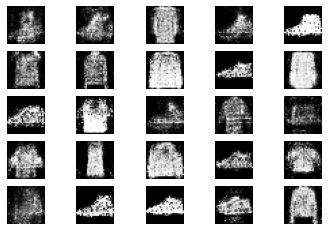

23801 [Discriminator loss: 0.398052, acc.: 79.69%] [Generator loss: 1.589182]
23802 [Discriminator loss: 0.277539, acc.: 85.94%] [Generator loss: 1.230814]
23803 [Discriminator loss: 0.236460, acc.: 93.75%] [Generator loss: 1.089557]
23804 [Discriminator loss: 0.377151, acc.: 82.81%] [Generator loss: 1.123899]
23805 [Discriminator loss: 0.312939, acc.: 87.50%] [Generator loss: 1.155956]
23806 [Discriminator loss: 0.343133, acc.: 82.81%] [Generator loss: 1.498540]
23807 [Discriminator loss: 0.356542, acc.: 87.50%] [Generator loss: 1.523922]
23808 [Discriminator loss: 0.313949, acc.: 89.06%] [Generator loss: 1.268481]
23809 [Discriminator loss: 0.297988, acc.: 87.50%] [Generator loss: 1.510967]
23810 [Discriminator loss: 0.302684, acc.: 87.50%] [Generator loss: 1.760374]
23811 [Discriminator loss: 0.335376, acc.: 81.25%] [Generator loss: 1.432159]
23812 [Discriminator loss: 0.296324, acc.: 92.19%] [Generator loss: 1.618223]
23813 [Discriminator loss: 0.268116, acc.: 90.62%] [Generator lo

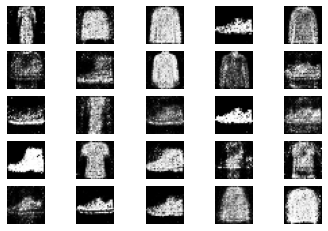

24001 [Discriminator loss: 0.309887, acc.: 89.06%] [Generator loss: 1.593177]
24002 [Discriminator loss: 0.414894, acc.: 78.12%] [Generator loss: 2.294535]
24003 [Discriminator loss: 0.365770, acc.: 81.25%] [Generator loss: 1.644798]
24004 [Discriminator loss: 0.333697, acc.: 87.50%] [Generator loss: 1.565031]
24005 [Discriminator loss: 0.472409, acc.: 87.50%] [Generator loss: 1.365566]
24006 [Discriminator loss: 0.342904, acc.: 85.94%] [Generator loss: 0.996404]
24007 [Discriminator loss: 0.353738, acc.: 89.06%] [Generator loss: 1.096955]
24008 [Discriminator loss: 0.387754, acc.: 84.38%] [Generator loss: 1.711919]
24009 [Discriminator loss: 0.346407, acc.: 84.38%] [Generator loss: 1.299333]
24010 [Discriminator loss: 0.430986, acc.: 81.25%] [Generator loss: 0.856192]
24011 [Discriminator loss: 0.362296, acc.: 85.94%] [Generator loss: 0.999190]
24012 [Discriminator loss: 0.276573, acc.: 90.62%] [Generator loss: 0.653244]
24013 [Discriminator loss: 0.437130, acc.: 79.69%] [Generator lo

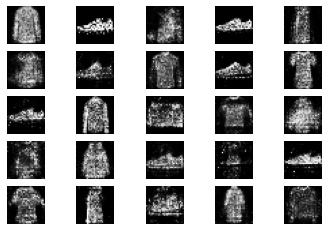

24201 [Discriminator loss: 0.401032, acc.: 84.38%] [Generator loss: 1.081224]
24202 [Discriminator loss: 0.286812, acc.: 89.06%] [Generator loss: 1.356320]
24203 [Discriminator loss: 0.341708, acc.: 82.81%] [Generator loss: 1.779251]
24204 [Discriminator loss: 0.298538, acc.: 90.62%] [Generator loss: 1.802868]
24205 [Discriminator loss: 0.510599, acc.: 75.00%] [Generator loss: 1.238709]
24206 [Discriminator loss: 0.285452, acc.: 87.50%] [Generator loss: 1.349473]
24207 [Discriminator loss: 0.299972, acc.: 87.50%] [Generator loss: 1.378872]
24208 [Discriminator loss: 0.302981, acc.: 89.06%] [Generator loss: 1.200400]
24209 [Discriminator loss: 0.223850, acc.: 90.62%] [Generator loss: 1.165617]
24210 [Discriminator loss: 0.301654, acc.: 89.06%] [Generator loss: 1.282451]
24211 [Discriminator loss: 0.595136, acc.: 73.44%] [Generator loss: 1.332771]
24212 [Discriminator loss: 0.375977, acc.: 84.38%] [Generator loss: 1.483639]
24213 [Discriminator loss: 0.368153, acc.: 85.94%] [Generator lo

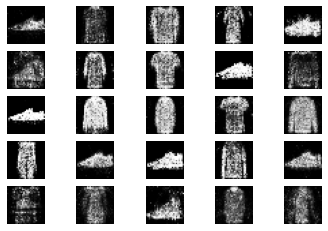

24401 [Discriminator loss: 0.245151, acc.: 93.75%] [Generator loss: 1.657935]
24402 [Discriminator loss: 0.398695, acc.: 84.38%] [Generator loss: 1.177827]
24403 [Discriminator loss: 0.317477, acc.: 84.38%] [Generator loss: 1.428189]
24404 [Discriminator loss: 0.415863, acc.: 76.56%] [Generator loss: 1.368153]
24405 [Discriminator loss: 0.284846, acc.: 92.19%] [Generator loss: 1.277615]
24406 [Discriminator loss: 0.324806, acc.: 78.12%] [Generator loss: 1.480026]
24407 [Discriminator loss: 0.444250, acc.: 78.12%] [Generator loss: 1.248998]
24408 [Discriminator loss: 0.399673, acc.: 78.12%] [Generator loss: 1.735638]
24409 [Discriminator loss: 0.269753, acc.: 92.19%] [Generator loss: 1.737545]
24410 [Discriminator loss: 0.429876, acc.: 82.81%] [Generator loss: 1.502706]
24411 [Discriminator loss: 0.505567, acc.: 76.56%] [Generator loss: 1.119583]
24412 [Discriminator loss: 0.333484, acc.: 82.81%] [Generator loss: 0.833201]
24413 [Discriminator loss: 0.251908, acc.: 89.06%] [Generator lo

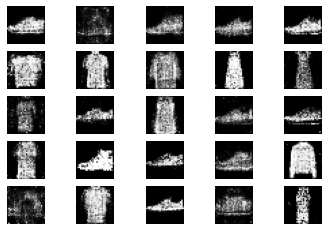

24601 [Discriminator loss: 0.285260, acc.: 87.50%] [Generator loss: 1.338768]
24602 [Discriminator loss: 0.346672, acc.: 82.81%] [Generator loss: 1.084040]
24603 [Discriminator loss: 0.308239, acc.: 85.94%] [Generator loss: 1.019914]
24604 [Discriminator loss: 0.515149, acc.: 78.12%] [Generator loss: 1.257982]
24605 [Discriminator loss: 0.275902, acc.: 87.50%] [Generator loss: 1.370975]
24606 [Discriminator loss: 0.296265, acc.: 85.94%] [Generator loss: 1.136587]
24607 [Discriminator loss: 0.292206, acc.: 85.94%] [Generator loss: 1.425286]
24608 [Discriminator loss: 0.328239, acc.: 87.50%] [Generator loss: 1.503844]
24609 [Discriminator loss: 0.216168, acc.: 96.88%] [Generator loss: 1.205571]
24610 [Discriminator loss: 0.378000, acc.: 82.81%] [Generator loss: 1.283101]
24611 [Discriminator loss: 0.393515, acc.: 79.69%] [Generator loss: 1.579663]
24612 [Discriminator loss: 0.232922, acc.: 90.62%] [Generator loss: 1.442642]
24613 [Discriminator loss: 0.302560, acc.: 85.94%] [Generator lo

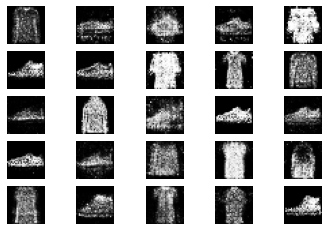

24801 [Discriminator loss: 0.215155, acc.: 95.31%] [Generator loss: 1.231543]
24802 [Discriminator loss: 0.376314, acc.: 79.69%] [Generator loss: 1.240309]
24803 [Discriminator loss: 0.249775, acc.: 90.62%] [Generator loss: 1.233834]
24804 [Discriminator loss: 0.335597, acc.: 85.94%] [Generator loss: 1.214513]
24805 [Discriminator loss: 0.344310, acc.: 84.38%] [Generator loss: 1.265819]
24806 [Discriminator loss: 0.254297, acc.: 85.94%] [Generator loss: 1.411144]
24807 [Discriminator loss: 0.356325, acc.: 84.38%] [Generator loss: 1.035486]
24808 [Discriminator loss: 0.318598, acc.: 89.06%] [Generator loss: 1.110174]
24809 [Discriminator loss: 0.358995, acc.: 81.25%] [Generator loss: 1.204634]
24810 [Discriminator loss: 0.279319, acc.: 87.50%] [Generator loss: 1.551561]
24811 [Discriminator loss: 0.426736, acc.: 84.38%] [Generator loss: 1.477775]
24812 [Discriminator loss: 0.399119, acc.: 79.69%] [Generator loss: 1.353422]
24813 [Discriminator loss: 0.241760, acc.: 90.62%] [Generator lo

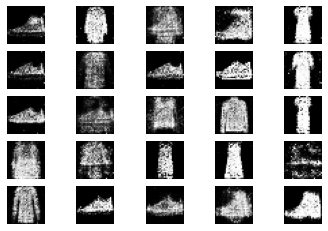

25001 [Discriminator loss: 0.389704, acc.: 79.69%] [Generator loss: 1.984887]
25002 [Discriminator loss: 0.468549, acc.: 76.56%] [Generator loss: 1.965548]
25003 [Discriminator loss: 0.393800, acc.: 79.69%] [Generator loss: 1.423495]
25004 [Discriminator loss: 0.317283, acc.: 85.94%] [Generator loss: 1.132534]
25005 [Discriminator loss: 0.404320, acc.: 81.25%] [Generator loss: 1.072348]
25006 [Discriminator loss: 0.340704, acc.: 84.38%] [Generator loss: 1.367518]
25007 [Discriminator loss: 0.558285, acc.: 75.00%] [Generator loss: 1.088577]
25008 [Discriminator loss: 0.282427, acc.: 93.75%] [Generator loss: 1.466537]
25009 [Discriminator loss: 0.271861, acc.: 92.19%] [Generator loss: 1.321438]
25010 [Discriminator loss: 0.509236, acc.: 70.31%] [Generator loss: 1.231183]
25011 [Discriminator loss: 0.375894, acc.: 82.81%] [Generator loss: 1.568472]
25012 [Discriminator loss: 0.312949, acc.: 84.38%] [Generator loss: 1.203487]
25013 [Discriminator loss: 0.580608, acc.: 68.75%] [Generator lo

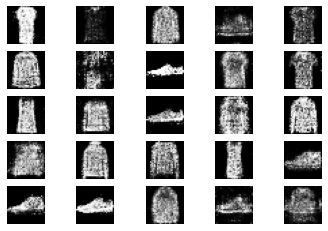

25201 [Discriminator loss: 0.340148, acc.: 84.38%] [Generator loss: 1.844479]
25202 [Discriminator loss: 0.333211, acc.: 85.94%] [Generator loss: 1.915869]
25203 [Discriminator loss: 0.327600, acc.: 90.62%] [Generator loss: 1.099128]
25204 [Discriminator loss: 0.494841, acc.: 71.88%] [Generator loss: 1.502480]
25205 [Discriminator loss: 0.414963, acc.: 79.69%] [Generator loss: 1.676637]
25206 [Discriminator loss: 0.362583, acc.: 82.81%] [Generator loss: 1.612771]
25207 [Discriminator loss: 0.508845, acc.: 68.75%] [Generator loss: 1.120282]
25208 [Discriminator loss: 0.293657, acc.: 85.94%] [Generator loss: 1.901411]
25209 [Discriminator loss: 0.447663, acc.: 84.38%] [Generator loss: 2.129758]
25210 [Discriminator loss: 0.388462, acc.: 78.12%] [Generator loss: 1.308512]
25211 [Discriminator loss: 0.377254, acc.: 85.94%] [Generator loss: 1.439039]
25212 [Discriminator loss: 0.353490, acc.: 81.25%] [Generator loss: 2.146520]
25213 [Discriminator loss: 0.281160, acc.: 90.62%] [Generator lo

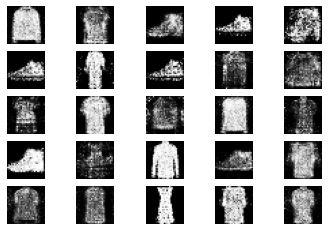

25401 [Discriminator loss: 0.314598, acc.: 89.06%] [Generator loss: 1.663997]
25402 [Discriminator loss: 0.427957, acc.: 82.81%] [Generator loss: 1.803431]
25403 [Discriminator loss: 0.223377, acc.: 93.75%] [Generator loss: 1.562205]
25404 [Discriminator loss: 0.304097, acc.: 89.06%] [Generator loss: 2.123163]
25405 [Discriminator loss: 0.251821, acc.: 92.19%] [Generator loss: 1.714185]
25406 [Discriminator loss: 0.469246, acc.: 75.00%] [Generator loss: 1.380056]
25407 [Discriminator loss: 0.323890, acc.: 87.50%] [Generator loss: 1.616202]
25408 [Discriminator loss: 0.424172, acc.: 79.69%] [Generator loss: 1.550461]
25409 [Discriminator loss: 0.283425, acc.: 89.06%] [Generator loss: 1.470814]
25410 [Discriminator loss: 0.493967, acc.: 75.00%] [Generator loss: 0.971684]
25411 [Discriminator loss: 0.365885, acc.: 82.81%] [Generator loss: 1.086904]
25412 [Discriminator loss: 0.381024, acc.: 84.38%] [Generator loss: 1.311887]
25413 [Discriminator loss: 0.267350, acc.: 87.50%] [Generator lo

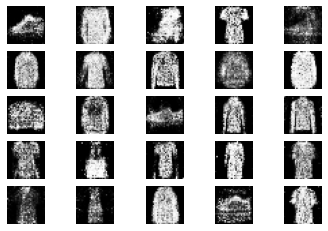

25601 [Discriminator loss: 0.281288, acc.: 85.94%] [Generator loss: 1.281470]
25602 [Discriminator loss: 0.332639, acc.: 84.38%] [Generator loss: 1.509289]
25603 [Discriminator loss: 0.476327, acc.: 79.69%] [Generator loss: 1.571293]
25604 [Discriminator loss: 0.300812, acc.: 84.38%] [Generator loss: 1.795731]
25605 [Discriminator loss: 0.522242, acc.: 78.12%] [Generator loss: 1.195022]
25606 [Discriminator loss: 0.236874, acc.: 90.62%] [Generator loss: 1.847928]
25607 [Discriminator loss: 0.387864, acc.: 82.81%] [Generator loss: 1.505097]
25608 [Discriminator loss: 0.496531, acc.: 75.00%] [Generator loss: 1.345379]
25609 [Discriminator loss: 0.401650, acc.: 79.69%] [Generator loss: 1.580914]
25610 [Discriminator loss: 0.276312, acc.: 89.06%] [Generator loss: 1.325644]
25611 [Discriminator loss: 0.291135, acc.: 84.38%] [Generator loss: 1.481937]
25612 [Discriminator loss: 0.406797, acc.: 84.38%] [Generator loss: 1.522759]
25613 [Discriminator loss: 0.398171, acc.: 79.69%] [Generator lo

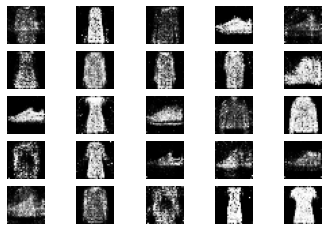

25801 [Discriminator loss: 0.355615, acc.: 85.94%] [Generator loss: 1.376515]
25802 [Discriminator loss: 0.225469, acc.: 92.19%] [Generator loss: 1.266215]
25803 [Discriminator loss: 0.350022, acc.: 84.38%] [Generator loss: 1.728087]
25804 [Discriminator loss: 0.316774, acc.: 87.50%] [Generator loss: 1.481033]
25805 [Discriminator loss: 0.511663, acc.: 78.12%] [Generator loss: 1.919574]
25806 [Discriminator loss: 0.427240, acc.: 71.88%] [Generator loss: 2.001593]
25807 [Discriminator loss: 0.396983, acc.: 81.25%] [Generator loss: 1.740912]
25808 [Discriminator loss: 0.502845, acc.: 79.69%] [Generator loss: 1.508719]
25809 [Discriminator loss: 0.209245, acc.: 93.75%] [Generator loss: 1.476369]
25810 [Discriminator loss: 0.343319, acc.: 82.81%] [Generator loss: 1.858295]
25811 [Discriminator loss: 0.568456, acc.: 71.88%] [Generator loss: 0.962649]
25812 [Discriminator loss: 0.355590, acc.: 81.25%] [Generator loss: 1.544552]
25813 [Discriminator loss: 0.394415, acc.: 84.38%] [Generator lo

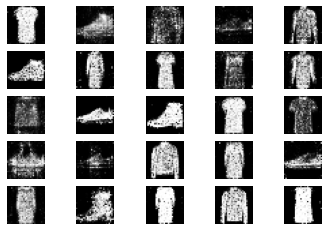

26001 [Discriminator loss: 0.547543, acc.: 76.56%] [Generator loss: 1.748485]
26002 [Discriminator loss: 0.400167, acc.: 82.81%] [Generator loss: 1.862548]
26003 [Discriminator loss: 0.298959, acc.: 85.94%] [Generator loss: 1.792884]
26004 [Discriminator loss: 0.437407, acc.: 81.25%] [Generator loss: 1.687805]
26005 [Discriminator loss: 0.376506, acc.: 85.94%] [Generator loss: 1.152617]
26006 [Discriminator loss: 0.425195, acc.: 79.69%] [Generator loss: 1.211007]
26007 [Discriminator loss: 0.323613, acc.: 85.94%] [Generator loss: 1.487844]
26008 [Discriminator loss: 0.400704, acc.: 81.25%] [Generator loss: 1.571858]
26009 [Discriminator loss: 0.352095, acc.: 87.50%] [Generator loss: 1.460890]
26010 [Discriminator loss: 0.237135, acc.: 92.19%] [Generator loss: 1.453704]
26011 [Discriminator loss: 0.434424, acc.: 75.00%] [Generator loss: 1.204918]
26012 [Discriminator loss: 0.259610, acc.: 90.62%] [Generator loss: 1.876853]
26013 [Discriminator loss: 0.377653, acc.: 82.81%] [Generator lo

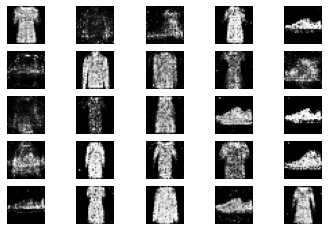

26201 [Discriminator loss: 0.367892, acc.: 89.06%] [Generator loss: 1.399205]
26202 [Discriminator loss: 0.287688, acc.: 89.06%] [Generator loss: 1.464879]
26203 [Discriminator loss: 0.319845, acc.: 89.06%] [Generator loss: 1.472266]
26204 [Discriminator loss: 0.213773, acc.: 90.62%] [Generator loss: 1.551220]
26205 [Discriminator loss: 0.266530, acc.: 89.06%] [Generator loss: 1.353985]
26206 [Discriminator loss: 0.415630, acc.: 82.81%] [Generator loss: 1.984796]
26207 [Discriminator loss: 0.507481, acc.: 70.31%] [Generator loss: 1.207346]
26208 [Discriminator loss: 0.350867, acc.: 84.38%] [Generator loss: 1.647689]
26209 [Discriminator loss: 0.316639, acc.: 89.06%] [Generator loss: 1.268421]
26210 [Discriminator loss: 0.233295, acc.: 93.75%] [Generator loss: 1.078411]
26211 [Discriminator loss: 0.267300, acc.: 89.06%] [Generator loss: 1.322065]
26212 [Discriminator loss: 0.401511, acc.: 81.25%] [Generator loss: 1.317811]
26213 [Discriminator loss: 0.349045, acc.: 79.69%] [Generator lo

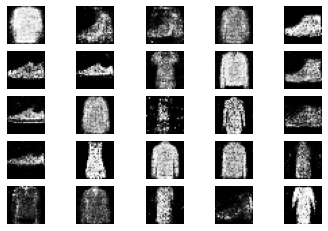

26401 [Discriminator loss: 0.280132, acc.: 89.06%] [Generator loss: 1.544698]
26402 [Discriminator loss: 0.349855, acc.: 85.94%] [Generator loss: 1.414572]
26403 [Discriminator loss: 0.306548, acc.: 89.06%] [Generator loss: 1.472017]
26404 [Discriminator loss: 0.429021, acc.: 76.56%] [Generator loss: 1.156473]
26405 [Discriminator loss: 0.269657, acc.: 92.19%] [Generator loss: 1.542487]
26406 [Discriminator loss: 0.457800, acc.: 81.25%] [Generator loss: 1.652462]
26407 [Discriminator loss: 0.411325, acc.: 79.69%] [Generator loss: 1.516225]
26408 [Discriminator loss: 0.319417, acc.: 82.81%] [Generator loss: 1.603740]
26409 [Discriminator loss: 0.370737, acc.: 84.38%] [Generator loss: 1.262495]
26410 [Discriminator loss: 0.622419, acc.: 71.88%] [Generator loss: 1.612518]
26411 [Discriminator loss: 0.392878, acc.: 76.56%] [Generator loss: 1.949352]
26412 [Discriminator loss: 0.346387, acc.: 81.25%] [Generator loss: 2.120359]
26413 [Discriminator loss: 0.326570, acc.: 87.50%] [Generator lo

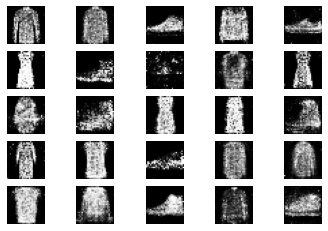

26601 [Discriminator loss: 0.294879, acc.: 87.50%] [Generator loss: 1.339038]
26602 [Discriminator loss: 0.267759, acc.: 93.75%] [Generator loss: 1.809071]
26603 [Discriminator loss: 0.370918, acc.: 81.25%] [Generator loss: 1.556608]
26604 [Discriminator loss: 0.408214, acc.: 76.56%] [Generator loss: 1.635491]
26605 [Discriminator loss: 0.269908, acc.: 89.06%] [Generator loss: 1.034020]
26606 [Discriminator loss: 0.226113, acc.: 93.75%] [Generator loss: 1.360479]
26607 [Discriminator loss: 0.424168, acc.: 76.56%] [Generator loss: 1.293838]
26608 [Discriminator loss: 0.419269, acc.: 81.25%] [Generator loss: 1.769823]
26609 [Discriminator loss: 0.388312, acc.: 81.25%] [Generator loss: 1.022802]
26610 [Discriminator loss: 0.267938, acc.: 87.50%] [Generator loss: 1.318485]
26611 [Discriminator loss: 0.330243, acc.: 84.38%] [Generator loss: 0.721882]
26612 [Discriminator loss: 0.354363, acc.: 84.38%] [Generator loss: 1.166692]
26613 [Discriminator loss: 0.250492, acc.: 93.75%] [Generator lo

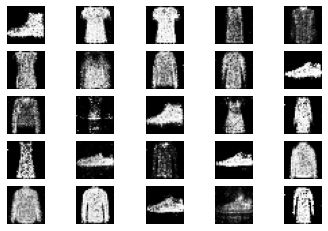

26801 [Discriminator loss: 0.509532, acc.: 82.81%] [Generator loss: 1.305993]
26802 [Discriminator loss: 0.307506, acc.: 89.06%] [Generator loss: 1.423671]
26803 [Discriminator loss: 0.251183, acc.: 92.19%] [Generator loss: 1.526802]
26804 [Discriminator loss: 0.301971, acc.: 84.38%] [Generator loss: 1.706476]
26805 [Discriminator loss: 0.396057, acc.: 87.50%] [Generator loss: 1.565690]
26806 [Discriminator loss: 0.441699, acc.: 82.81%] [Generator loss: 1.537833]
26807 [Discriminator loss: 0.309982, acc.: 85.94%] [Generator loss: 2.373607]
26808 [Discriminator loss: 0.412980, acc.: 79.69%] [Generator loss: 1.958277]
26809 [Discriminator loss: 0.191762, acc.: 92.19%] [Generator loss: 1.740832]
26810 [Discriminator loss: 0.407633, acc.: 81.25%] [Generator loss: 1.389810]
26811 [Discriminator loss: 0.331229, acc.: 82.81%] [Generator loss: 1.678452]
26812 [Discriminator loss: 0.205369, acc.: 90.62%] [Generator loss: 1.503097]
26813 [Discriminator loss: 0.331912, acc.: 82.81%] [Generator lo

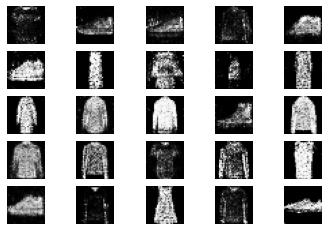

27001 [Discriminator loss: 0.355340, acc.: 87.50%] [Generator loss: 1.314932]
27002 [Discriminator loss: 0.408728, acc.: 79.69%] [Generator loss: 1.088793]
27003 [Discriminator loss: 0.308875, acc.: 87.50%] [Generator loss: 1.395560]
27004 [Discriminator loss: 0.304978, acc.: 87.50%] [Generator loss: 1.370899]
27005 [Discriminator loss: 0.531138, acc.: 76.56%] [Generator loss: 1.503310]
27006 [Discriminator loss: 0.286429, acc.: 87.50%] [Generator loss: 1.219607]
27007 [Discriminator loss: 0.426696, acc.: 78.12%] [Generator loss: 1.227847]
27008 [Discriminator loss: 0.435420, acc.: 79.69%] [Generator loss: 1.243446]
27009 [Discriminator loss: 0.297596, acc.: 92.19%] [Generator loss: 1.399386]
27010 [Discriminator loss: 0.277349, acc.: 85.94%] [Generator loss: 1.665409]
27011 [Discriminator loss: 0.260947, acc.: 89.06%] [Generator loss: 1.387930]
27012 [Discriminator loss: 0.641901, acc.: 75.00%] [Generator loss: 1.322443]
27013 [Discriminator loss: 0.368364, acc.: 79.69%] [Generator lo

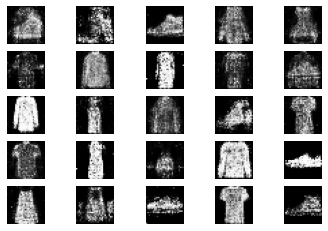

27201 [Discriminator loss: 0.514325, acc.: 78.12%] [Generator loss: 1.302864]
27202 [Discriminator loss: 0.287209, acc.: 89.06%] [Generator loss: 0.963179]
27203 [Discriminator loss: 0.391395, acc.: 85.94%] [Generator loss: 1.363280]
27204 [Discriminator loss: 0.311009, acc.: 87.50%] [Generator loss: 1.264801]
27205 [Discriminator loss: 0.374197, acc.: 84.38%] [Generator loss: 1.573047]
27206 [Discriminator loss: 0.316344, acc.: 84.38%] [Generator loss: 1.203974]
27207 [Discriminator loss: 0.322558, acc.: 84.38%] [Generator loss: 1.262616]
27208 [Discriminator loss: 0.383102, acc.: 85.94%] [Generator loss: 1.256113]
27209 [Discriminator loss: 0.507611, acc.: 78.12%] [Generator loss: 0.976364]
27210 [Discriminator loss: 0.295775, acc.: 87.50%] [Generator loss: 1.132519]
27211 [Discriminator loss: 0.490448, acc.: 76.56%] [Generator loss: 1.161188]
27212 [Discriminator loss: 0.272215, acc.: 84.38%] [Generator loss: 1.124000]
27213 [Discriminator loss: 0.295360, acc.: 87.50%] [Generator lo

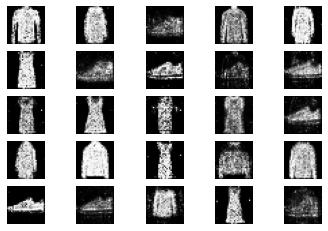

27401 [Discriminator loss: 0.514636, acc.: 73.44%] [Generator loss: 1.194545]
27402 [Discriminator loss: 0.335698, acc.: 82.81%] [Generator loss: 1.636150]
27403 [Discriminator loss: 0.315063, acc.: 84.38%] [Generator loss: 1.309803]
27404 [Discriminator loss: 0.391863, acc.: 79.69%] [Generator loss: 1.612139]
27405 [Discriminator loss: 0.366989, acc.: 84.38%] [Generator loss: 1.629754]
27406 [Discriminator loss: 0.415234, acc.: 76.56%] [Generator loss: 1.362168]
27407 [Discriminator loss: 0.350116, acc.: 85.94%] [Generator loss: 1.529159]
27408 [Discriminator loss: 0.348787, acc.: 87.50%] [Generator loss: 1.359407]
27409 [Discriminator loss: 0.593394, acc.: 78.12%] [Generator loss: 1.568899]
27410 [Discriminator loss: 0.330073, acc.: 84.38%] [Generator loss: 1.529795]
27411 [Discriminator loss: 0.356829, acc.: 81.25%] [Generator loss: 1.364080]
27412 [Discriminator loss: 0.347703, acc.: 82.81%] [Generator loss: 1.168413]
27413 [Discriminator loss: 0.213240, acc.: 93.75%] [Generator lo

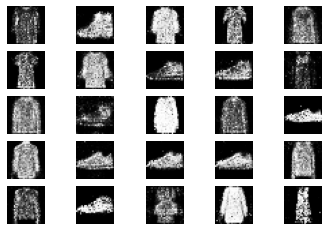

27601 [Discriminator loss: 0.396575, acc.: 78.12%] [Generator loss: 1.531310]
27602 [Discriminator loss: 0.454592, acc.: 76.56%] [Generator loss: 1.156482]
27603 [Discriminator loss: 0.300140, acc.: 90.62%] [Generator loss: 1.132827]
27604 [Discriminator loss: 0.396798, acc.: 78.12%] [Generator loss: 1.439863]
27605 [Discriminator loss: 0.287140, acc.: 89.06%] [Generator loss: 1.661397]
27606 [Discriminator loss: 0.333043, acc.: 84.38%] [Generator loss: 1.889370]
27607 [Discriminator loss: 0.364596, acc.: 85.94%] [Generator loss: 1.624708]
27608 [Discriminator loss: 0.271487, acc.: 85.94%] [Generator loss: 2.247733]
27609 [Discriminator loss: 0.490948, acc.: 78.12%] [Generator loss: 1.740167]
27610 [Discriminator loss: 0.308433, acc.: 82.81%] [Generator loss: 1.195668]
27611 [Discriminator loss: 0.340522, acc.: 81.25%] [Generator loss: 1.404577]
27612 [Discriminator loss: 0.333235, acc.: 90.62%] [Generator loss: 1.780667]
27613 [Discriminator loss: 0.425367, acc.: 78.12%] [Generator lo

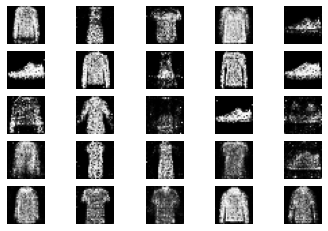

27801 [Discriminator loss: 0.281451, acc.: 87.50%] [Generator loss: 1.524099]
27802 [Discriminator loss: 0.361177, acc.: 82.81%] [Generator loss: 1.610876]
27803 [Discriminator loss: 0.437715, acc.: 79.69%] [Generator loss: 1.512335]
27804 [Discriminator loss: 0.339572, acc.: 81.25%] [Generator loss: 1.424076]
27805 [Discriminator loss: 0.426971, acc.: 79.69%] [Generator loss: 1.627043]
27806 [Discriminator loss: 0.617631, acc.: 70.31%] [Generator loss: 1.654624]
27807 [Discriminator loss: 0.362312, acc.: 82.81%] [Generator loss: 1.284194]
27808 [Discriminator loss: 0.278075, acc.: 87.50%] [Generator loss: 1.342484]
27809 [Discriminator loss: 0.409804, acc.: 81.25%] [Generator loss: 1.170797]
27810 [Discriminator loss: 0.252351, acc.: 90.62%] [Generator loss: 1.511827]
27811 [Discriminator loss: 0.376405, acc.: 81.25%] [Generator loss: 1.168318]
27812 [Discriminator loss: 0.361017, acc.: 84.38%] [Generator loss: 0.941347]
27813 [Discriminator loss: 0.351327, acc.: 87.50%] [Generator lo

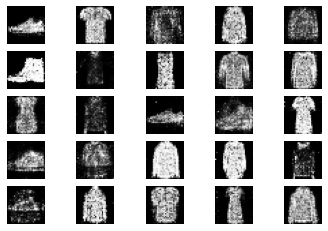

28001 [Discriminator loss: 0.379757, acc.: 89.06%] [Generator loss: 1.200735]
28002 [Discriminator loss: 0.341405, acc.: 92.19%] [Generator loss: 1.235796]
28003 [Discriminator loss: 0.417886, acc.: 79.69%] [Generator loss: 1.310502]
28004 [Discriminator loss: 0.382391, acc.: 79.69%] [Generator loss: 1.207106]
28005 [Discriminator loss: 0.403270, acc.: 84.38%] [Generator loss: 1.365830]
28006 [Discriminator loss: 0.342462, acc.: 85.94%] [Generator loss: 1.399649]
28007 [Discriminator loss: 0.398492, acc.: 85.94%] [Generator loss: 1.656135]
28008 [Discriminator loss: 0.313737, acc.: 90.62%] [Generator loss: 1.348402]
28009 [Discriminator loss: 0.279941, acc.: 89.06%] [Generator loss: 1.035671]
28010 [Discriminator loss: 0.319055, acc.: 87.50%] [Generator loss: 1.086055]
28011 [Discriminator loss: 0.528753, acc.: 71.88%] [Generator loss: 1.429010]
28012 [Discriminator loss: 0.439837, acc.: 76.56%] [Generator loss: 1.487248]
28013 [Discriminator loss: 0.486443, acc.: 70.31%] [Generator lo

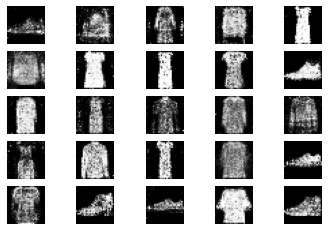

28201 [Discriminator loss: 0.416697, acc.: 84.38%] [Generator loss: 1.471156]
28202 [Discriminator loss: 0.227694, acc.: 93.75%] [Generator loss: 1.205002]
28203 [Discriminator loss: 0.259460, acc.: 87.50%] [Generator loss: 1.412700]
28204 [Discriminator loss: 0.353010, acc.: 81.25%] [Generator loss: 1.076112]
28205 [Discriminator loss: 0.368026, acc.: 85.94%] [Generator loss: 1.880518]
28206 [Discriminator loss: 0.247676, acc.: 90.62%] [Generator loss: 1.542768]
28207 [Discriminator loss: 0.481871, acc.: 78.12%] [Generator loss: 1.457588]
28208 [Discriminator loss: 0.367743, acc.: 76.56%] [Generator loss: 1.231479]
28209 [Discriminator loss: 0.272237, acc.: 85.94%] [Generator loss: 0.995448]
28210 [Discriminator loss: 0.477769, acc.: 79.69%] [Generator loss: 1.337831]
28211 [Discriminator loss: 0.349188, acc.: 81.25%] [Generator loss: 0.868380]
28212 [Discriminator loss: 0.329052, acc.: 84.38%] [Generator loss: 1.429545]
28213 [Discriminator loss: 0.392548, acc.: 84.38%] [Generator lo

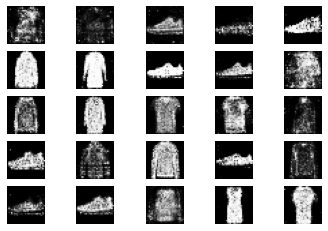

28401 [Discriminator loss: 0.438772, acc.: 76.56%] [Generator loss: 1.256228]
28402 [Discriminator loss: 0.337345, acc.: 82.81%] [Generator loss: 1.269197]
28403 [Discriminator loss: 0.207270, acc.: 98.44%] [Generator loss: 1.240127]
28404 [Discriminator loss: 0.334397, acc.: 81.25%] [Generator loss: 1.430390]
28405 [Discriminator loss: 0.443310, acc.: 79.69%] [Generator loss: 1.316276]
28406 [Discriminator loss: 0.590824, acc.: 67.19%] [Generator loss: 1.197891]
28407 [Discriminator loss: 0.238394, acc.: 89.06%] [Generator loss: 1.050636]
28408 [Discriminator loss: 0.366369, acc.: 82.81%] [Generator loss: 1.263490]
28409 [Discriminator loss: 0.360743, acc.: 87.50%] [Generator loss: 1.302759]
28410 [Discriminator loss: 0.336576, acc.: 82.81%] [Generator loss: 1.586627]
28411 [Discriminator loss: 0.395428, acc.: 81.25%] [Generator loss: 1.177424]
28412 [Discriminator loss: 0.410901, acc.: 75.00%] [Generator loss: 1.162117]
28413 [Discriminator loss: 0.411039, acc.: 79.69%] [Generator lo

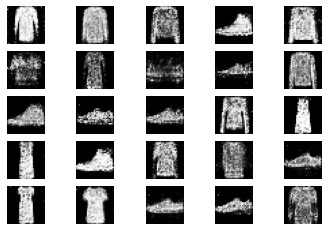

28601 [Discriminator loss: 0.432026, acc.: 78.12%] [Generator loss: 1.069878]
28602 [Discriminator loss: 0.374609, acc.: 84.38%] [Generator loss: 1.631546]
28603 [Discriminator loss: 0.277928, acc.: 90.62%] [Generator loss: 1.633292]
28604 [Discriminator loss: 0.435891, acc.: 79.69%] [Generator loss: 1.322569]
28605 [Discriminator loss: 0.478747, acc.: 73.44%] [Generator loss: 1.428870]
28606 [Discriminator loss: 0.237315, acc.: 92.19%] [Generator loss: 1.301700]
28607 [Discriminator loss: 0.205474, acc.: 92.19%] [Generator loss: 1.195369]
28608 [Discriminator loss: 0.301139, acc.: 89.06%] [Generator loss: 0.963938]
28609 [Discriminator loss: 0.301091, acc.: 87.50%] [Generator loss: 1.237554]
28610 [Discriminator loss: 0.267483, acc.: 89.06%] [Generator loss: 0.920398]
28611 [Discriminator loss: 0.349981, acc.: 84.38%] [Generator loss: 0.772305]
28612 [Discriminator loss: 0.383363, acc.: 79.69%] [Generator loss: 0.952642]
28613 [Discriminator loss: 0.280783, acc.: 89.06%] [Generator lo

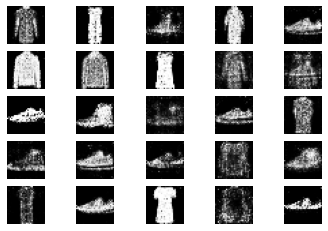

28801 [Discriminator loss: 0.337471, acc.: 82.81%] [Generator loss: 1.270632]
28802 [Discriminator loss: 0.292467, acc.: 87.50%] [Generator loss: 1.624518]
28803 [Discriminator loss: 0.370192, acc.: 81.25%] [Generator loss: 1.255184]
28804 [Discriminator loss: 0.300980, acc.: 85.94%] [Generator loss: 1.638590]
28805 [Discriminator loss: 0.287930, acc.: 84.38%] [Generator loss: 1.685963]
28806 [Discriminator loss: 0.450406, acc.: 84.38%] [Generator loss: 1.330194]
28807 [Discriminator loss: 0.275939, acc.: 90.62%] [Generator loss: 1.388413]
28808 [Discriminator loss: 0.381214, acc.: 84.38%] [Generator loss: 1.716922]
28809 [Discriminator loss: 0.320855, acc.: 87.50%] [Generator loss: 1.251991]
28810 [Discriminator loss: 0.579645, acc.: 70.31%] [Generator loss: 1.375881]
28811 [Discriminator loss: 0.303164, acc.: 85.94%] [Generator loss: 0.861101]
28812 [Discriminator loss: 0.350321, acc.: 79.69%] [Generator loss: 1.322929]
28813 [Discriminator loss: 0.296710, acc.: 87.50%] [Generator lo

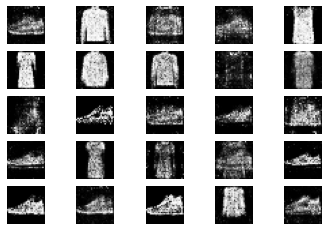

29001 [Discriminator loss: 0.420042, acc.: 84.38%] [Generator loss: 1.414788]
29002 [Discriminator loss: 0.333029, acc.: 85.94%] [Generator loss: 1.394101]
29003 [Discriminator loss: 0.341562, acc.: 79.69%] [Generator loss: 0.995062]
29004 [Discriminator loss: 0.329931, acc.: 85.94%] [Generator loss: 1.159788]
29005 [Discriminator loss: 0.326351, acc.: 82.81%] [Generator loss: 1.254673]
29006 [Discriminator loss: 0.321985, acc.: 87.50%] [Generator loss: 1.135854]
29007 [Discriminator loss: 0.360737, acc.: 85.94%] [Generator loss: 0.914409]
29008 [Discriminator loss: 0.287795, acc.: 85.94%] [Generator loss: 0.872874]
29009 [Discriminator loss: 0.220251, acc.: 93.75%] [Generator loss: 1.149815]
29010 [Discriminator loss: 0.352088, acc.: 87.50%] [Generator loss: 1.164959]
29011 [Discriminator loss: 0.255195, acc.: 95.31%] [Generator loss: 1.327264]
29012 [Discriminator loss: 0.324213, acc.: 87.50%] [Generator loss: 1.166654]
29013 [Discriminator loss: 0.350409, acc.: 81.25%] [Generator lo

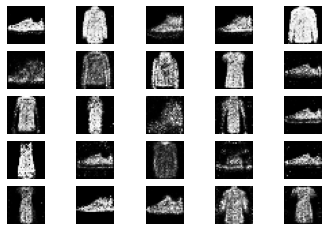

29201 [Discriminator loss: 0.353325, acc.: 81.25%] [Generator loss: 1.342459]
29202 [Discriminator loss: 0.427454, acc.: 84.38%] [Generator loss: 1.339412]
29203 [Discriminator loss: 0.243365, acc.: 90.62%] [Generator loss: 1.766243]
29204 [Discriminator loss: 0.345002, acc.: 85.94%] [Generator loss: 1.273278]
29205 [Discriminator loss: 0.344836, acc.: 85.94%] [Generator loss: 1.689408]
29206 [Discriminator loss: 0.446567, acc.: 78.12%] [Generator loss: 0.813957]
29207 [Discriminator loss: 0.230731, acc.: 93.75%] [Generator loss: 1.313506]
29208 [Discriminator loss: 0.211696, acc.: 95.31%] [Generator loss: 1.534366]
29209 [Discriminator loss: 0.250336, acc.: 89.06%] [Generator loss: 0.974975]
29210 [Discriminator loss: 0.485981, acc.: 73.44%] [Generator loss: 1.212181]
29211 [Discriminator loss: 0.257738, acc.: 82.81%] [Generator loss: 1.141283]
29212 [Discriminator loss: 0.231261, acc.: 90.62%] [Generator loss: 1.835061]
29213 [Discriminator loss: 0.325776, acc.: 84.38%] [Generator lo

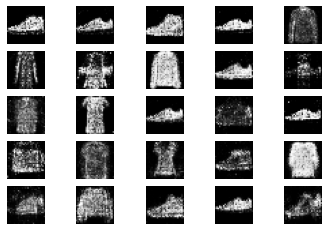

29401 [Discriminator loss: 0.406914, acc.: 87.50%] [Generator loss: 1.534148]
29402 [Discriminator loss: 0.280209, acc.: 90.62%] [Generator loss: 1.214991]
29403 [Discriminator loss: 0.440056, acc.: 76.56%] [Generator loss: 1.361347]
29404 [Discriminator loss: 0.291144, acc.: 85.94%] [Generator loss: 1.008665]
29405 [Discriminator loss: 0.445566, acc.: 75.00%] [Generator loss: 1.253496]
29406 [Discriminator loss: 0.326668, acc.: 87.50%] [Generator loss: 1.108046]
29407 [Discriminator loss: 0.302263, acc.: 87.50%] [Generator loss: 1.050761]
29408 [Discriminator loss: 0.362541, acc.: 87.50%] [Generator loss: 1.636841]
29409 [Discriminator loss: 0.322639, acc.: 81.25%] [Generator loss: 1.198377]
29410 [Discriminator loss: 0.374338, acc.: 84.38%] [Generator loss: 1.100249]
29411 [Discriminator loss: 0.416535, acc.: 84.38%] [Generator loss: 1.452337]
29412 [Discriminator loss: 0.291581, acc.: 85.94%] [Generator loss: 1.379651]
29413 [Discriminator loss: 0.399547, acc.: 81.25%] [Generator lo

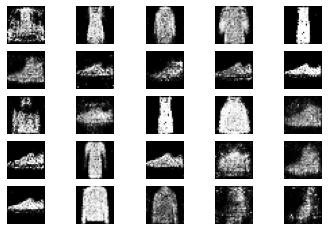

29601 [Discriminator loss: 0.498065, acc.: 76.56%] [Generator loss: 0.953169]
29602 [Discriminator loss: 0.300691, acc.: 89.06%] [Generator loss: 1.100207]
29603 [Discriminator loss: 0.448325, acc.: 78.12%] [Generator loss: 1.147368]
29604 [Discriminator loss: 0.331040, acc.: 84.38%] [Generator loss: 1.104687]
29605 [Discriminator loss: 0.332709, acc.: 85.94%] [Generator loss: 0.952077]
29606 [Discriminator loss: 0.360991, acc.: 82.81%] [Generator loss: 0.855931]
29607 [Discriminator loss: 0.281362, acc.: 85.94%] [Generator loss: 0.696660]
29608 [Discriminator loss: 0.216568, acc.: 90.62%] [Generator loss: 0.972266]
29609 [Discriminator loss: 0.208391, acc.: 92.19%] [Generator loss: 1.384792]
29610 [Discriminator loss: 0.480560, acc.: 76.56%] [Generator loss: 1.046880]
29611 [Discriminator loss: 0.220080, acc.: 92.19%] [Generator loss: 0.883934]
29612 [Discriminator loss: 0.319026, acc.: 84.38%] [Generator loss: 1.155967]
29613 [Discriminator loss: 0.204852, acc.: 95.31%] [Generator lo

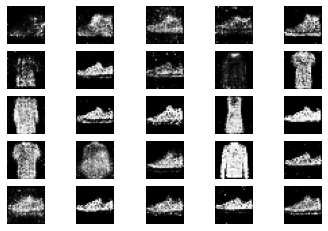

29801 [Discriminator loss: 0.293841, acc.: 89.06%] [Generator loss: 1.233924]
29802 [Discriminator loss: 0.199489, acc.: 95.31%] [Generator loss: 1.416400]
29803 [Discriminator loss: 0.404740, acc.: 79.69%] [Generator loss: 1.109968]
29804 [Discriminator loss: 0.286898, acc.: 92.19%] [Generator loss: 1.730613]
29805 [Discriminator loss: 0.389147, acc.: 81.25%] [Generator loss: 1.226393]
29806 [Discriminator loss: 0.333211, acc.: 87.50%] [Generator loss: 1.217830]
29807 [Discriminator loss: 0.425775, acc.: 81.25%] [Generator loss: 1.221989]
29808 [Discriminator loss: 0.308386, acc.: 84.38%] [Generator loss: 1.539599]
29809 [Discriminator loss: 0.356794, acc.: 84.38%] [Generator loss: 1.256989]
29810 [Discriminator loss: 0.194295, acc.: 93.75%] [Generator loss: 1.173103]
29811 [Discriminator loss: 0.321509, acc.: 85.94%] [Generator loss: 1.008502]
29812 [Discriminator loss: 0.359492, acc.: 81.25%] [Generator loss: 1.621638]
29813 [Discriminator loss: 0.168330, acc.: 93.75%] [Generator lo

In [ ]:
train(generator,discriminator,gan_model,epochs=30000, batch_size=32, sample_interval=200)
